In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files
from statsmodels.tsa.seasonal import seasonal_decompose
from tabulate import tabulate

In [ ]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', 1000)

In [ ]:
site_A_dataset=pd.read_csv("/content/drive/MyDrive/flextreck_datasets/site_A_data.csv",parse_dates=["Timestamp_Local"],index_col=["Timestamp_Local"])
site_B_dataset=pd.read_csv("/content/drive/MyDrive/flextreck_datasets/site_B_data.csv",parse_dates=["Timestamp_Local"],index_col=["Timestamp_Local"])
site_C_dataset=pd.read_csv("/content/drive/MyDrive/flextreck_datasets/site_C_data.csv",parse_dates=["Timestamp_Local"],index_col=["Timestamp_Local"])
site_D_dataset=pd.read_csv("/content/drive/MyDrive/flextreck_datasets/site_D_data.csv",parse_dates=["Timestamp_Local"],index_col=["Timestamp_Local"])
site_E_dataset=pd.read_csv("/content/drive/MyDrive/flextreck_datasets/site_E_data.csv",parse_dates=["Timestamp_Local"],index_col=["Timestamp_Local"])
site_F_dataset=pd.read_csv("/content/drive/MyDrive/flextreck_datasets/site_F_data.csv",parse_dates=["Timestamp_Local"],index_col=["Timestamp_Local"])

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/flextreck_datasets/site_A_data.csv'

In [ ]:
full_df=pd.read_csv('/content/final_submission.csv')


full_df.drop(columns=['Dry_Bulb_Temperature_C','Global_Horizontal_Radiation_W/m2','Building_Power_kW'],inplace=True)
full_df['Demand_Response_Flag']=0
full_df['Demand_Response_Capacity_kW']=0

KeyError: "['Dry_Bulb_Temperature_C', 'Global_Horizontal_Radiation_W/m2', 'Building_Power_kW'] not found in axis"

In [ ]:
full_df.to_csv('full_zero_final_submission.csv',index=False)

In [ ]:
def make_time_numeric(df):
  """
  Extracts date/time based features from data
  """
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
  df['Hour'] = df['Timestamp_Local'].dt.hour
  df['Weekday'] = df['Timestamp_Local'].dt.weekday  # 0 = Monday, 6 = Sunday
  df['Is_Weekend'] = df['Weekday'].isin([5,6])  # Saturday/Sunday
  df['Date'] = df['Timestamp_Local'].dt.date  # for daily aggregation
  df['Month'] = df['Timestamp_Local'].dt.month
  df['Year'] = df['Timestamp_Local'].dt.year

  return df


In [ ]:
site_A=full_df[full_df['Site']=='siteA']
site_B=full_df[full_df['Site']=='siteB']
site_C=full_df[full_df['Site']=='siteC']
site_D=full_df[full_df['Site']=='siteD']
site_E=full_df[full_df['Site']=='siteE']
site_F=full_df[full_df['Site']=='siteF']
site_G=full_df[full_df['Site']=='siteG']
site_H=full_df[full_df['Site']=='siteH']
site_I=full_df[full_df['Site']=='siteI']
site_J=full_df[full_df['Site']=='siteJ']
site_K=full_df[full_df['Site']=='siteK']
site_L=full_df[full_df['Site']=='siteL']
site_M=full_df[full_df['Site']=='siteM']

full_df_dict = {
    "Site_A": site_A,
    "Site_B": site_B,
    "Site_C": site_C,
    "Site_D": site_D,
    "Site_E": site_E,
    "Site_F": site_F,
    "Site_G": site_G,
    "Site_H": site_H,
    "Site_I": site_I,
    "Site_J": site_J,
    "Site_K": site_K,
    "Site_L": site_L,
    "Site_M": site_M
}


In [ ]:
site_A.head()

,Site,Timestamp_Local,Dry_Bulb_Temperature_C,Global_Horizontal_Radiation_W/m2,Building_Power_kW
0,siteA,2020-01-01 00:00:00,19.89,0.0,12.0
1,siteA,2020-01-01 00:15:00,19.79,0.0,12.0
2,siteA,2020-01-01 00:30:00,19.70,0.0,12.0
3,siteA,2020-01-01 00:45:00,19.60,0.0,12.0
4,siteA,2020-01-01 01:00:00,19.50,0.0,12.0


In [ ]:
for key, value in full_df_dict.items():
  #value = make_time_numeric(value)
  value=value.drop(columns=['Dry_Bulb_Temperature_C','Global_Horizontal_Radiation_W/m2','Building_Power_kW'])
  value['Demand_Response_Flag']=0
  value['Demand_Response_Capacity_kW']=0

,Site,Timestamp_Local,Dry_Bulb_Temperature_C,Global_Horizontal_Radiation_W/m2,Building_Power_kW
0,siteA,2020-01-01 00:00:00,19.89,0.0,12.0
1,siteA,2020-01-01 00:15:00,19.79,0.0,12.0
2,siteA,2020-01-01 00:30:00,19.70,0.0,12.0
3,siteA,2020-01-01 00:45:00,19.60,0.0,12.0
4,siteA,2020-01-01 01:00:00,19.50,0.0,12.0


In [ ]:
yearly_dfs = {}  # dictionary to store each (key, year) subset

for key, value in full_df_dict.items():
  print(f"{key}: {value['Year'].value_counts()}")
  unique_years = value['Year'].unique()
  print(f"Unique years: {unique_years}")


  for year in unique_years:
      print(f"Year {year}:")
      subset_df = value[value['Year'] == year]
      yearly_dfs[f"{key}_{year}"] = subset_df  # store in dict with dynamic key
      print(yearly_dfs[f"{key}_{year}"].head())  # optional preview


Site_A: Year
2020    11616
2021    11616
Name: count, dtype: int64
Unique years: [2020 2021]
Year 2020:
    Site     Timestamp_Local  Dry_Bulb_Temperature_C  Global_Horizontal_Radiation_W/m2  Building_Power_kW  Hour  Weekday  Is_Weekend        Date  Month  Year
0  siteA 2020-01-01 00:00:00                   19.89                               0.0               12.0     0        2       False  2020-01-01      1  2020
1  siteA 2020-01-01 00:15:00                   19.79                               0.0               12.0     0        2       False  2020-01-01      1  2020
2  siteA 2020-01-01 00:30:00                   19.70                               0.0               12.0     0        2       False  2020-01-01      1  2020
3  siteA 2020-01-01 00:45:00                   19.60                               0.0               12.0     0        2       False  2020-01-01      1  2020
4  siteA 2020-01-01 01:00:00                   19.50                               0.0               12.0 

In [ ]:
yearly_dfs.keys()

dict_keys(['Site_A_2020', 'Site_A_2021', 'Site_B_2021', 'Site_B_2022', 'Site_C_2020', 'Site_C_2024', 'Site_D_2019', 'Site_D_2022', 'Site_E_2023', 'Site_E_2024', 'Site_F_2021', 'Site_F_2022', 'Site_G_2019', 'Site_G_2022', 'Site_H_2023', 'Site_H_2024', 'Site_I_2021', 'Site_I_2023', 'Site_J_2022', 'Site_J_2023', 'Site_K_2021', 'Site_L_2019', 'Site_L_2022', 'Site_M_2019', 'Site_M_2020'])

In [ ]:
def pretty_print(df, title):
      print(f"\n=== {title} ===")
      print(tabulate(df.reset_index(), headers='keys', tablefmt='psql', showindex=False))

In [ ]:
def get_season_au(month):
    if month in [12, 1, 2]:
        return 'Summer'
    elif month in [3, 4, 5]:
        return 'Autumn'
    elif month in [6, 7, 8]:
        return 'Winter'
    else:
        return 'Spring'

In [ ]:
def plot_flag_comparison(df_name, month, combined_analysis, var_prefix, var_label, flag_type):
    """
    Plots metrics vs avgflg comparison for a given variable and flag type.

    combined_analysis: DataFrame (neg_combined_analysis or pos_combined_analysis)
    var_prefix: str (e.g., "Dry_Bulb_Temperature_C", "Global_Horizontal_Radiation_W/m2", "Building_Power_kW")
    var_label: str (y-axis label, e.g., "Temperature (°C)")
    flag_type: str ("NEG" or "POS")
    """

    # Create full day time index at 15-min intervals
    full_day = pd.date_range("00:00", "23:45", freq="15min").time
    plt.figure(figsize=(14,6))

    # Metrics mean
    combined_analysis[f"{flag_type.lower()}_metrics_{var_prefix}_mean"].plot(
        color='red', label="Metrics Mean"
    )

    # Avg flag mean
    combined_analysis[f"{flag_type.lower()}_avgflg_{'Temp' if 'Temperature' in var_prefix else 'GHI' if 'Radiation' in var_prefix else 'Power'}_mean"].plot(
        color='blue', label="Avg Flag Mean"
    )

    plt.title(f"{df_name} – {month}: Avg {var_label} (mean) vs Time during {flag_type} flags", fontsize=14)
    plt.xlabel("Time of Day", fontsize=12)
    plt.ylabel(var_label, fontsize=12)
    plt.xticks(
        range(len(full_day)),
        [t.strftime("%H:%M") for t in full_day],
        rotation=90,
        fontsize=7
    )
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
sns.set_style("whitegrid")  # cleaner seaborn plots

def plot_variable_profiles(df, variable, df_name):
    """
    Plots daily, average 24-hour, weekday vs weekend, and seasonal hourly profiles
    for a specified variable.

    df: pandas DataFrame with 'Hour', 'Is_Weekend', 'Season', and datetime index
    variable: str, column name to plot
    df_name: str, name of the dataset
    """

    # -------------------
    # Daily min, mean, max
    daily = df.resample('D')[variable].agg(['min','mean','max'])

    plt.figure(figsize=(15, 5))
    plt.plot(daily.index, daily['mean'], label='Daily Mean', linewidth=2)
    plt.plot(daily.index, daily['max'], label='Daily Max', alpha=0.7, linestyle='--')
    plt.plot(daily.index, daily['min'], label='Daily Min', alpha=0.7, linestyle='--')
    plt.title(f"{df_name} – Daily {variable}", fontsize=16)
    plt.xlabel("Date")
    plt.ylabel(variable)
    plt.legend(frameon=False)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # -------------------
    # Average 24-hour profile
    hourly_profile = df.groupby('Hour')[variable].mean()

    plt.figure(figsize=(10,5))
    sns.lineplot(x=hourly_profile.index, y=hourly_profile.values, linewidth=2)
    plt.title(f"{df_name} – Average 24-hour {variable} Profile", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(f"Average {variable}")
    plt.xticks(range(24))
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # -------------------
    # Weekday vs weekend
    weekday_profile = df[df['Is_Weekend']==False].groupby('Hour')[variable].mean()
    weekend_profile = df[df['Is_Weekend']==True].groupby('Hour')[variable].mean()

    plt.figure(figsize=(10,5))
    plt.plot(weekday_profile.index, weekday_profile.values, label='Weekday', linewidth=2)
    plt.plot(weekend_profile.index, weekend_profile.values, label='Weekend', linewidth=2, linestyle='--')
    plt.title(f"{df_name} – Weekday vs Weekend {variable} Profile", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(variable)
    plt.legend(frameon=False)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # -------------------
    # Hourly profile by season
    hourly_season = df.groupby(['Season','Hour'])[variable].mean().reset_index()

    plt.figure(figsize=(12,6))
    sns.lineplot(data=hourly_season, x='Hour', y=variable, hue='Season', palette='Set2')
    plt.title(f"{df_name} – Average 24-hour {variable} by Season", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(variable)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


In [ ]:
sns.set_style("whitegrid")  # cleaner seaborn plots

def analyzing_all_sites(df, df_name):
    df = make_time_numeric(df) # Generate "Hour", "Weekday", "Is_Weekend", "Date", "Month" columns
    df['Season'] = df['Month'].apply(get_season_au) # Generate "Season" column (Australian seasons)
    df = df.set_index('Timestamp_Local')

    # -------------------
    # Aggregations

    # Group timestamps in daily basis and calculate min, mean, max of Temperature, Radiation and Power for each day
    daily = df.resample('D').agg({
        'Dry_Bulb_Temperature_C': ['min','mean','max'],
        'Global_Horizontal_Radiation_W/m2': ['min','mean','max'],
        'Building_Power_kW': ['min','mean','max'],
    })

    # Group timestamps in monthly basis and calculate min, mean, max of Temperature, Radiation and Power for each month
    monthly = df.resample('M').agg({
        'Dry_Bulb_Temperature_C': ['min','mean','max'],
        'Global_Horizontal_Radiation_W/m2': ['min','mean','max'],
        'Building_Power_kW': ['min','mean','max'],
    })

    # Group data by seasons and calculate min, mean, max of Temperature, Radiation and Power for each season
    seasonal = df.groupby('Season').agg({
        'Dry_Bulb_Temperature_C': ['min','mean','max'],
        'Global_Horizontal_Radiation_W/m2': ['min','mean','max'],
        'Building_Power_kW': ['min','mean','max'],
    })

    daily.columns = ['_'.join(col) for col in daily.columns] # Column name simplification

    """# -------------------
    # Print summaries with nicer formatting
    print("\n" + "="*60)
    print(f"{df_name} – DAILY SAMPLE (100 rows)")
    print("="*60)
    print(daily.sample(100).round(2))

    print("\n" + "="*60)
    print(f"{df_name} – MONTHLY AGGREGATES")
    print("="*60)
    print(monthly.round(2))

    print("\n" + "="*60)
    print(f"{df_name} – SEASONAL AGGREGATES")
    print("="*60)
    print(seasonal.round(2))"""

    # Plot daily (min, mean, max), average 24 hour, average 24 hour by weekday/weekend, average 24 hour by season BUILDING POWER graphs.
    for variables in ['Building_Power_kW']:
        plot_variable_profiles(df, variables, df_name)


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

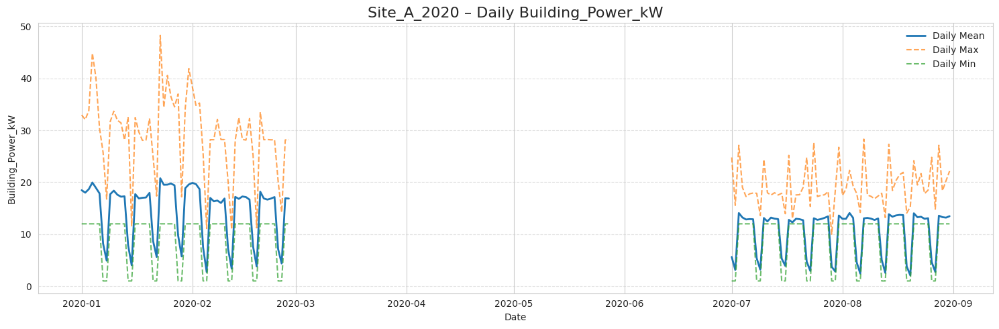

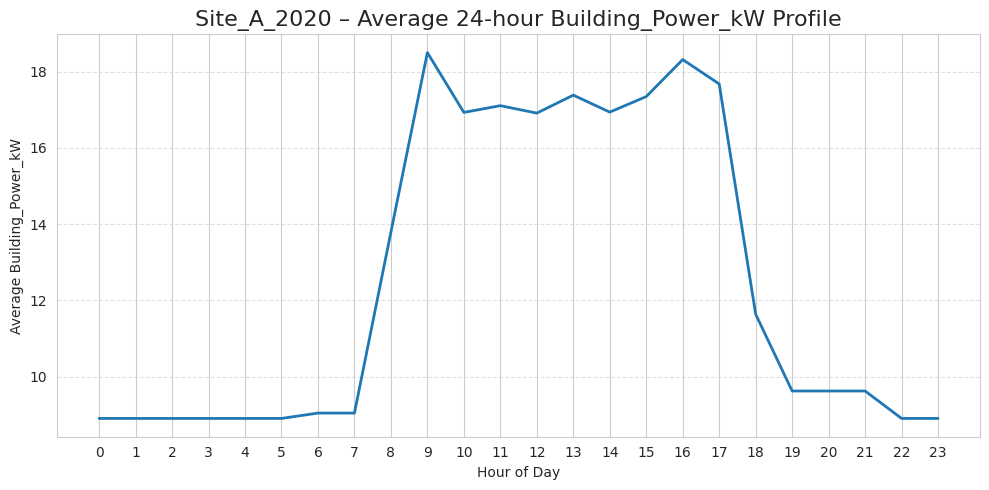

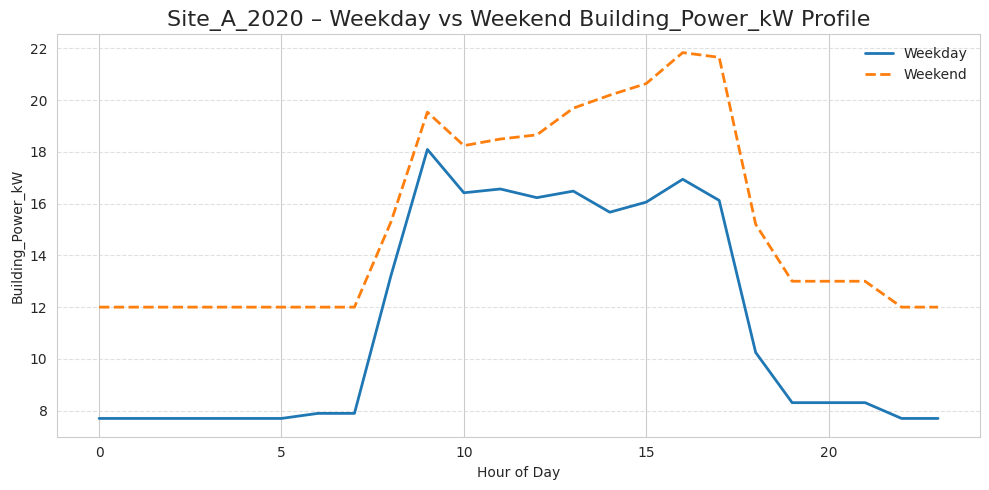

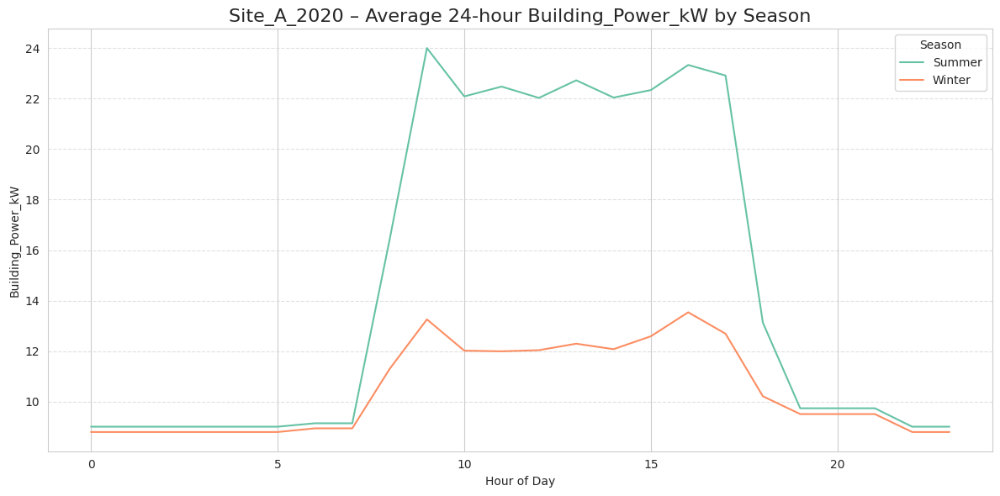


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

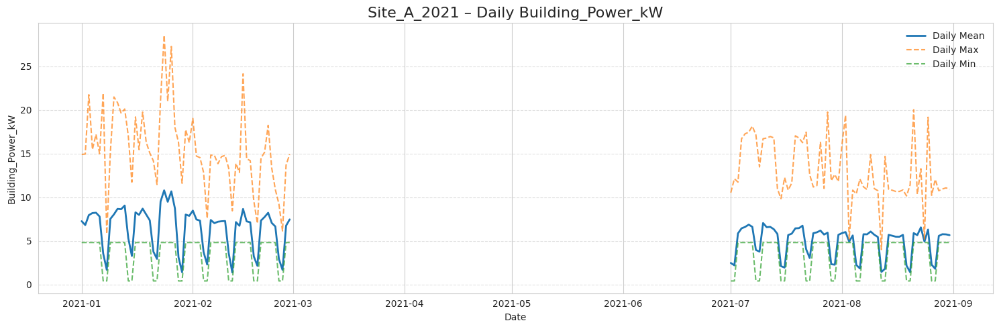

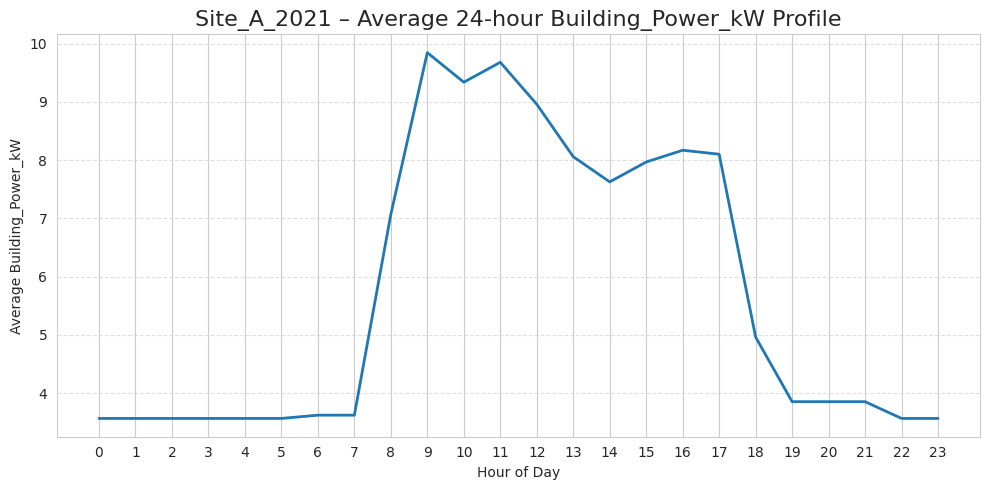

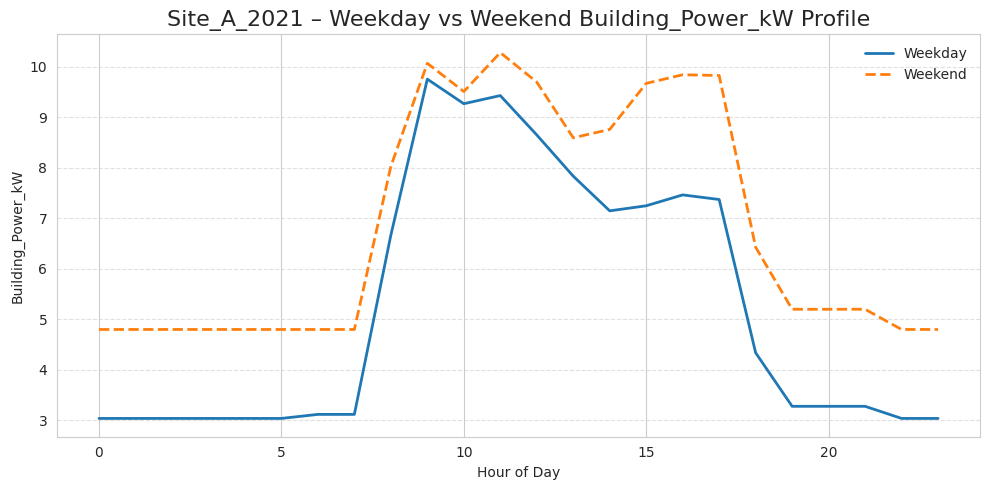

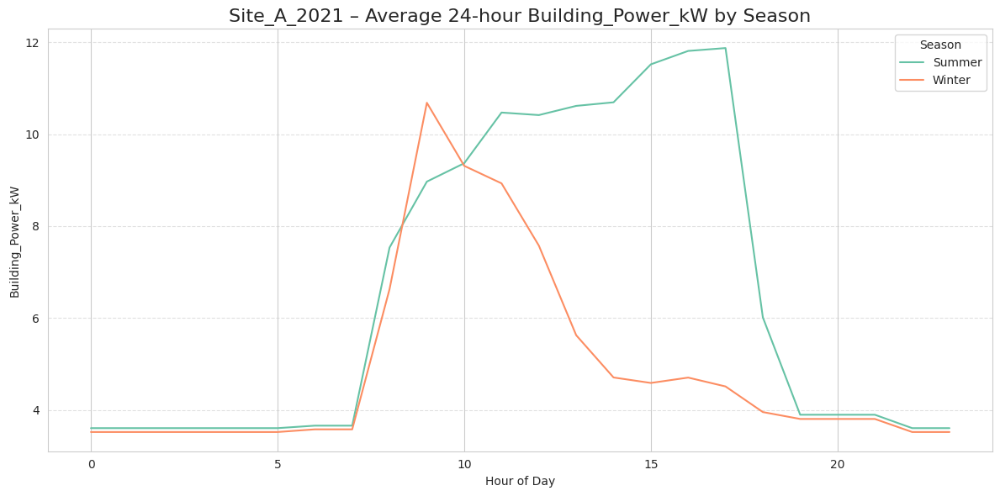


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

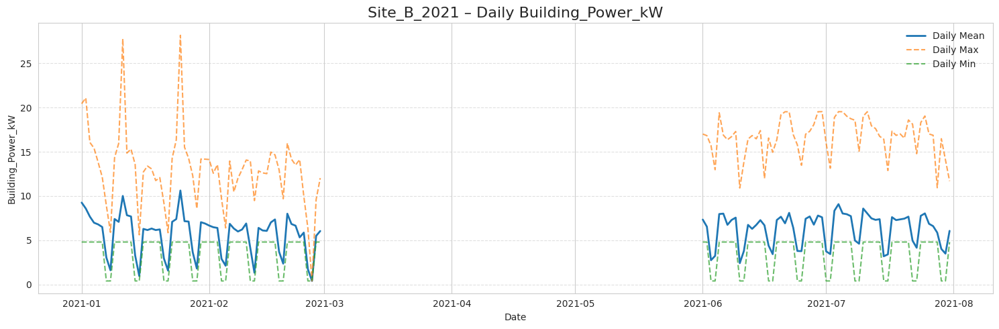

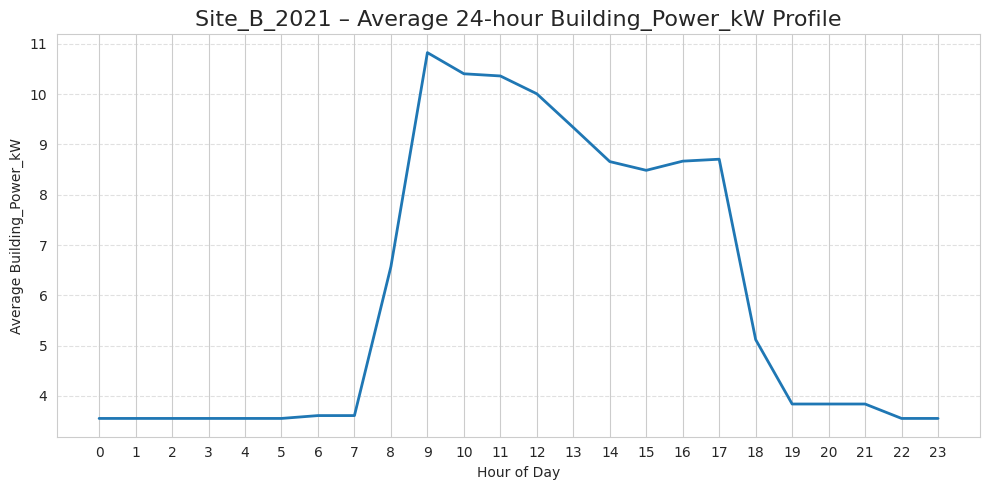

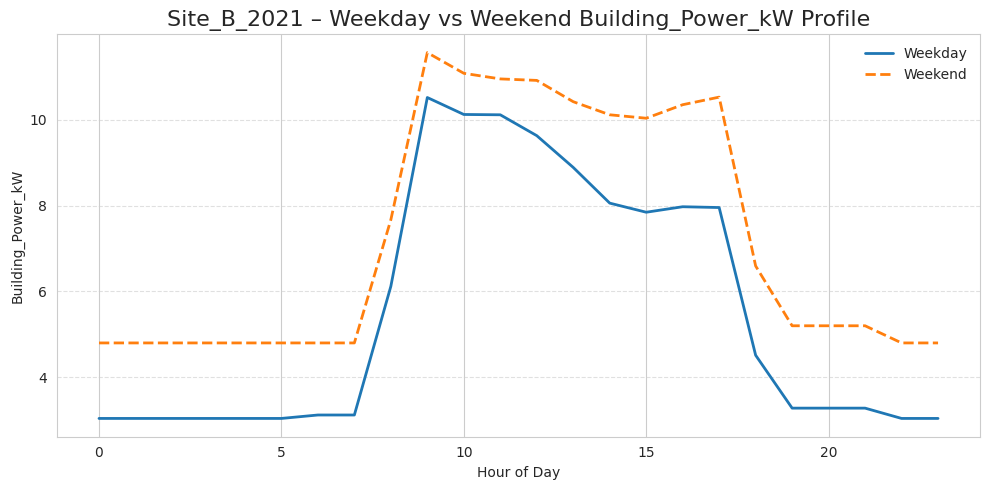

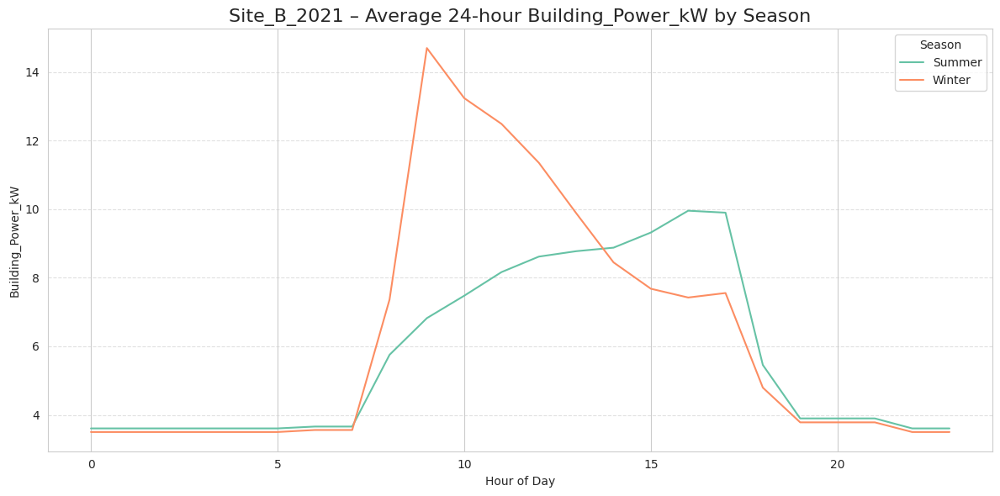


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

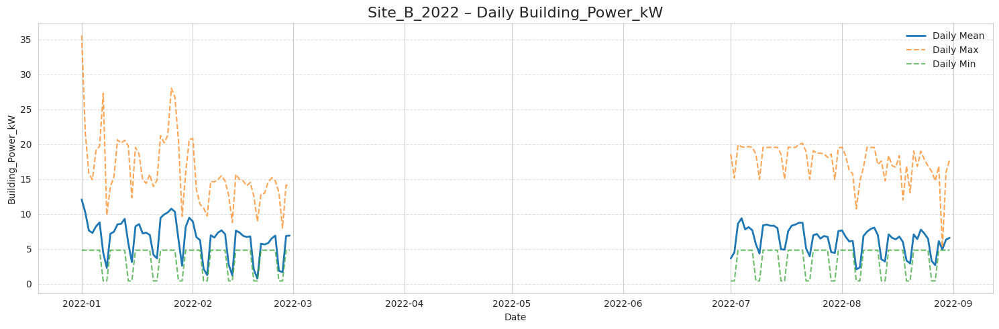

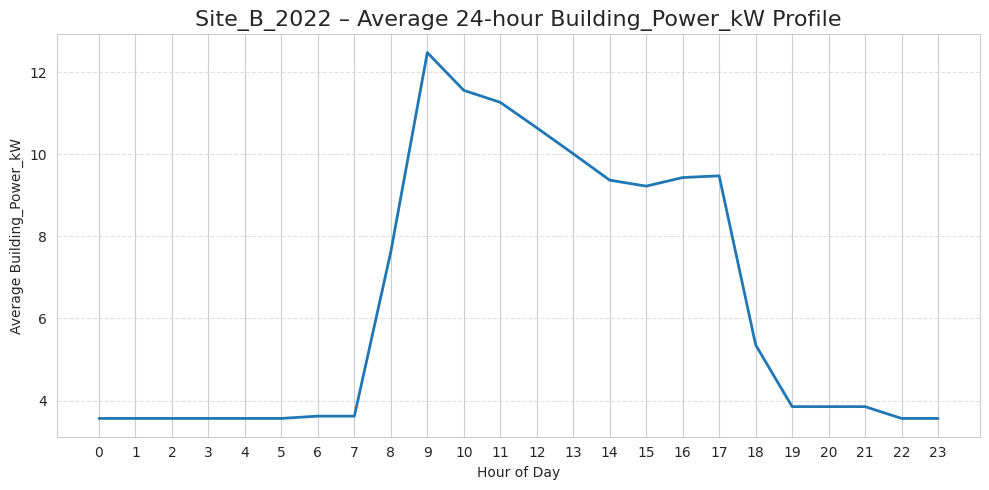

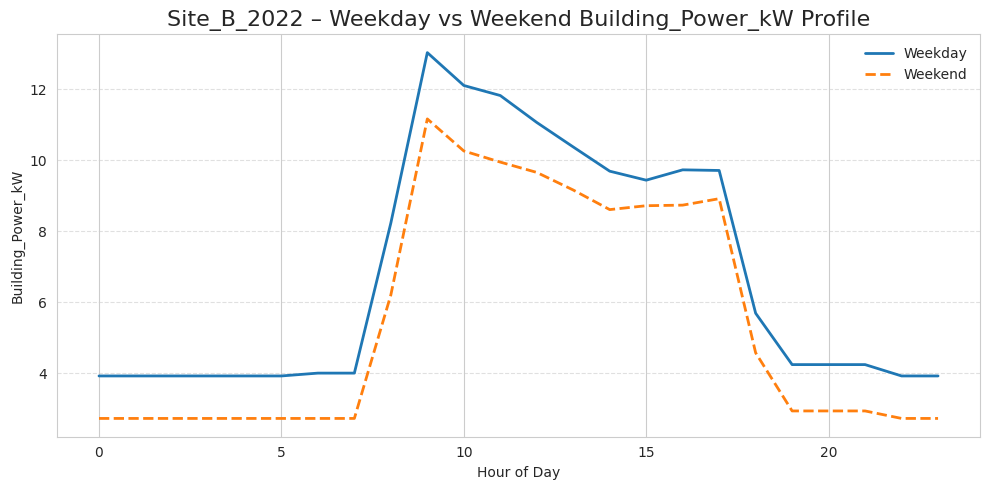

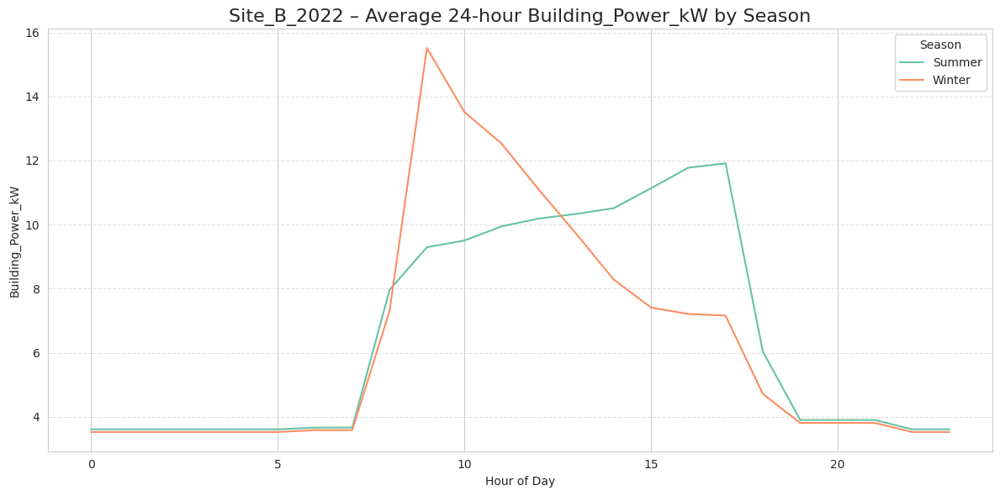


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

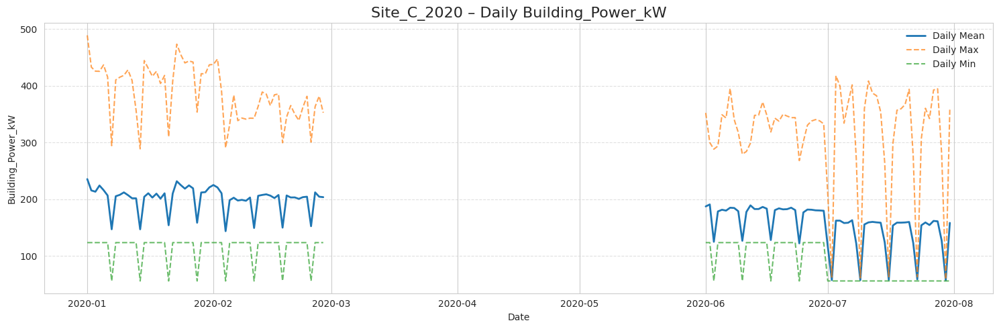

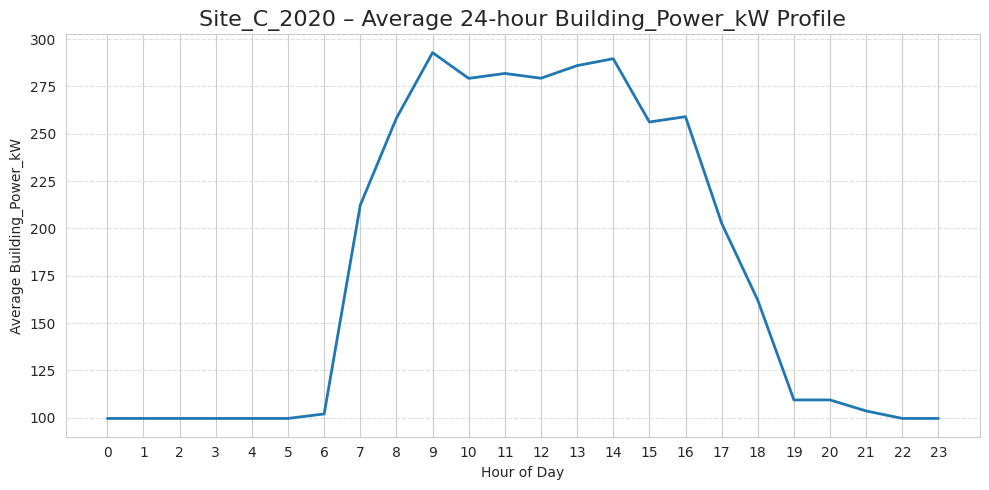

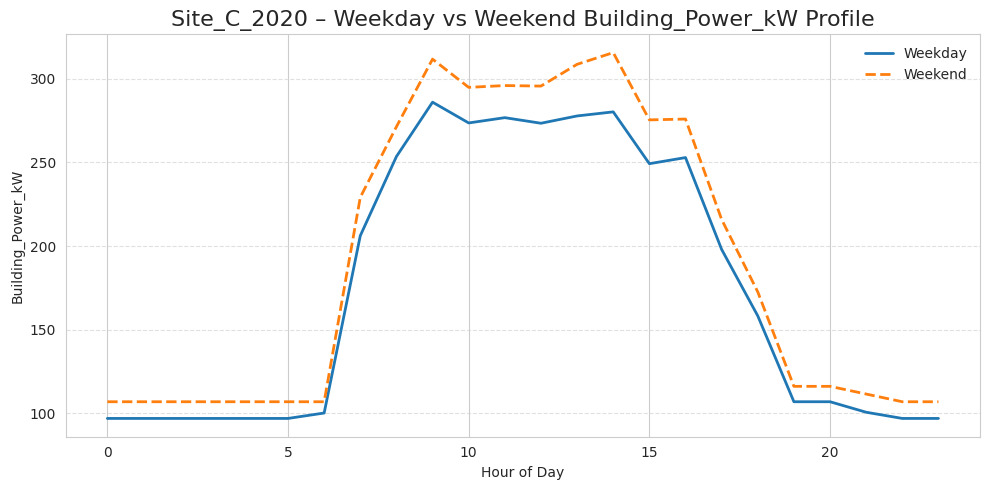

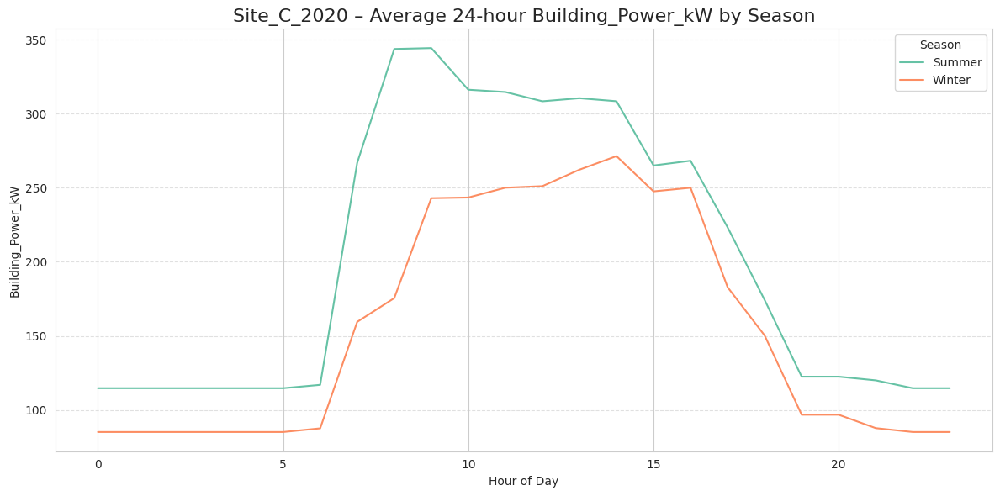


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

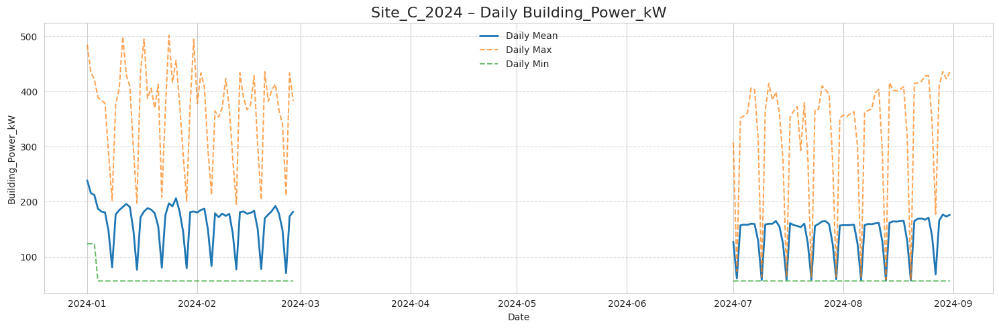

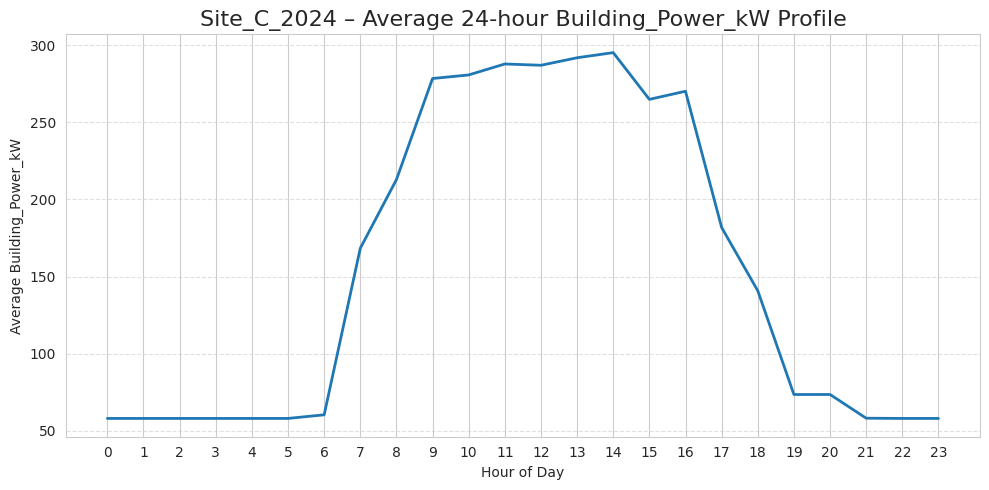

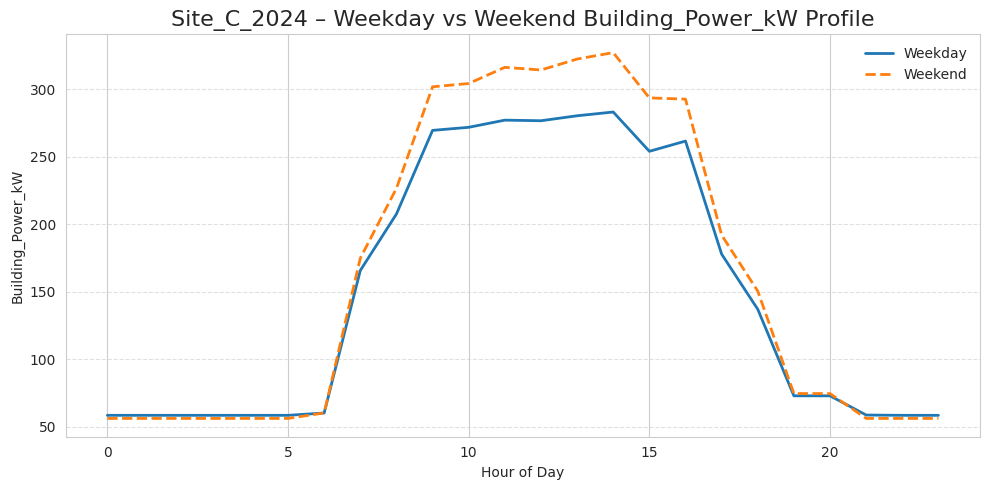

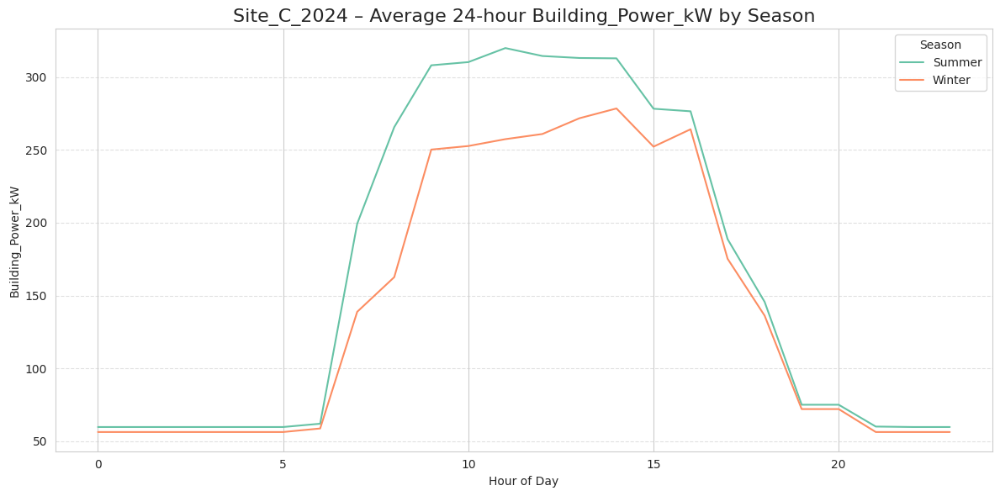


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

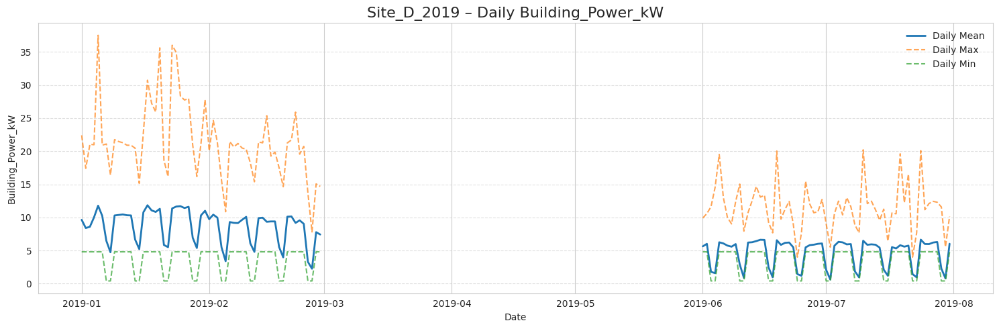

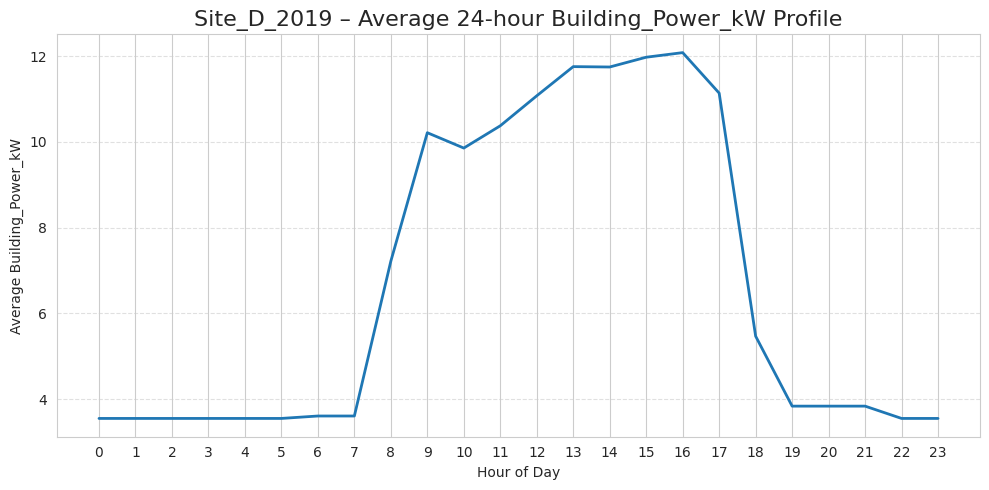

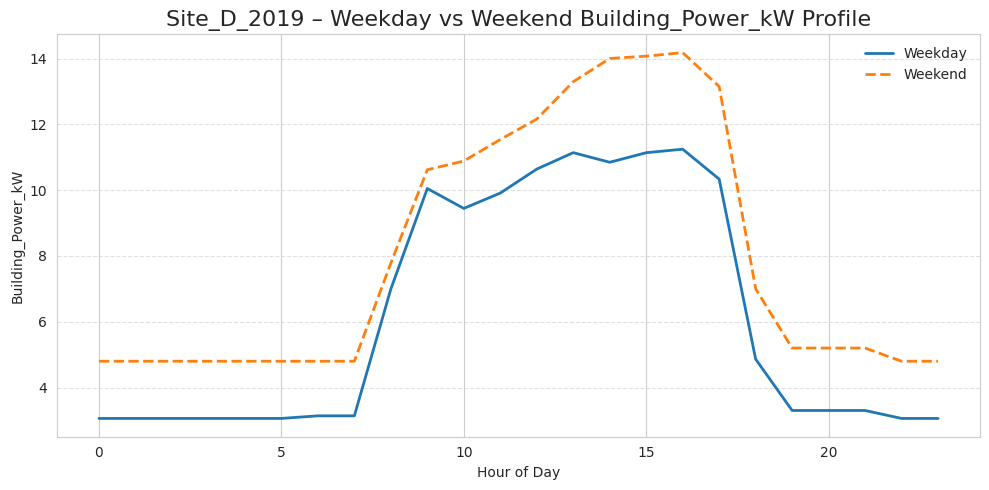

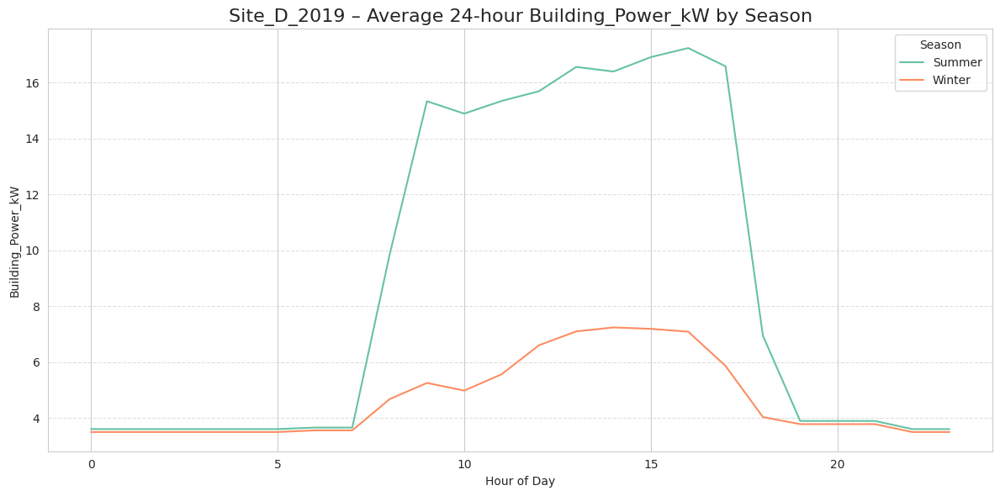


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

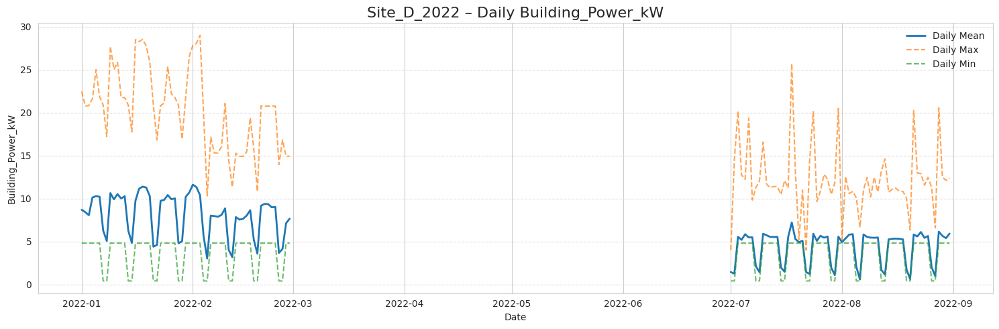

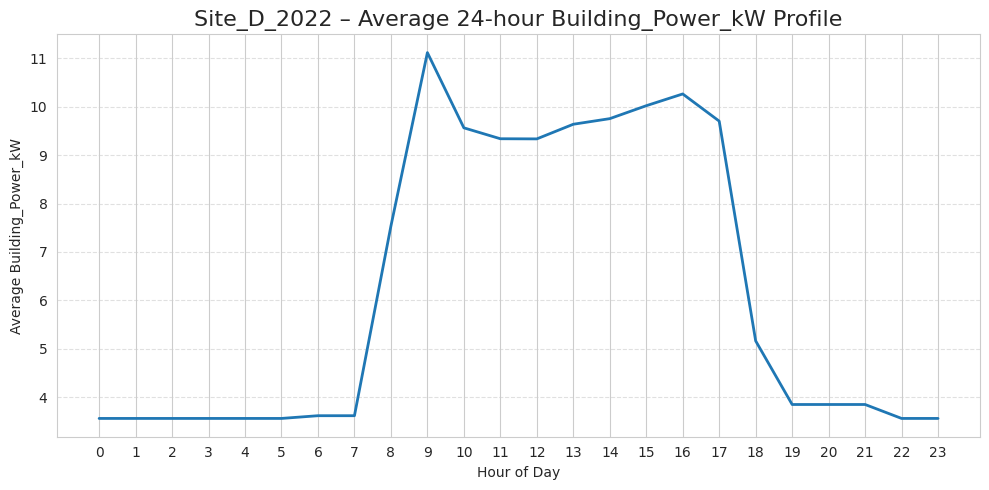

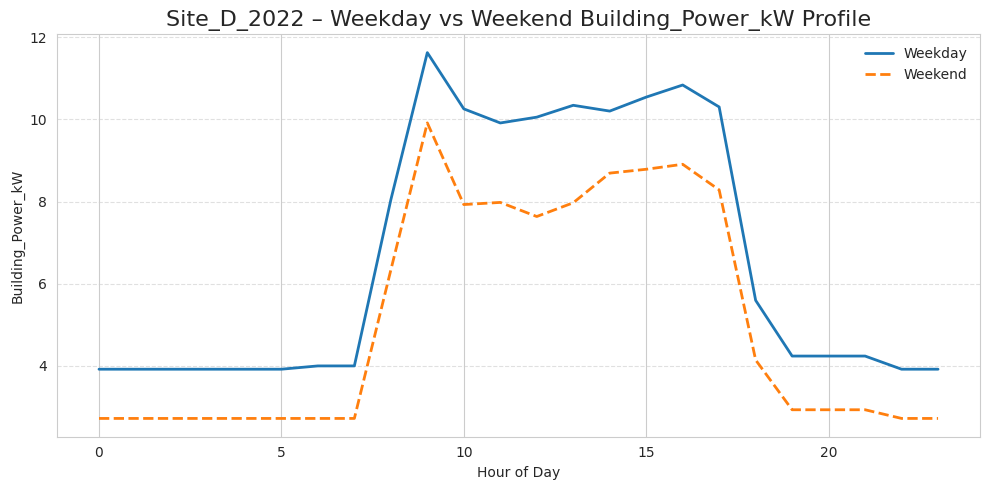

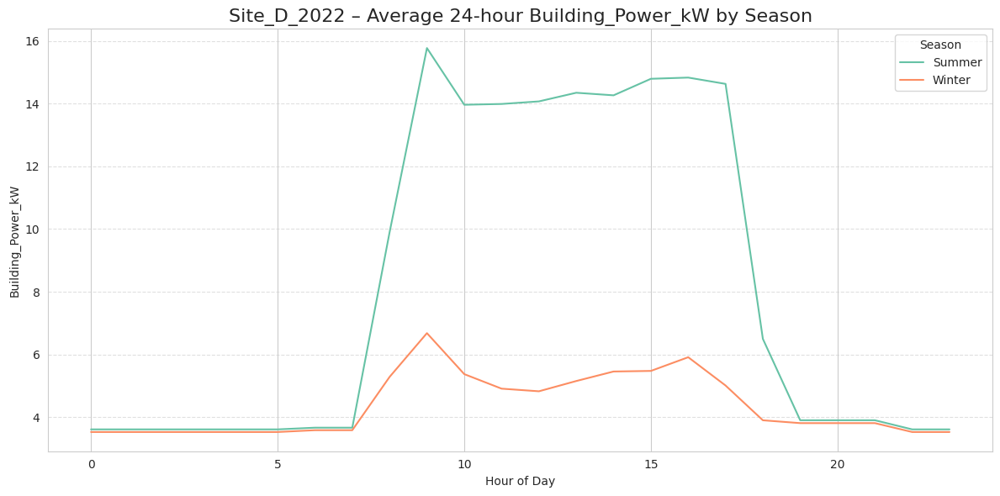


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

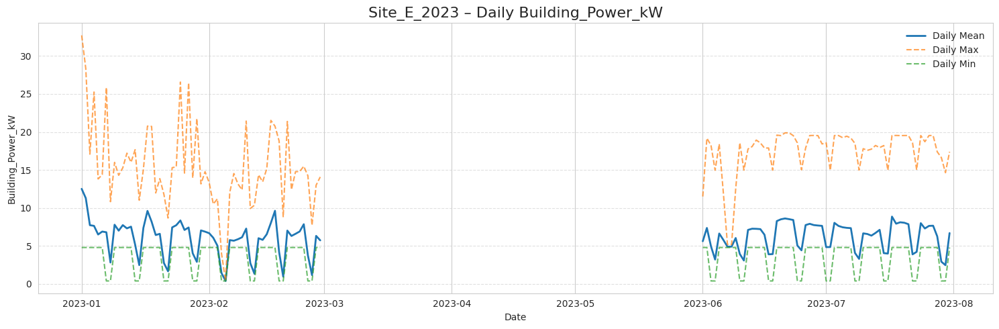

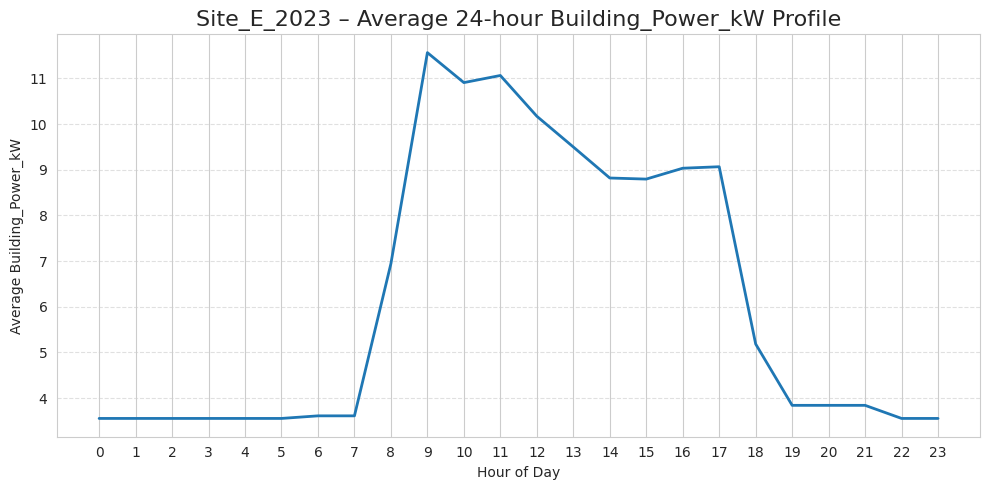

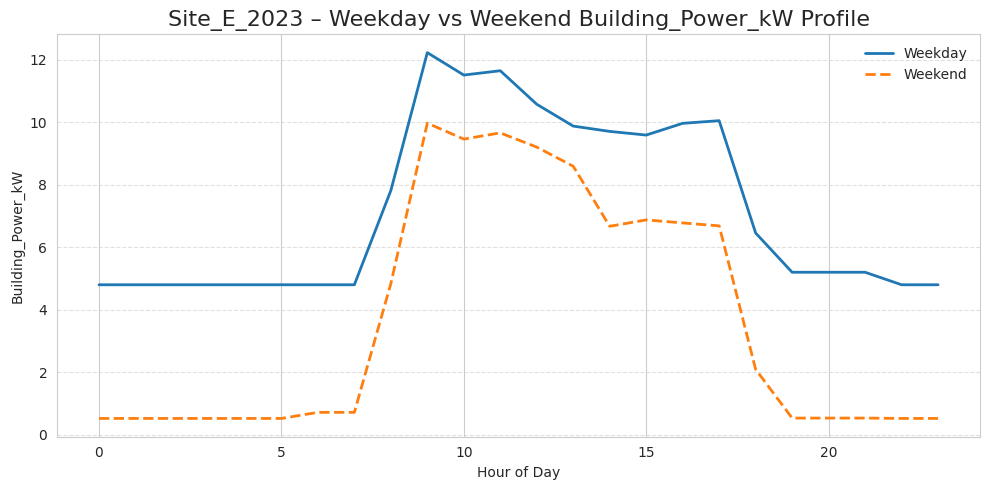

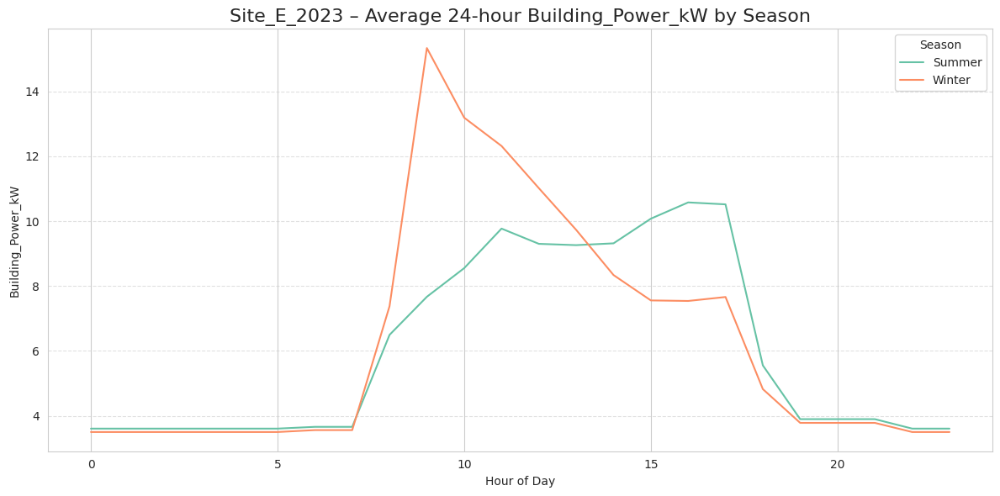


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

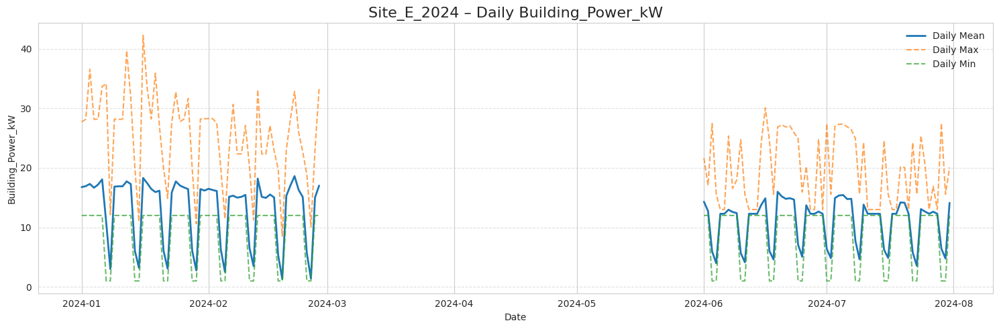

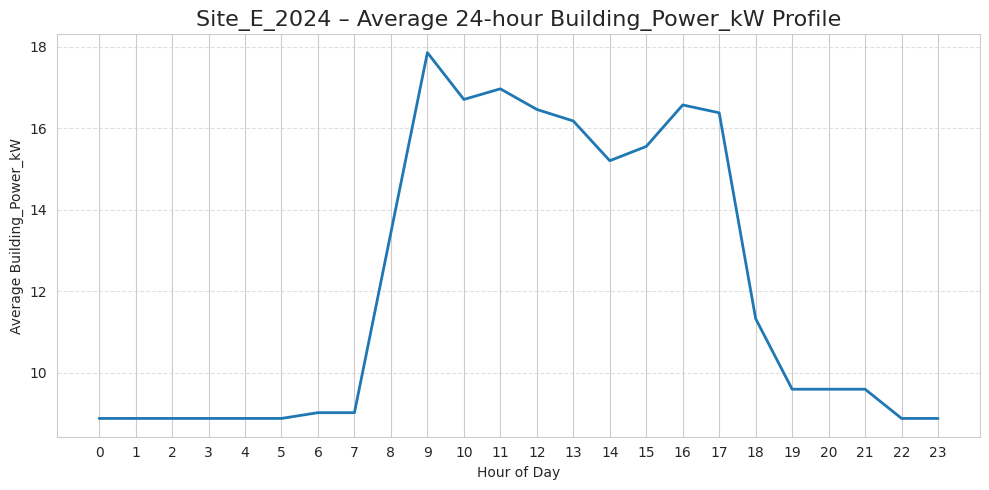

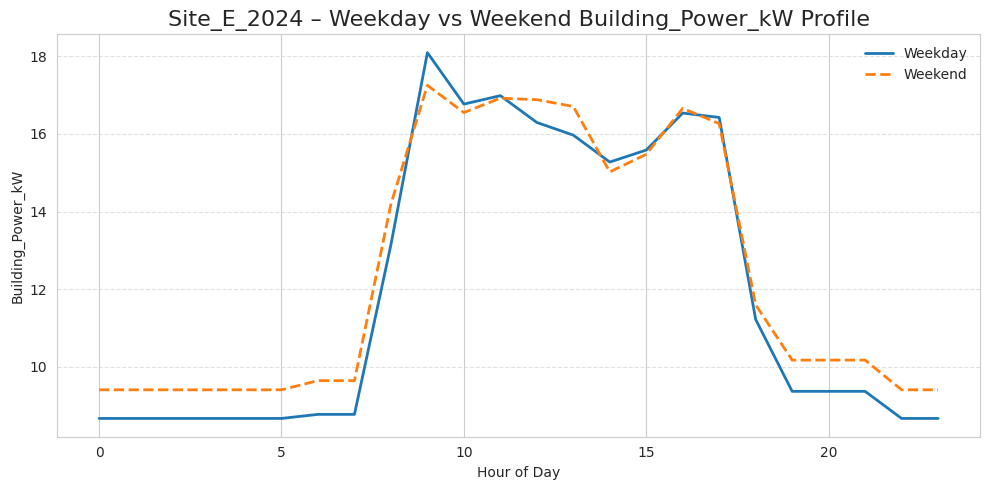

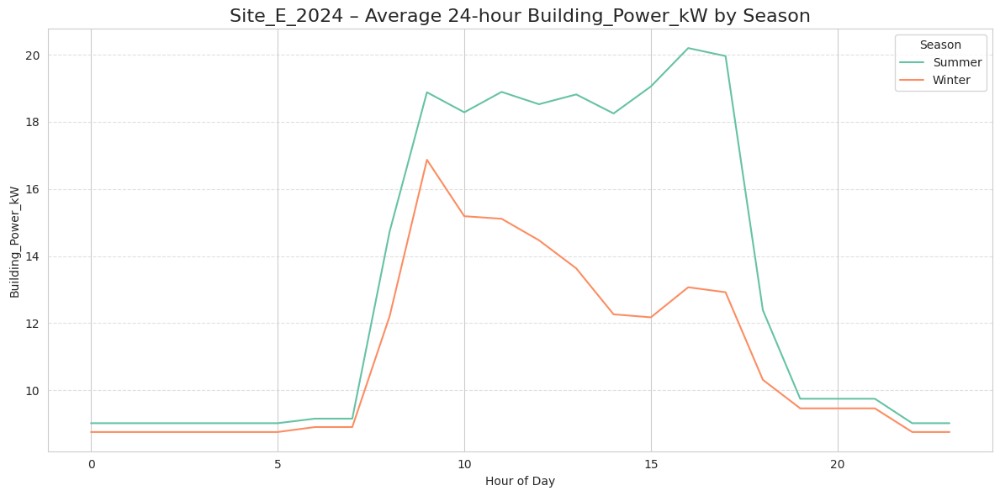


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

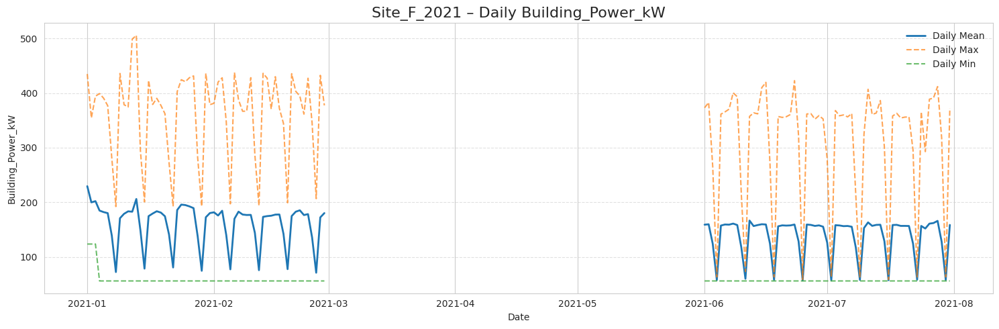

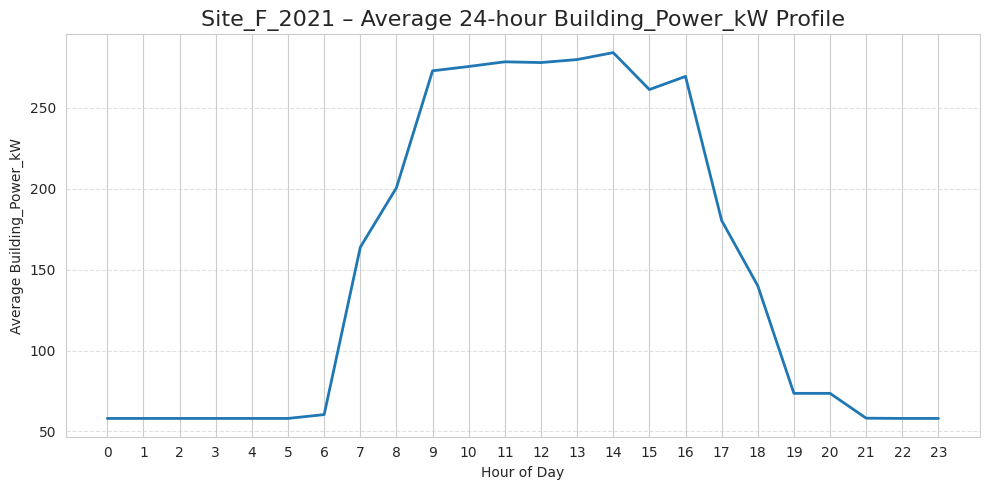

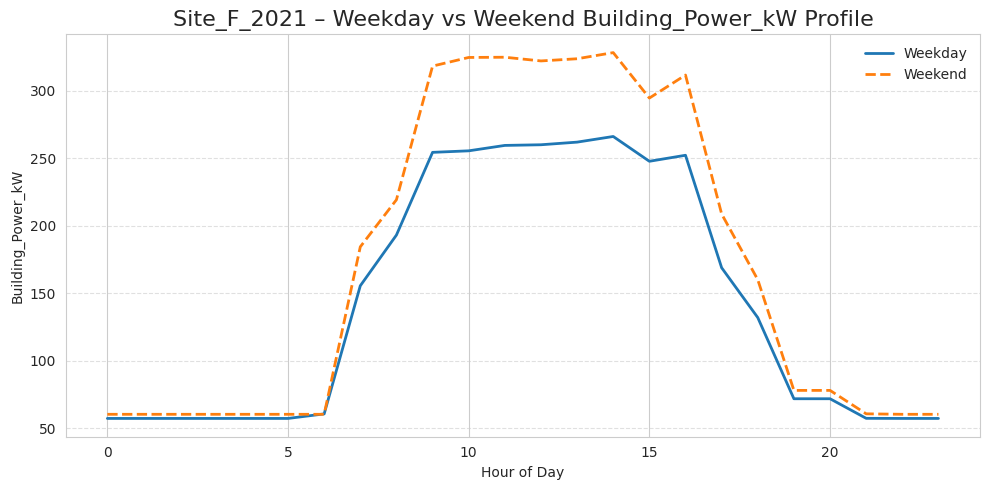

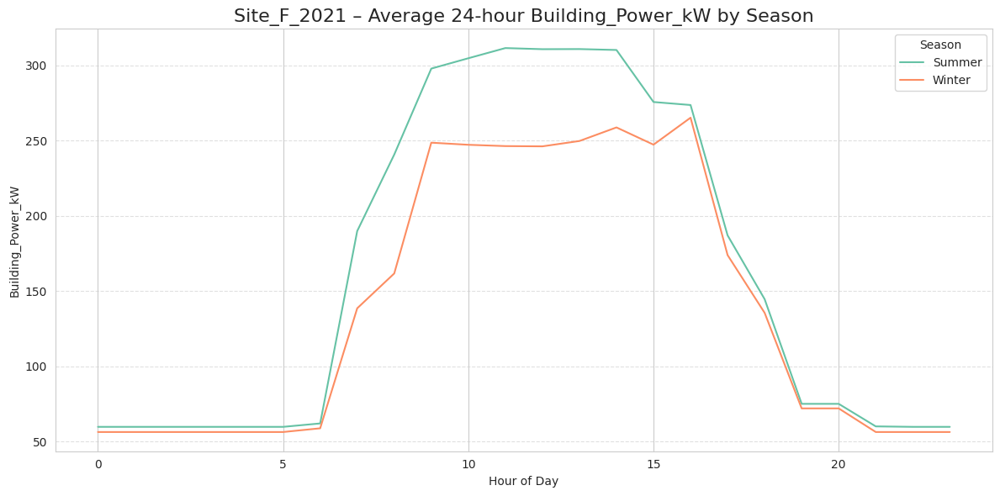


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

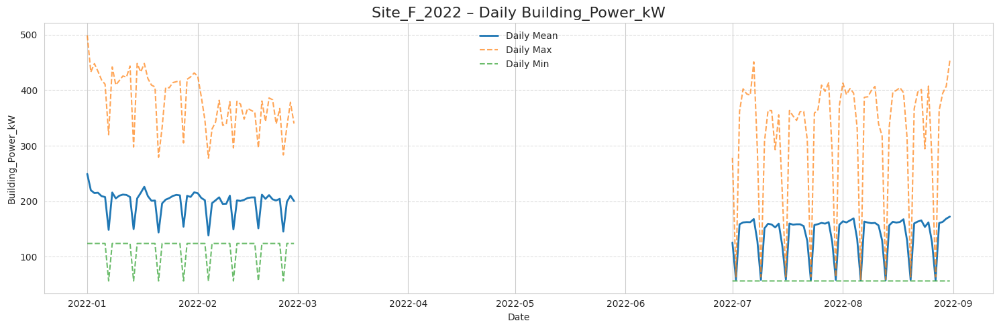

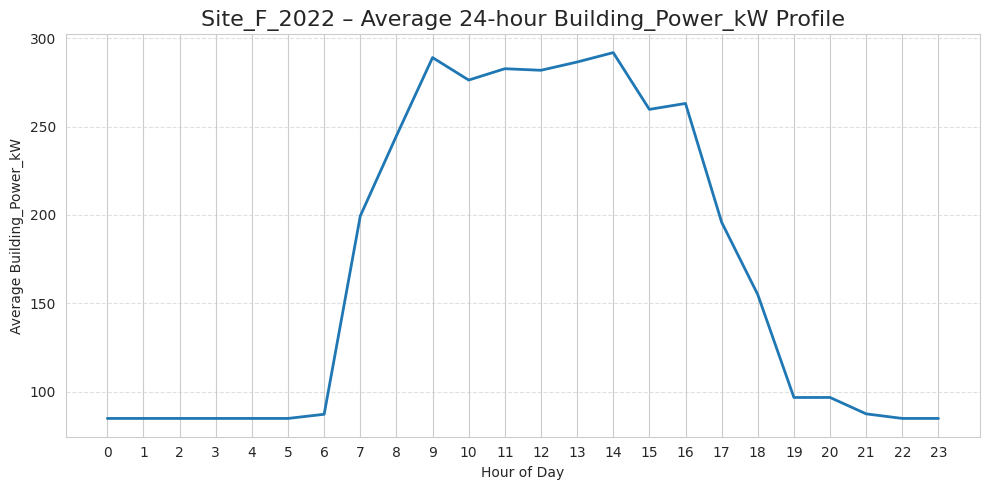

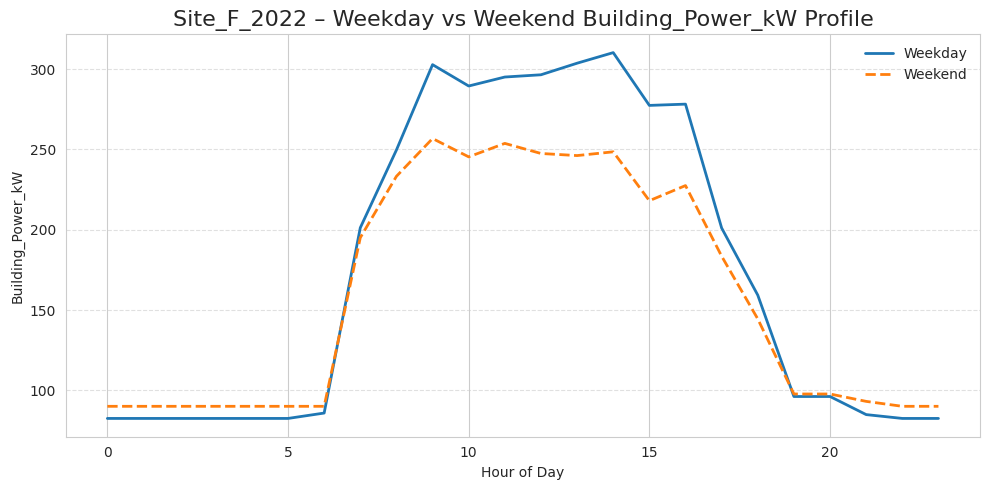

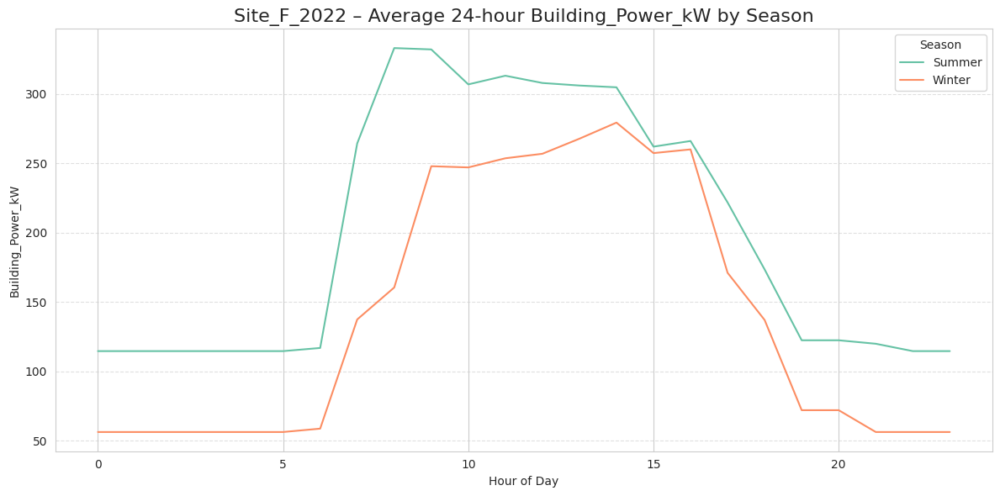


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

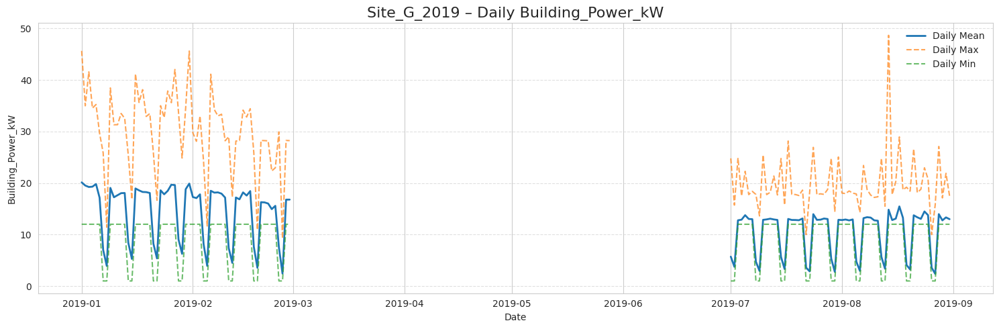

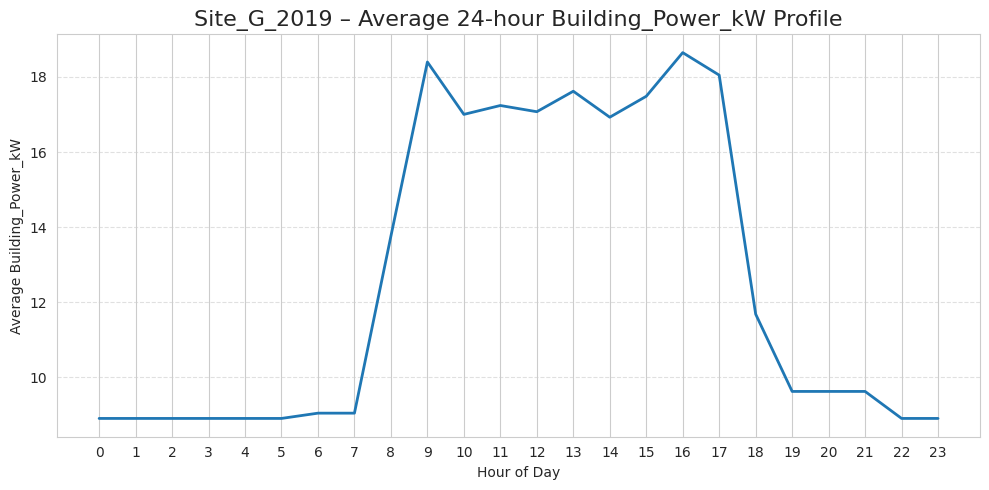

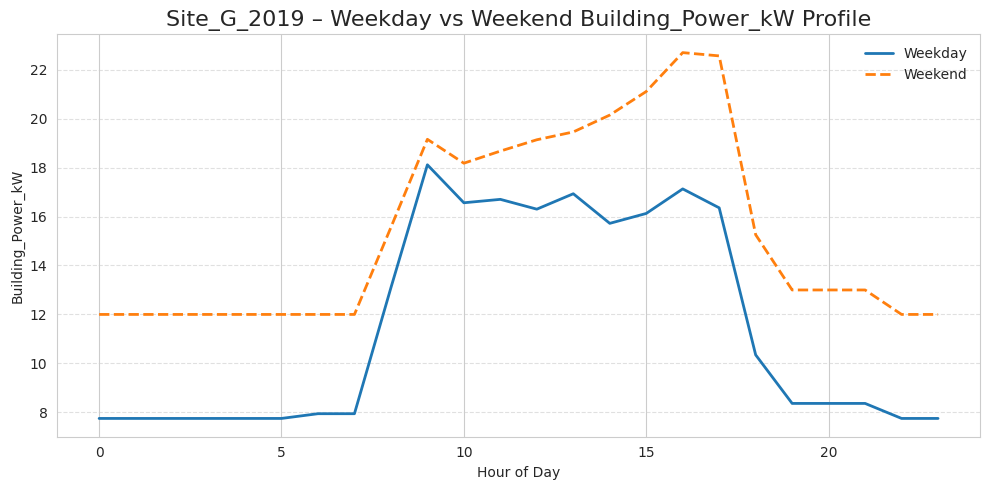

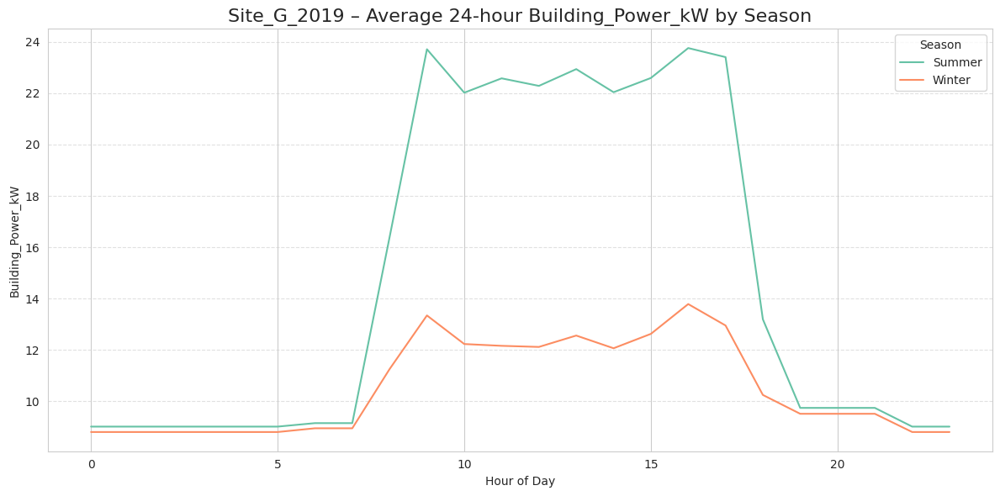


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

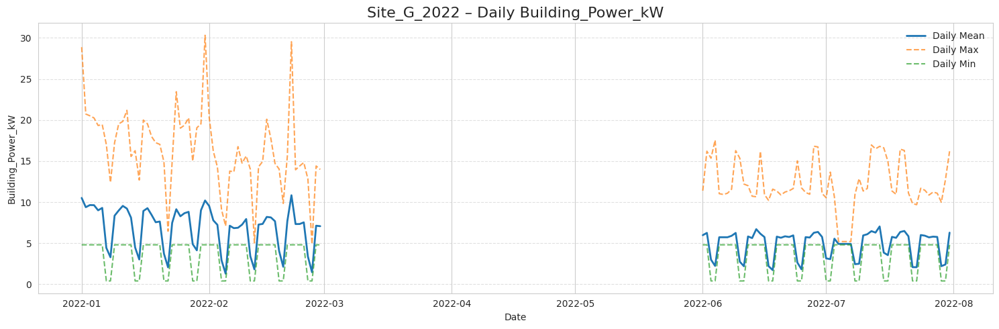

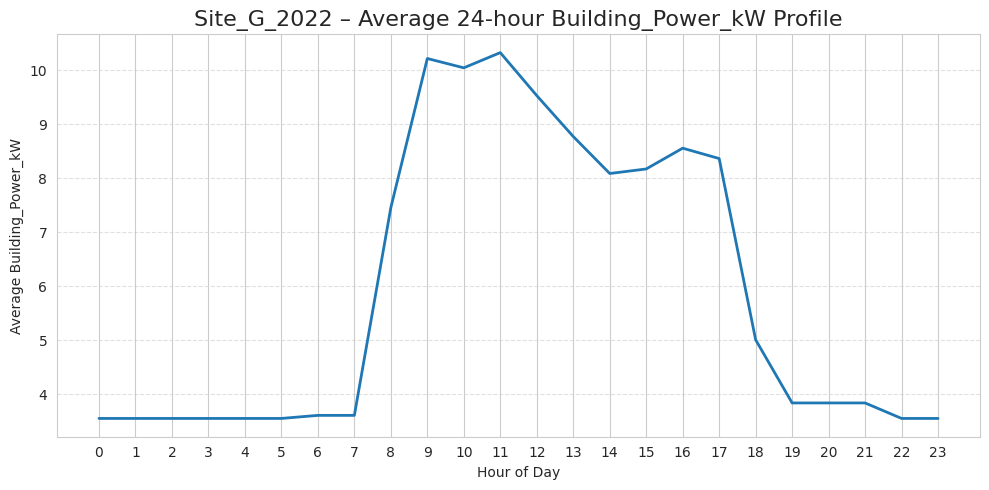

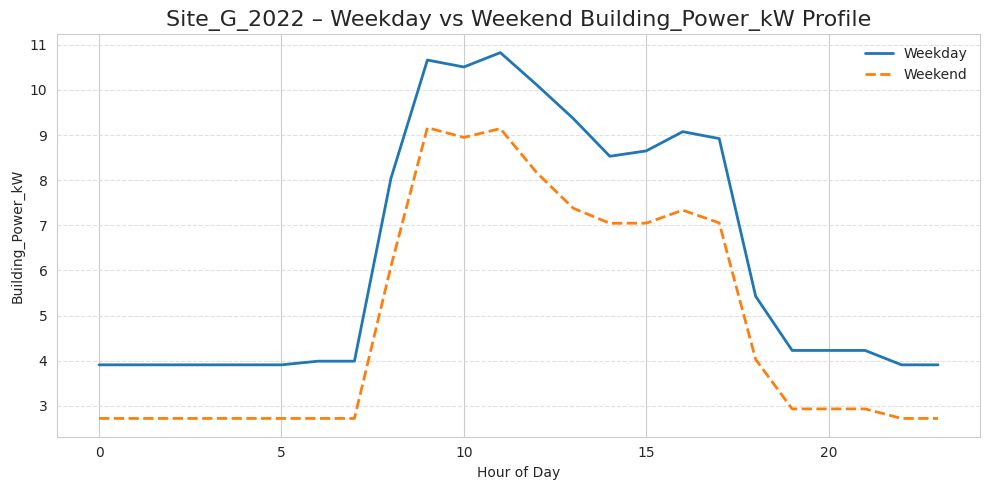

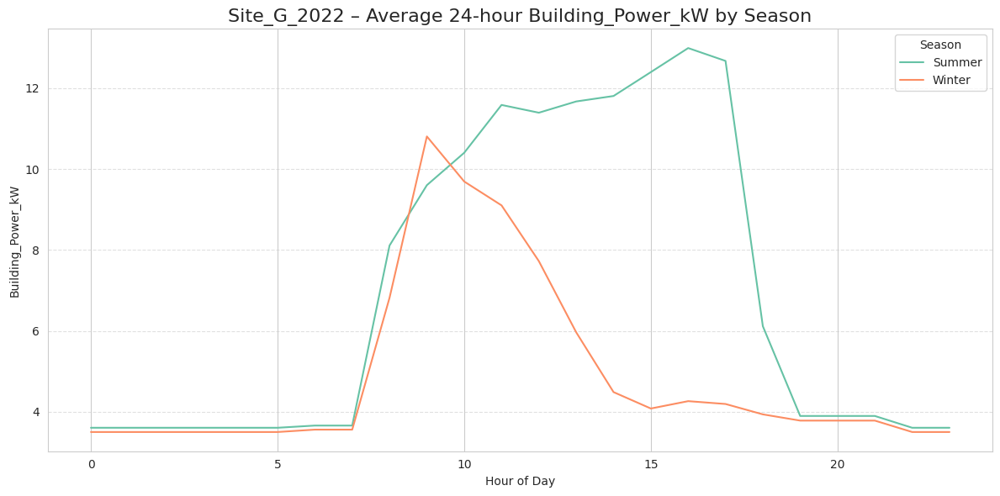


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

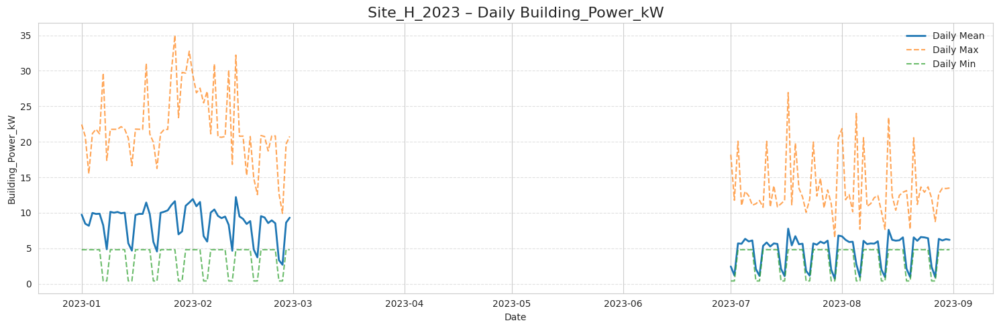

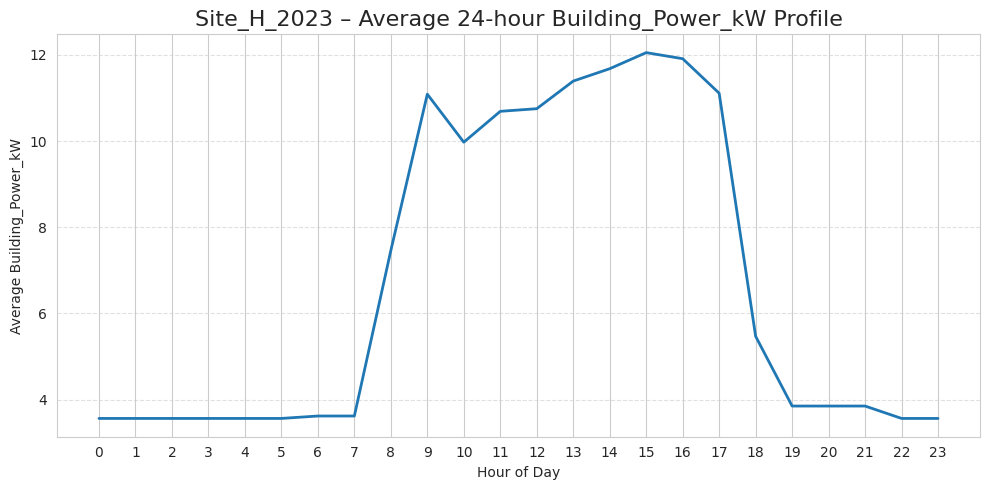

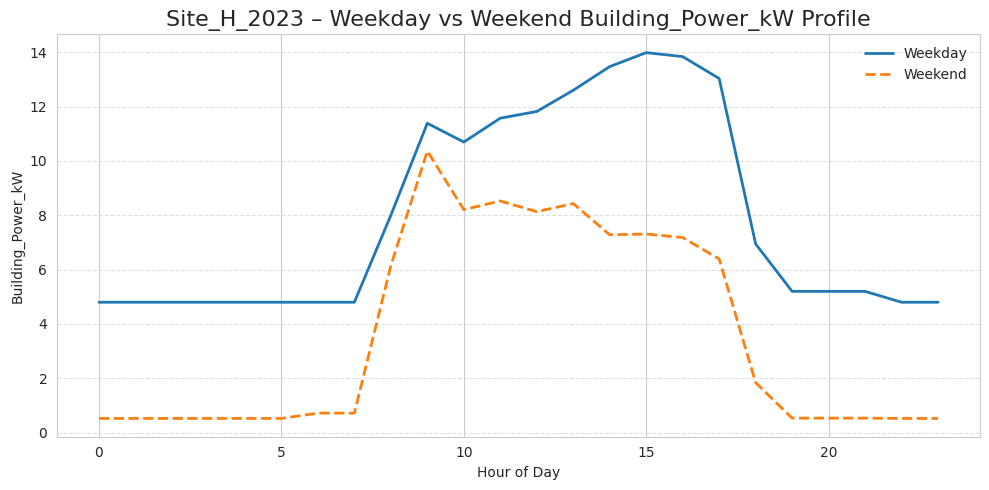

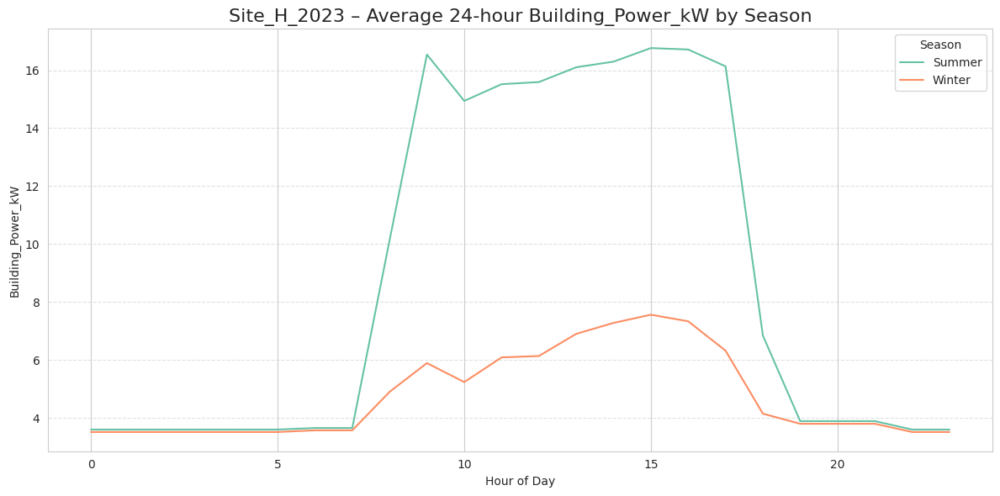


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

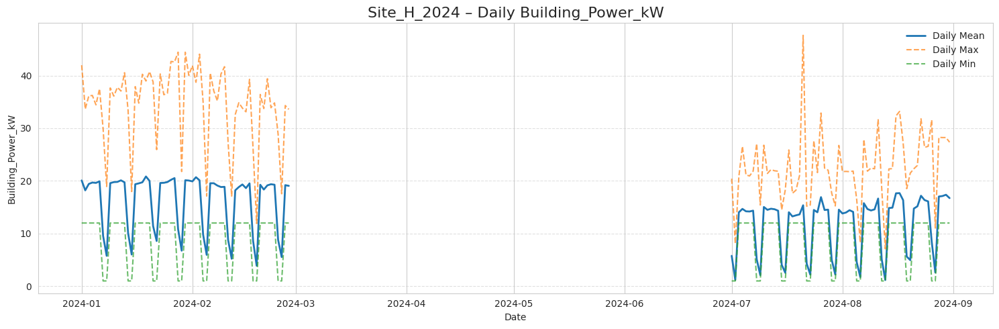

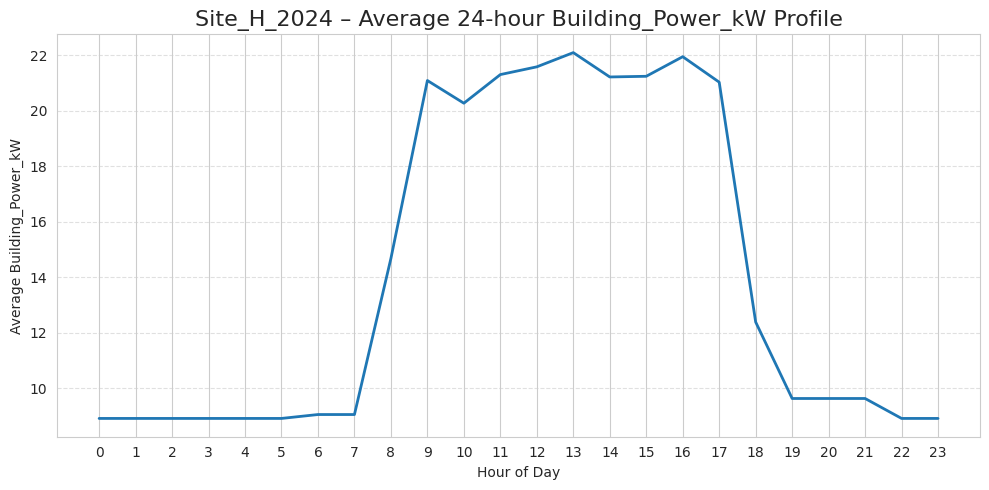

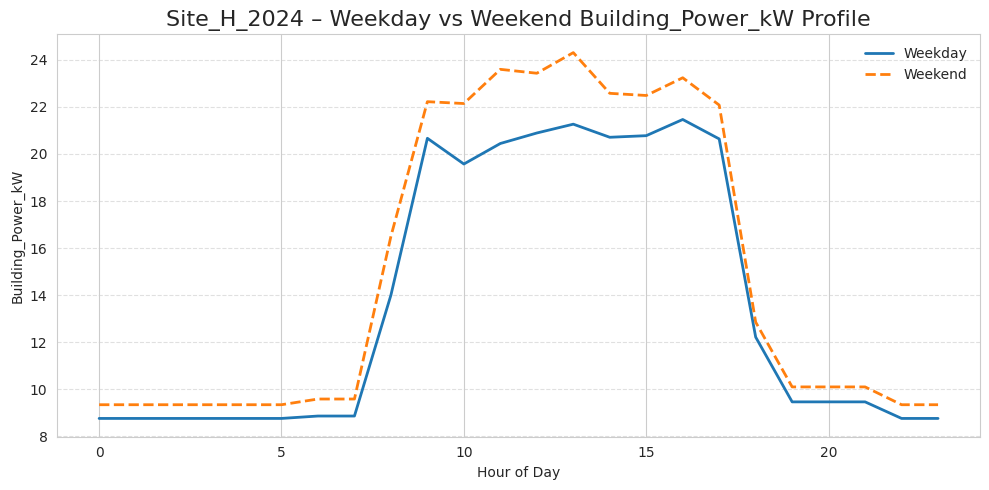

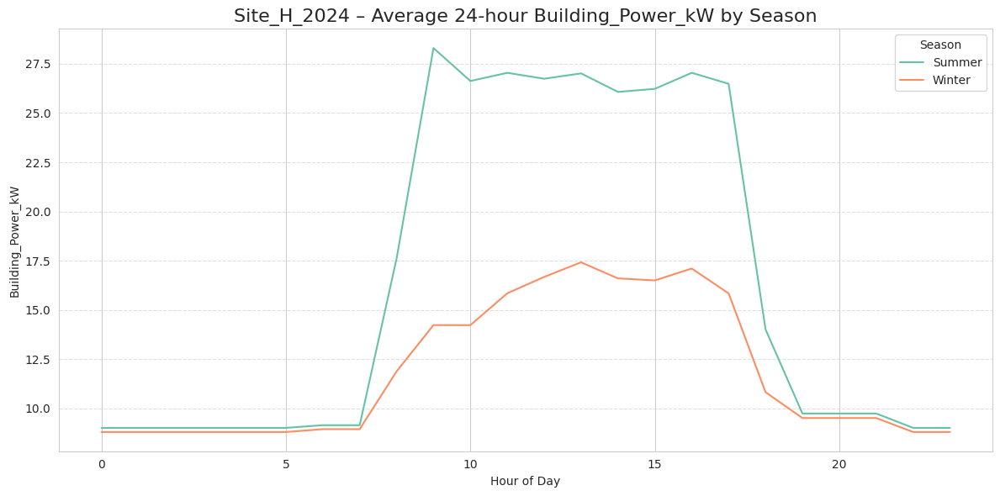


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

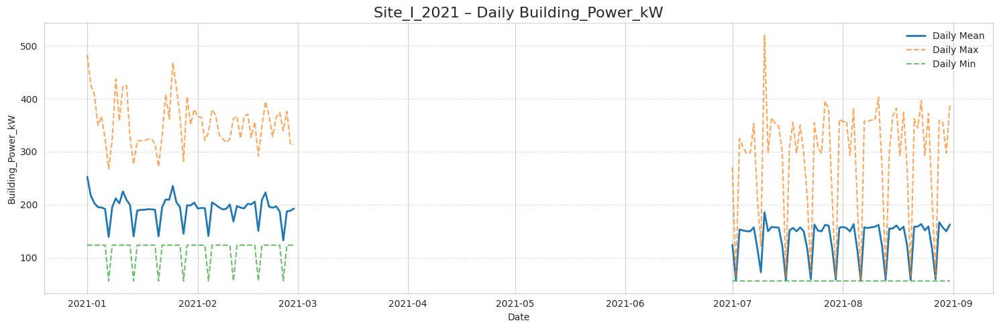

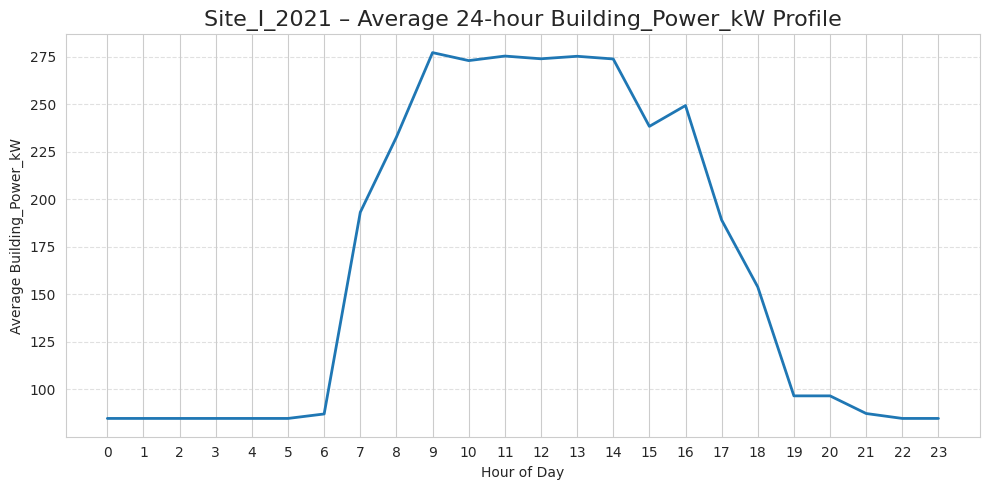

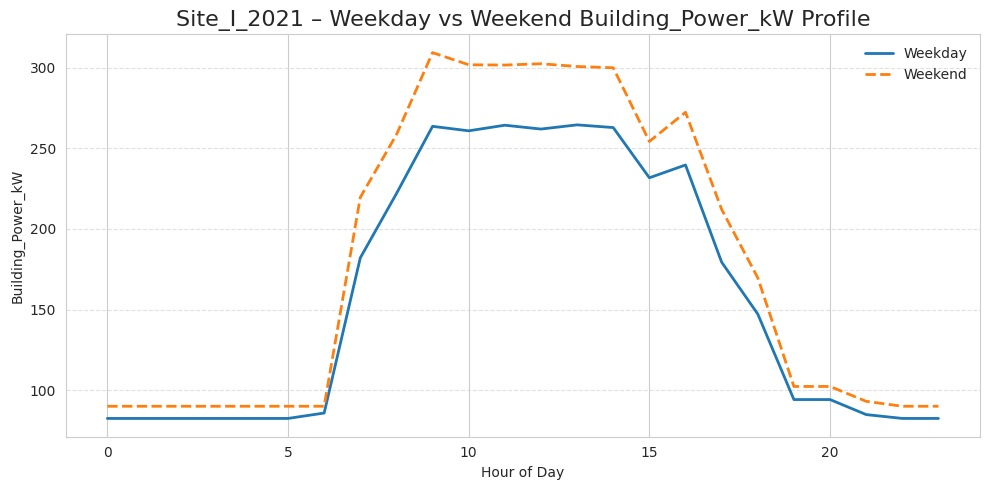

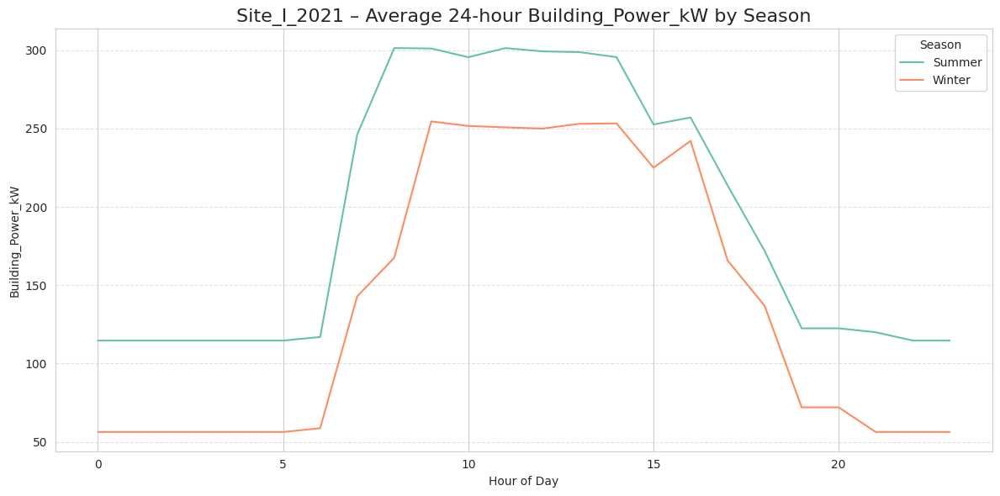


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

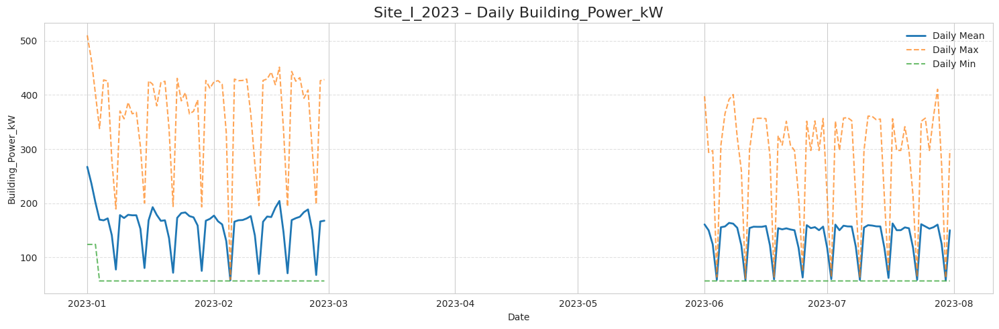

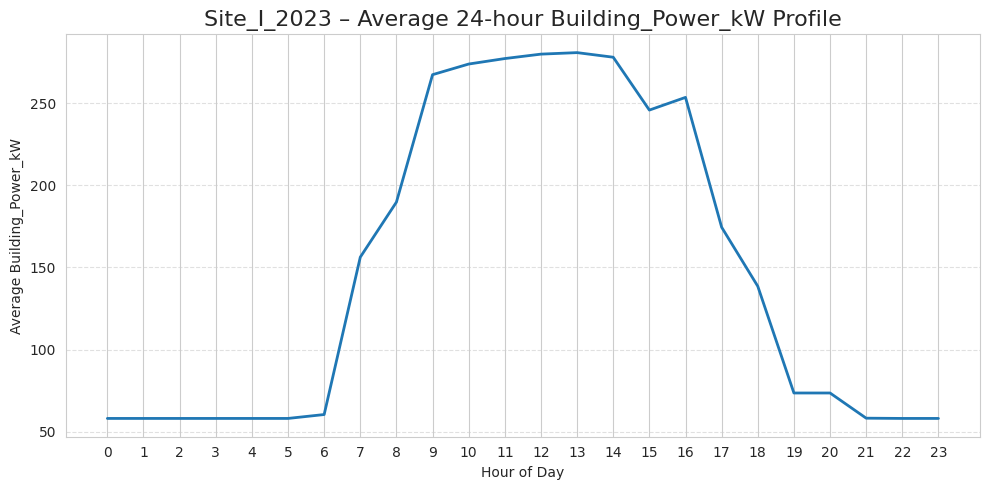

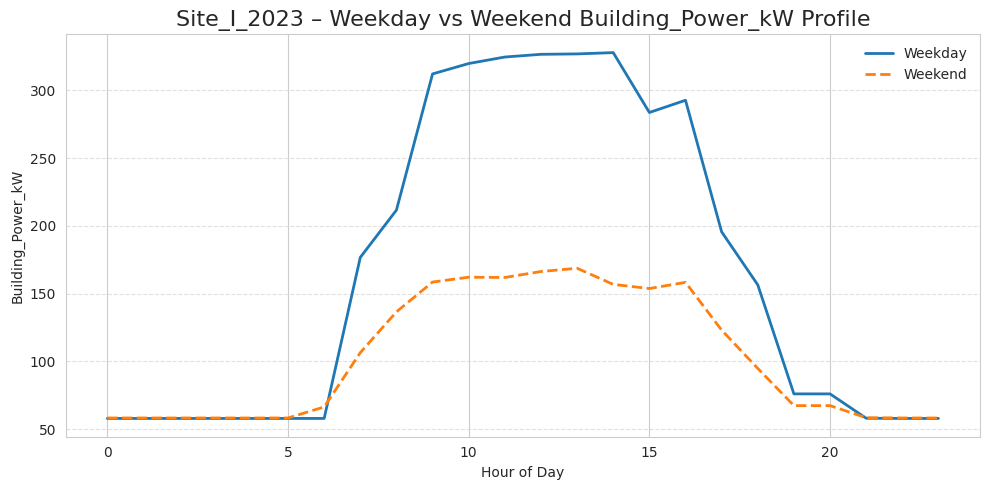

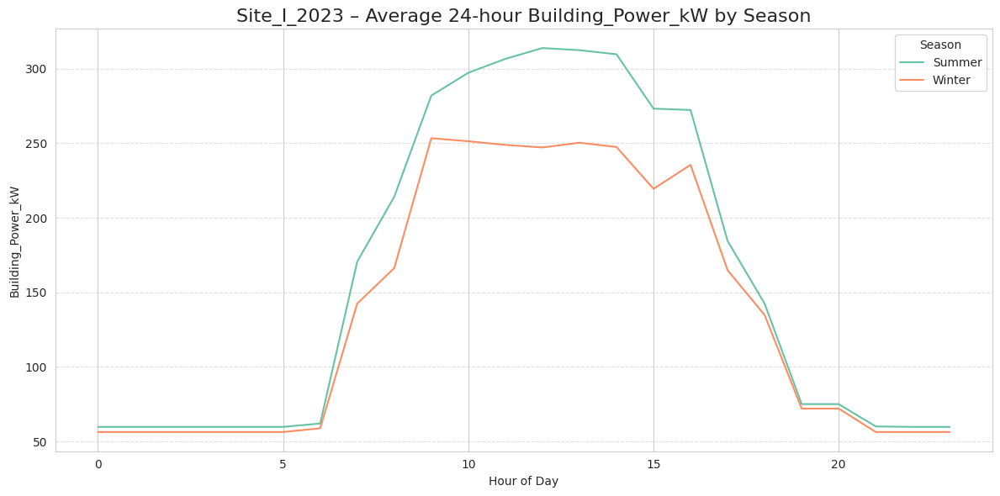


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

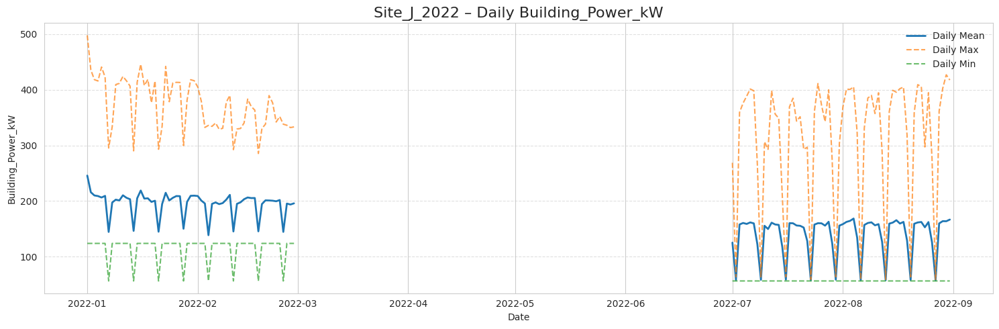

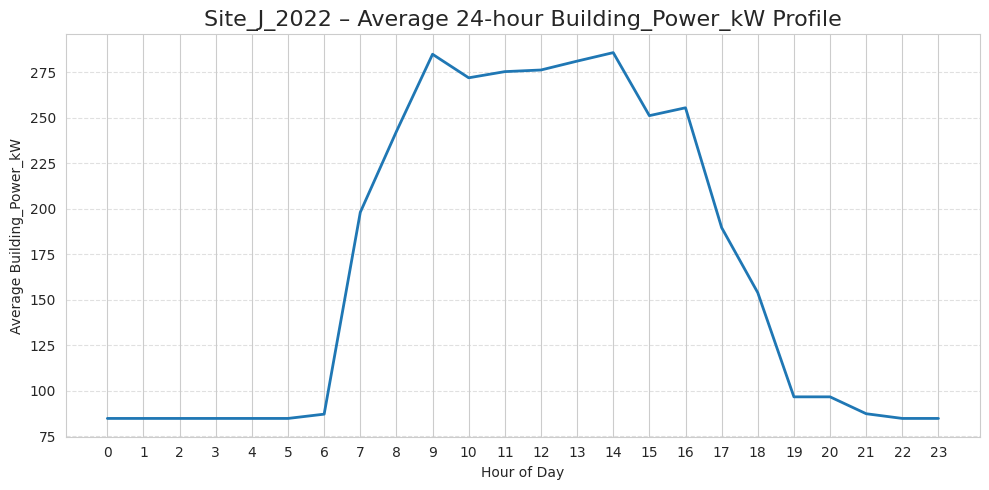

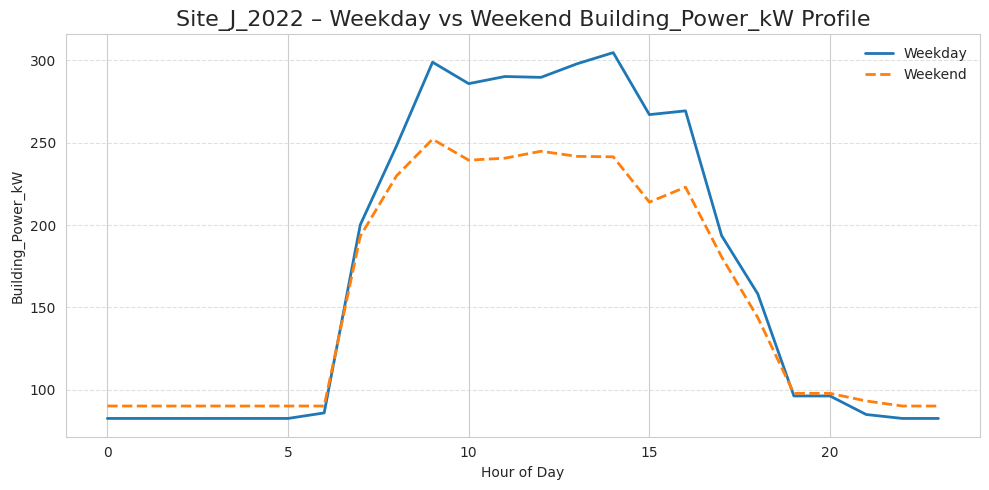

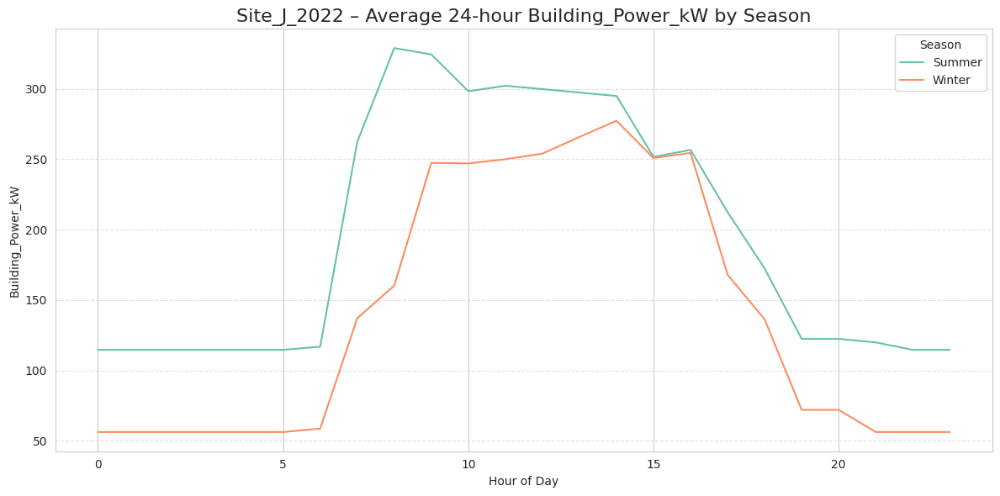


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

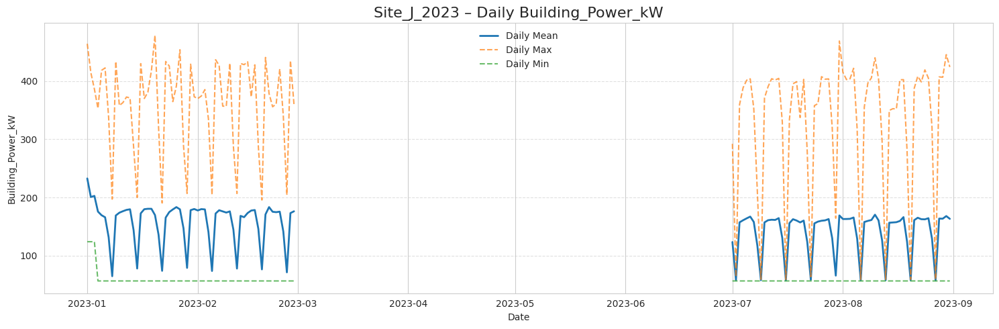

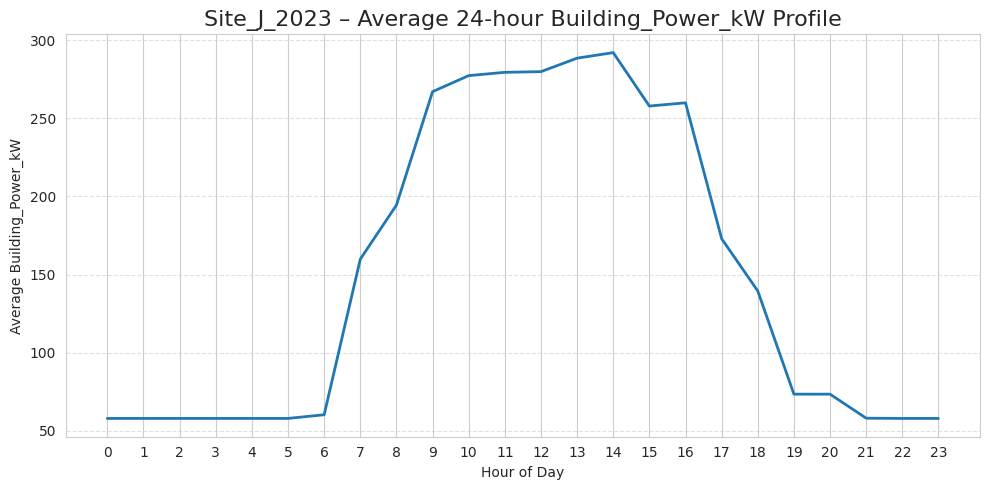

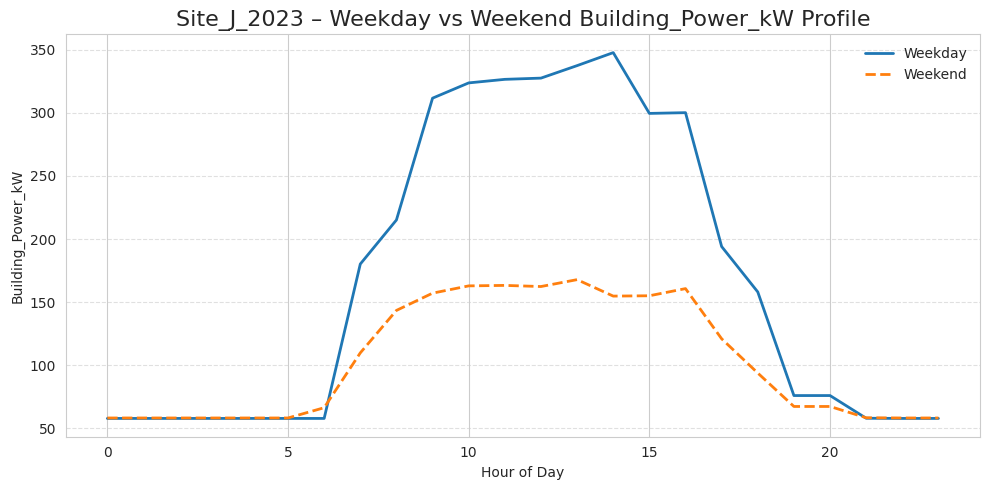

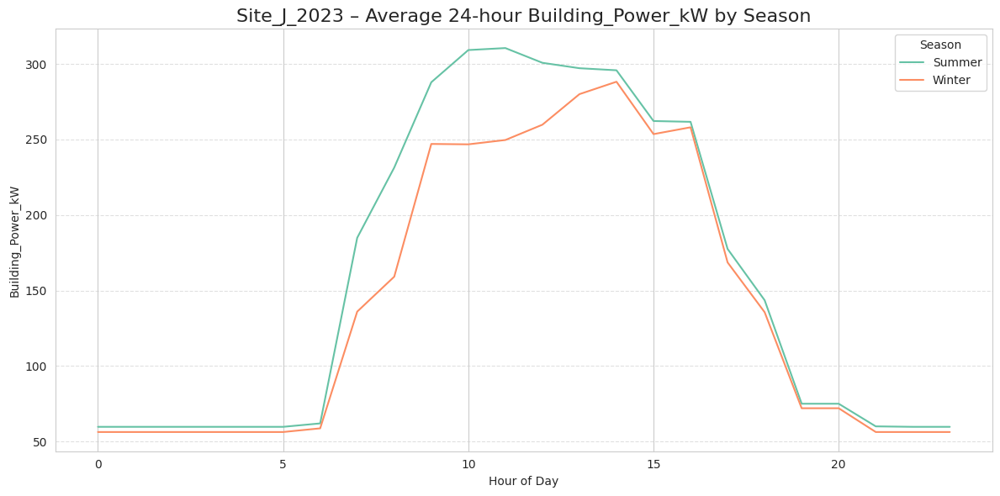


******************************************************************************************


/tmp/ipython-input-1612440507.py:19: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly = df.resample('M').agg({


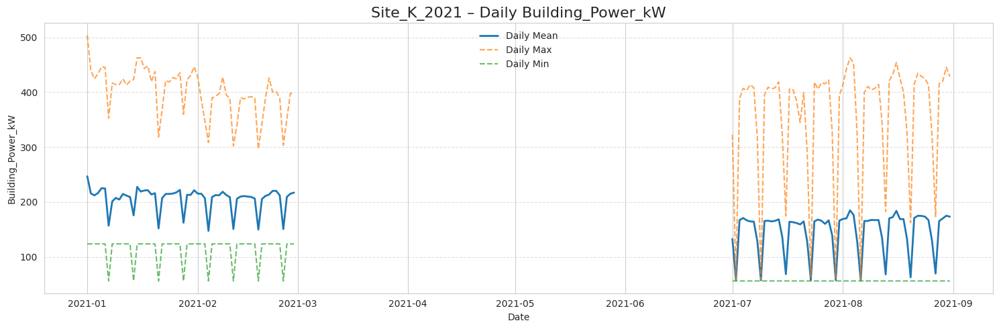

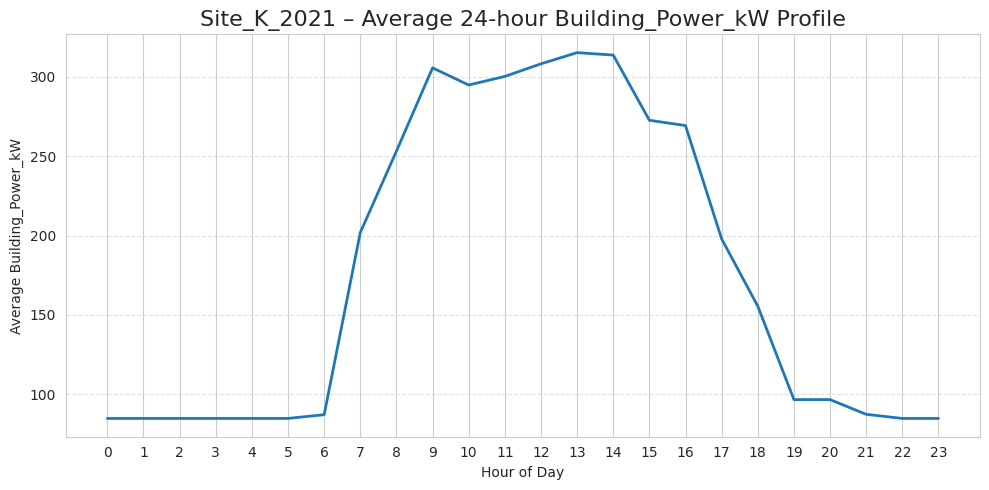

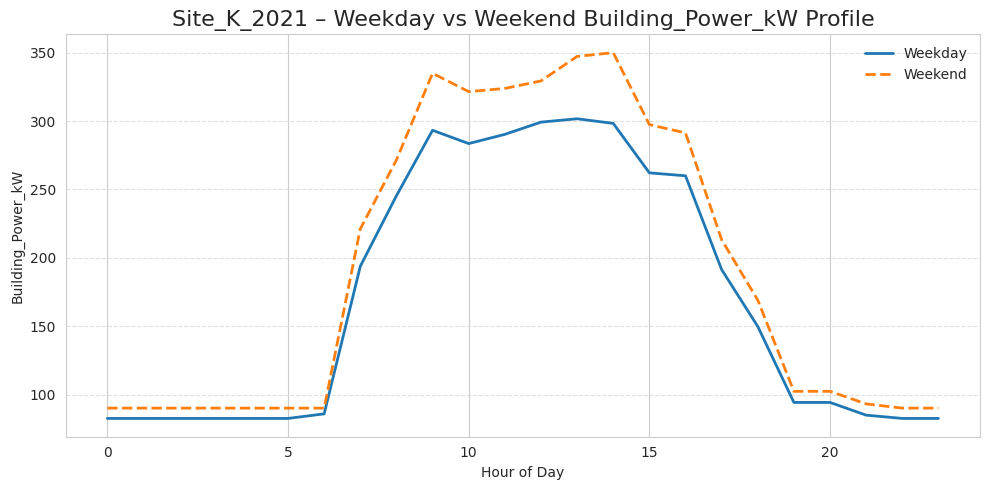

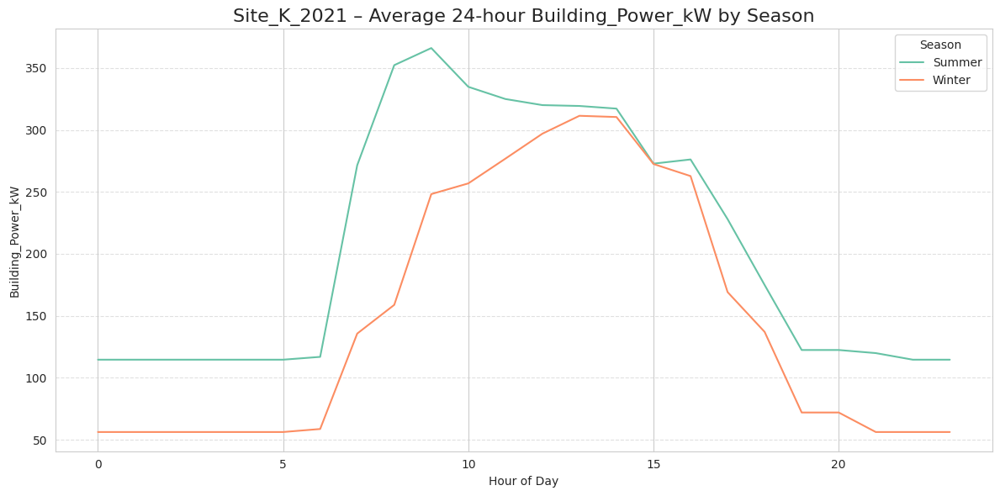


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

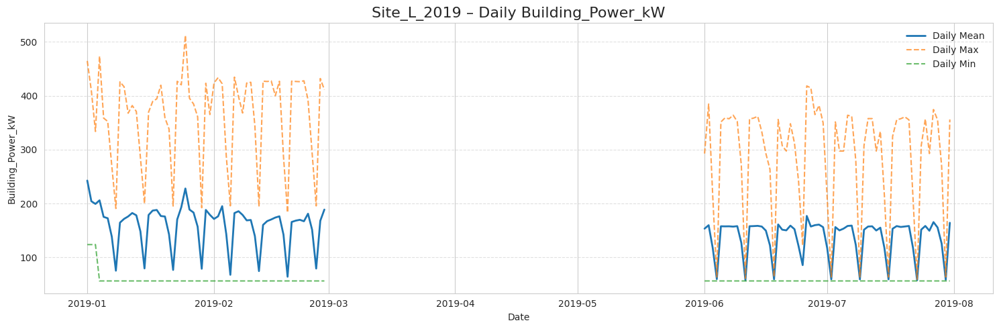

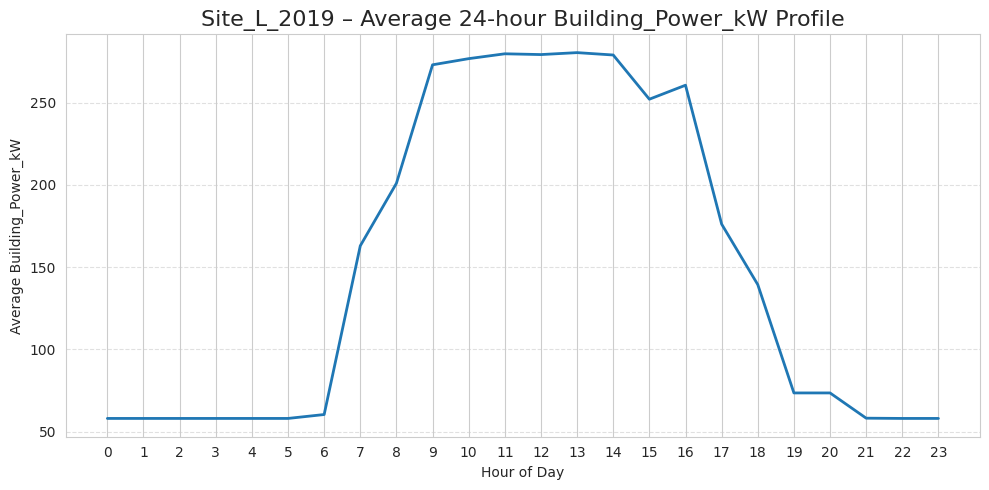

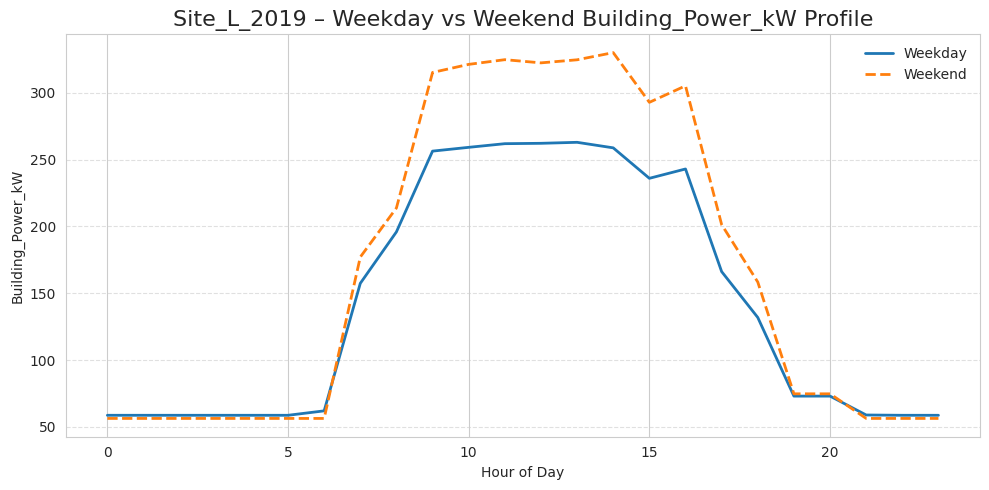

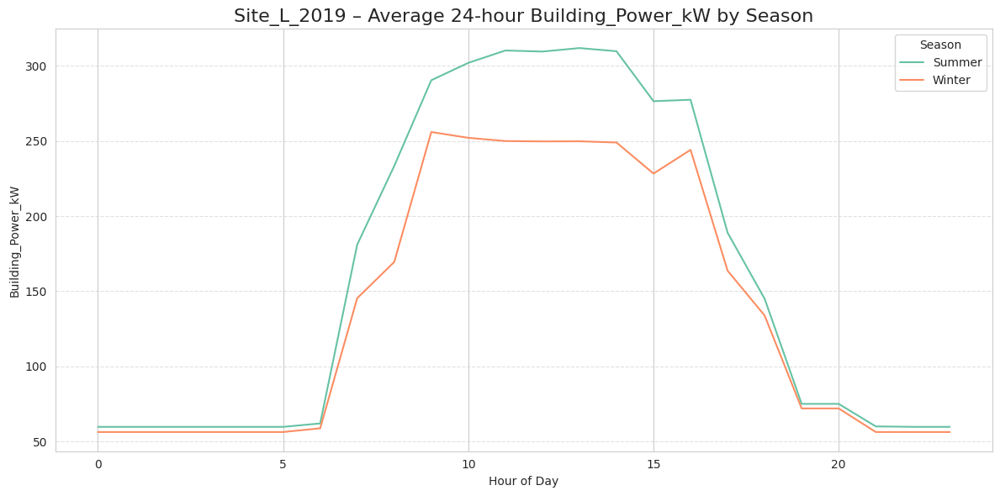


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

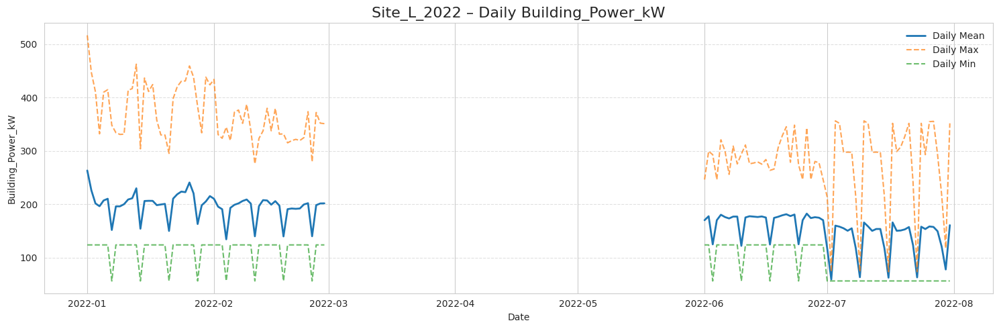

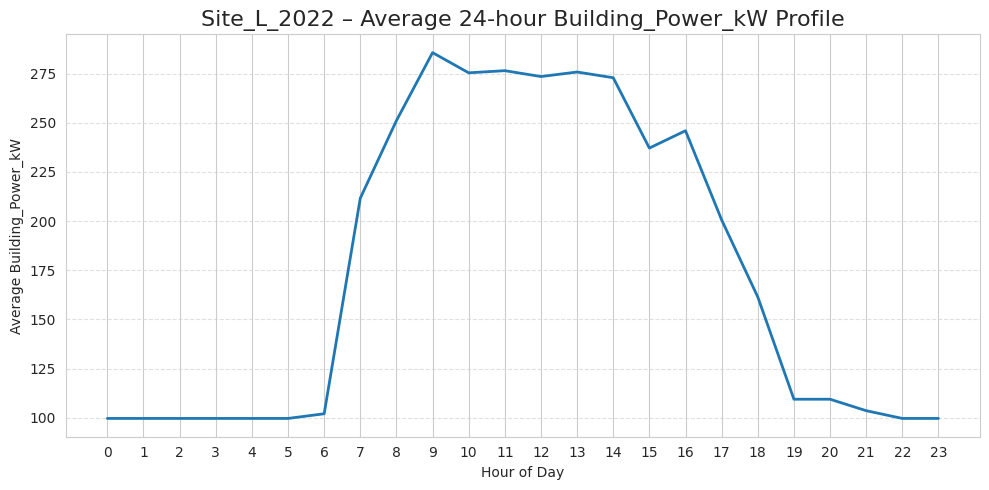

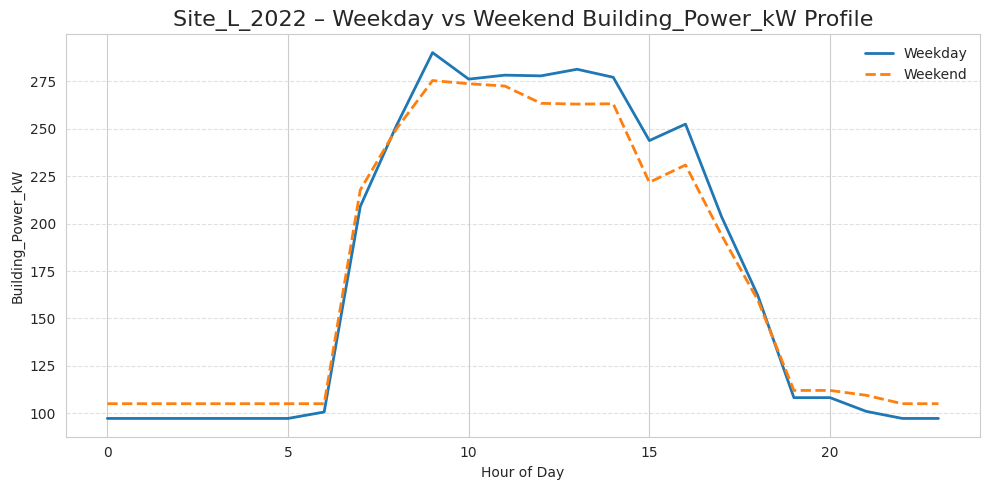

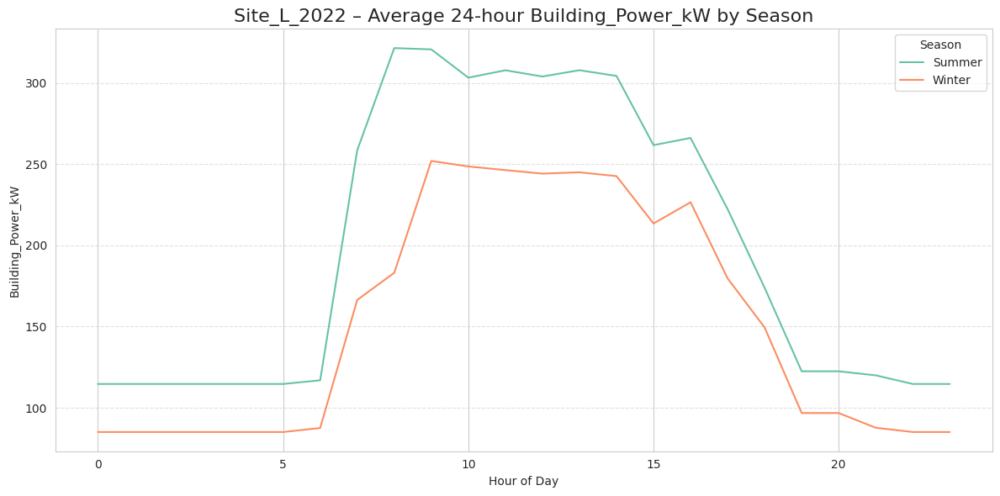


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

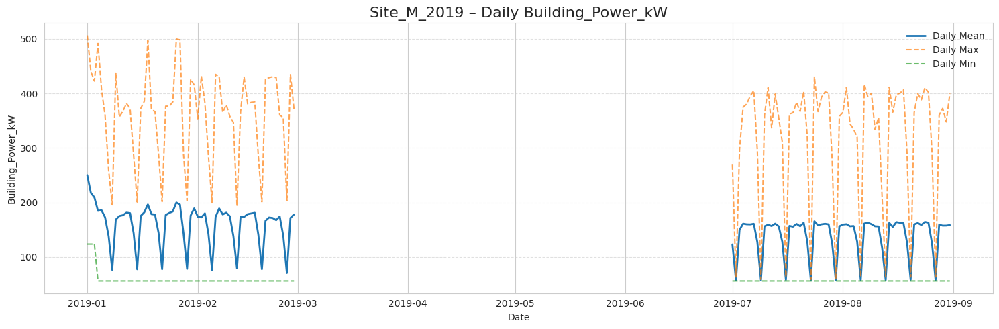

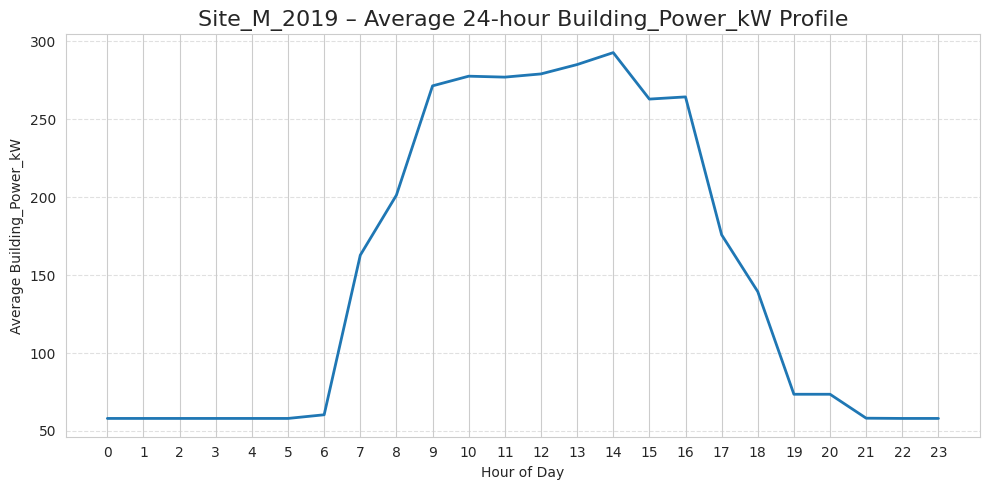

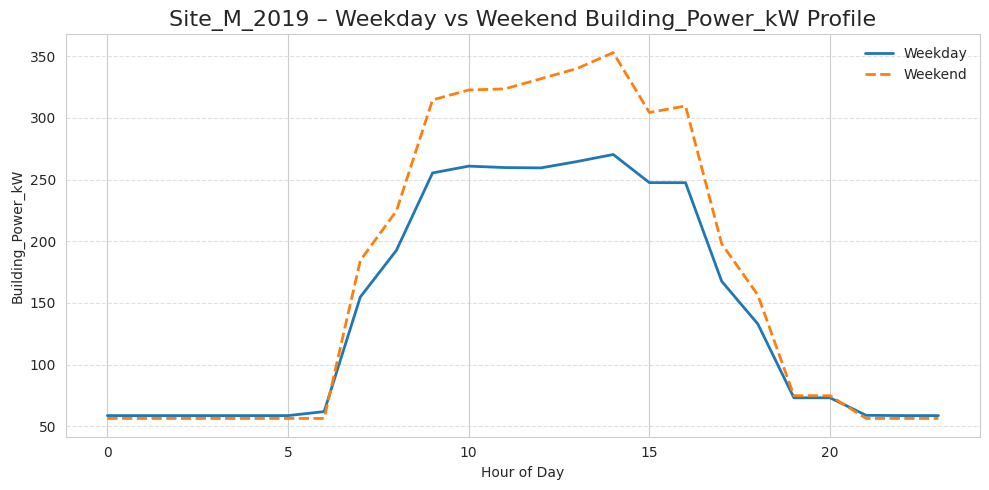

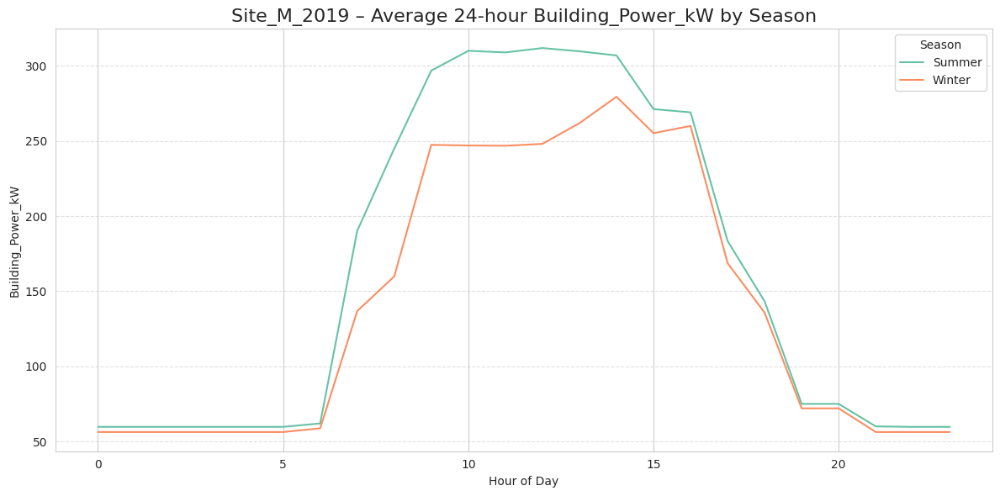


******************************************************************************************


/tmp/ipython-input-1197033596.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Timestamp_Local'] = pd.to_datetime(df['Timestamp_Local'])
/tmp/ipython-input-1197033596.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Hour'] = df['Timestamp_Local'].dt.hour
/tmp/ipython-input-1197033596.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

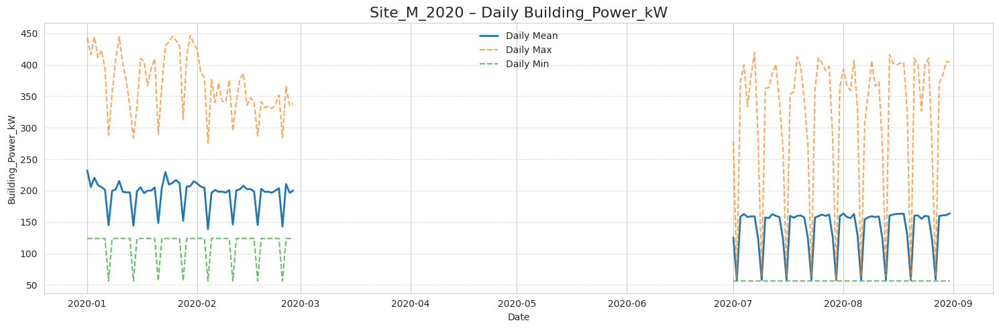

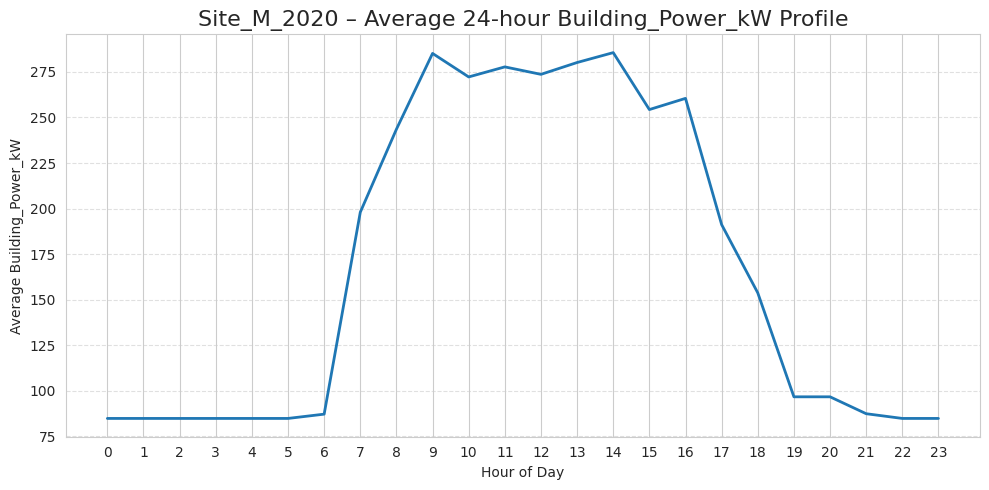

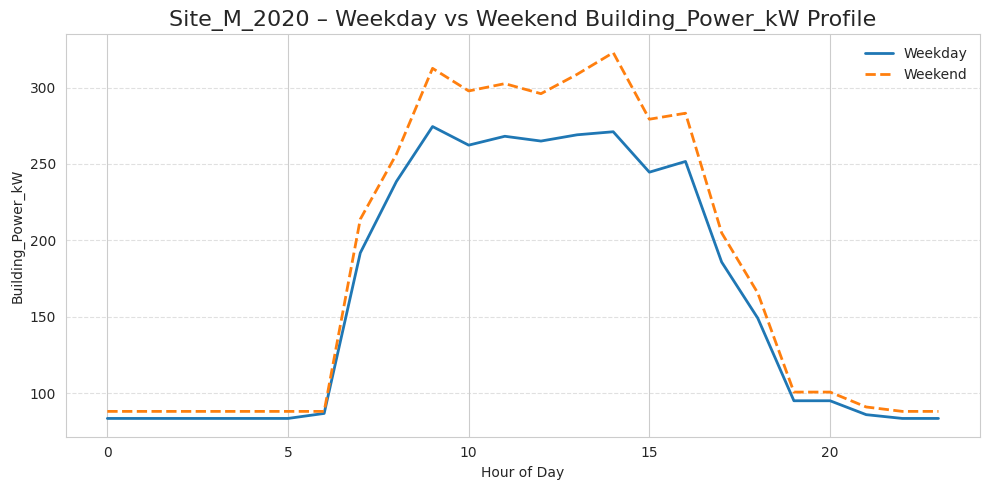

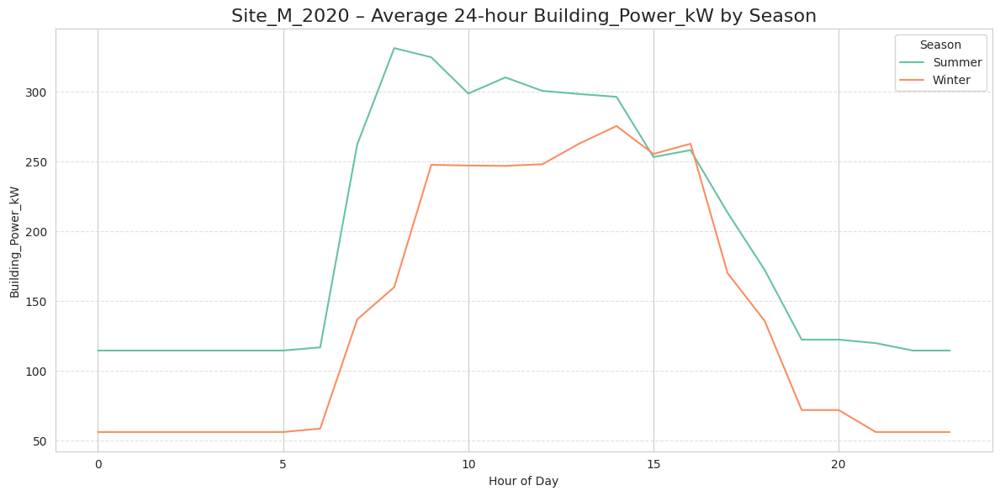


******************************************************************************************


In [ ]:
for key, value in yearly_dfs.items():
  analyzing_all_sites(value,key)
  print("")
  print("*"*90)

In [ ]:
sns.set_style("whitegrid")  # cleaner seaborn plots

def plot_variable_profiles_for_flag(df, variable, df_name, sign):
    """
    Plots daily, average 24-hour, weekday vs weekend, and seasonal hourly profiles
    for a specified variable.

    df: pandas DataFrame with 'Hour', 'Is_Weekend', 'Season', and datetime index
    variable: str, column name to plot
    df_name: str, name of the dataset
    """
    df[variable]=df[variable].abs()

    # -------------------
    # Average 24-hour profile
    hourly_profile = df.groupby('Hour')[variable].sum()
    plt.figure(figsize=(10,5))
    sns.lineplot(x=hourly_profile.index, y=hourly_profile.values, linewidth=2)
    plt.title(f"{df_name} – {sign} Average 24-hour {variable} Profile", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(f"Average {variable}")
    plt.xticks(range(24))
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # -------------------
    # Weekday vs weekend
    weekday_profile = df[df['Is_Weekend']==False].groupby('Hour')[variable].sum()
    weekend_profile = df[df['Is_Weekend']==True].groupby('Hour')[variable].sum()

    plt.figure(figsize=(10,5))
    plt.plot(weekday_profile.index, weekday_profile.values, label='Weekday', linewidth=2)
    plt.plot(weekend_profile.index, weekend_profile.values, label='Weekend', linewidth=2, linestyle='--')
    plt.title(f"{df_name} – {sign} Weekday vs Weekend {variable} Profile", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(variable)
    plt.legend(frameon=False)
    plt.xticks(range(24))
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # -------------------
    # Hourly profile by season
    hourly_season = df.groupby(['Season','Hour'])[variable].sum().reset_index()
    plt.figure(figsize=(12,6))
    sns.lineplot(data=hourly_season, x='Hour', y=variable, hue='Season', palette='Set2')
    plt.title(f"{df_name} – {sign} Average 24-hour {variable} by Season", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(variable)
    plt.xticks(range(24))
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


In [ ]:
def plot_variable_profiles_for_flag_temp_gh_power(df_activity, df_orig, dr_flag, variable, df_name, sign):

  df_activity[dr_flag]=df_activity[dr_flag].abs()

  for season in df_activity['Season'].unique():
    df_season=df_activity[df_activity['Season']==season]
    df_orig_season=df_orig[df_orig['Season']==season]

    # -------------------
    # Average 24-hour profile
    fig, ax1 = plt.subplots(figsize=(10,5))

    hourly_profile_dr = df_season.groupby('Hour')[dr_flag].sum()
    hourly_profile_var = df_season.groupby('Hour')[variable].mean()
    hourly_profile_var_orig = df_orig_season.groupby('Hour')[variable].mean()

    # Left y-axis: counts
    ax1.plot(hourly_profile_dr.index, hourly_profile_dr.values, color="tab:blue", linewidth=2, marker="o")
    ax1.set_xlabel("Hour of Day")
    ax1.set_ylabel("Number of Events", color="tab:blue")
    ax1.tick_params(axis="y", labelcolor="tab:blue")
    ax1.set_xticks(range(24))
    ax1.grid(axis="y", linestyle="--", alpha=0.6)

    # Right y-axis: another metric
    ax2 = ax1.twinx()
    ax2.plot(hourly_profile_var.index, hourly_profile_var.values,
            color="tab:red", linewidth=2, marker="s", linestyle="--", label=f"{variable} (DR dataset)")
    ax2.plot(hourly_profile_var_orig.index, hourly_profile_var_orig.values,
            color="tab:green", linewidth=2, marker="^", linestyle=":", label=f"{variable} (Original dataset)")

    ax2.set_ylabel(f"{variable}", color="tab:red")
    ax2.tick_params(axis="y", labelcolor="tab:red")
    ax2.set_xticks(range(24))

    # Add legends
    ax1.legend(["DR Events"], loc="upper left")
    ax2.legend(loc="upper right")

    plt.title(f"{df_name} For {season} Season Hourly {sign} DR Events and {variable}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [ ]:
def plot_both_pos_neg_flag(df_pos, df_neg, variable, df_name, sign):

    df_pos[variable]=df_pos[variable].abs()
    df_neg[variable]=df_neg[variable].abs()

    # -------------------
    # Average 24-hour profile
    negatives_profile = df_neg.groupby('Hour')[variable].sum()
    positives_profile = df_pos.groupby('Hour')[variable].sum()

    plt.figure(figsize=(10,5))
    plt.plot(negatives_profile.index, negatives_profile.values, label='Negative DR Flags', color="tab:blue", linewidth=2)
    plt.plot(positives_profile.index, positives_profile.values, label='Positive DR Flags', color="tab:green", linewidth=2)
    plt.title(f"{df_name} – {sign} Average 24 Hour {variable} Profile", fontsize=16)
    plt.xlabel("Hour of Day")
    plt.ylabel(variable)
    plt.legend(frameon=False)
    plt.xticks(range(24))
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()


In [ ]:
def analyzing_abcd(df, df_name):
    df = make_time_numeric(df) # Generate "Hour", "Weekday", "Is_Weekend", "Date", "Month" columns
    df['Season'] = df['Month'].apply(get_season_au) # Generate "Season" column (Australian seasons)

    # keep only flag activity
    flag_activity_neg = df[df['Demand_Response_Flag']==-1].copy() # Take all records with -1 DR flag
    flag_activity_zero = df[df['Demand_Response_Flag']==0].copy() # Take all records with 0 DR flag
    flag_activity_pos = df[df['Demand_Response_Flag']==1].copy()  # Take all records with +1 DR flag

    # Create time columns from respective indexes (indexes were time also)
    flag_activity_neg['time_only_neg'] = flag_activity_neg.index.time
    flag_activity_zero['time_only_zero'] = flag_activity_zero.index.time
    flag_activity_pos['time_only_pos'] = flag_activity_pos.index.time

    # Plot 24 hour FLAG graphs for all -1 and +1 DR flag data in a single graph
    plot_both_pos_neg_flag(flag_activity_pos, flag_activity_neg, "Demand_Response_Flag", df_name, "Negative and Positive Flag Activity")
    # Plot 24 hour, 24 hour by weekday/weekend, 24 hour by season FLAG graphs for all -1 DR flag data
    plot_variable_profiles_for_flag(flag_activity_neg, "Demand_Response_Flag", df_name, "Negative Flag Activity")
    # Plot 24 hour, 24 hour by weekday/weekend, 24 hour by season FLAG graphs for all +1 DR flag data
    plot_variable_profiles_for_flag(flag_activity_pos, "Demand_Response_Flag", df_name, "Positive Flag Activity")

    # For all seasons, plot 24 hour flag data (-1 or +1) and average 24 hour temperature, radiation, power data from DR sub-dataset and from all dataset, in a single graph.
    var_list=['Dry_Bulb_Temperature_C','Global_Horizontal_Radiation_W/m2','Building_Power_kW']

    for var in var_list:
      plot_variable_profiles_for_flag_temp_gh_power(flag_activity_neg, df, "Demand_Response_Flag", var, df_name, "Negative Flag Activity")
      plot_variable_profiles_for_flag_temp_gh_power(flag_activity_pos, df, "Demand_Response_Flag", var, df_name, "Positive Flag Activity")


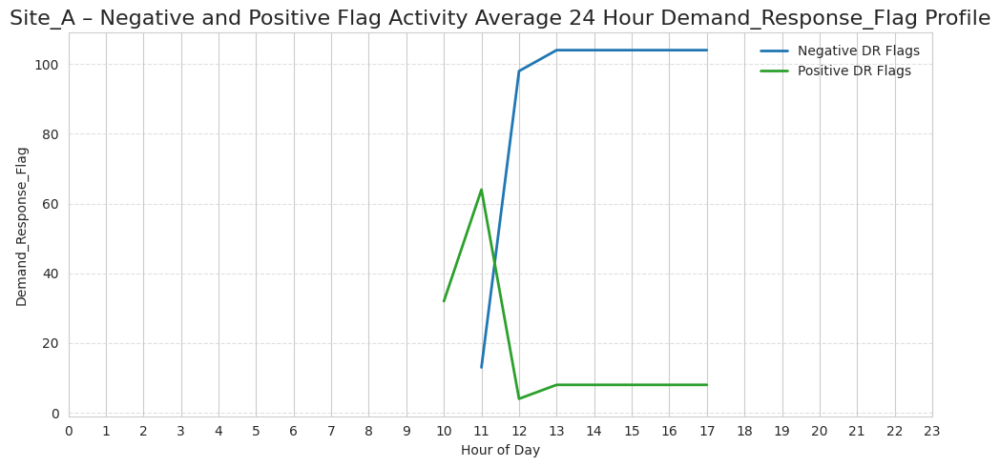

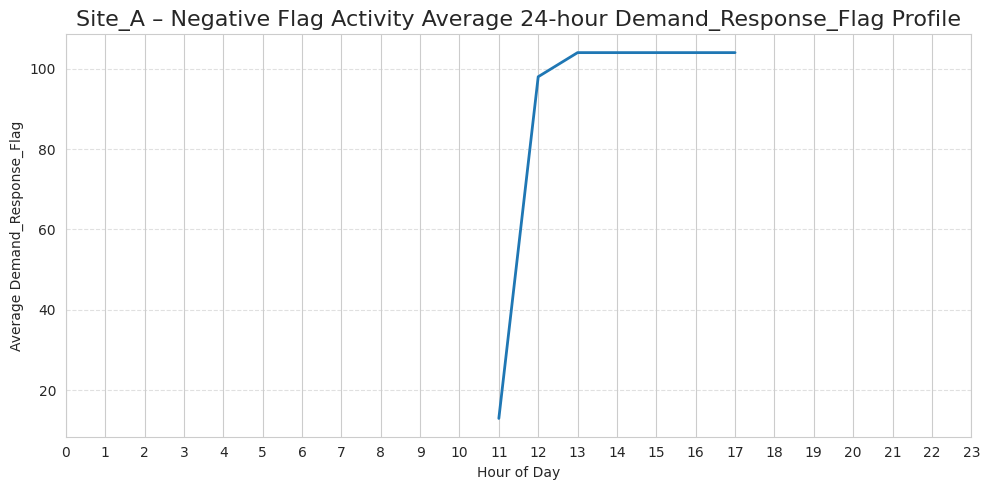

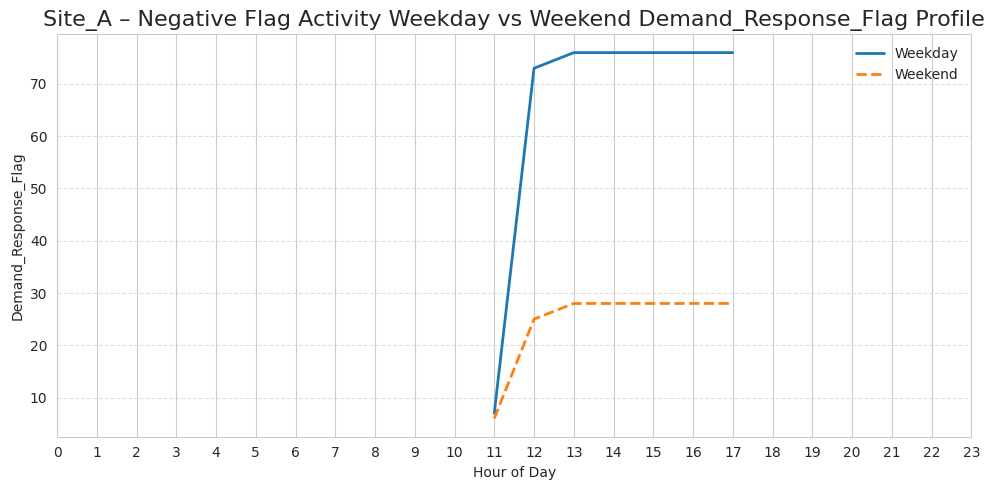

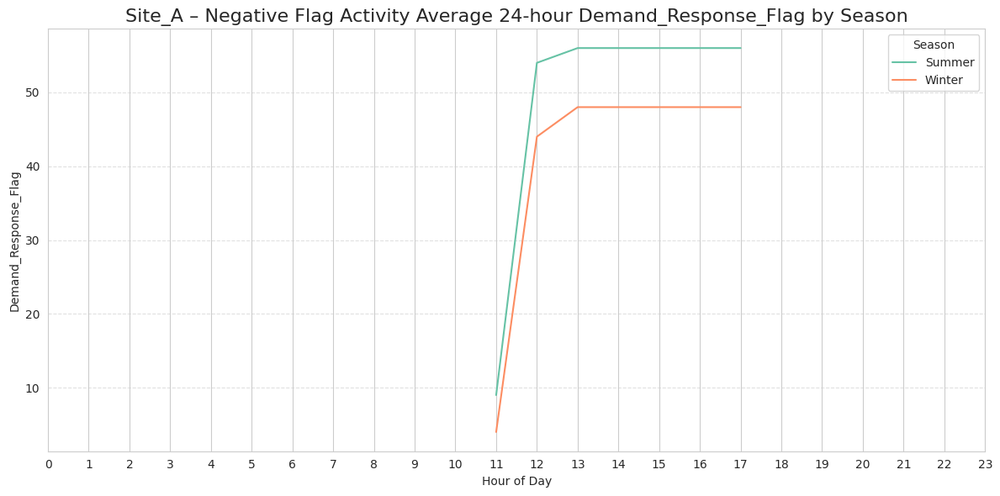

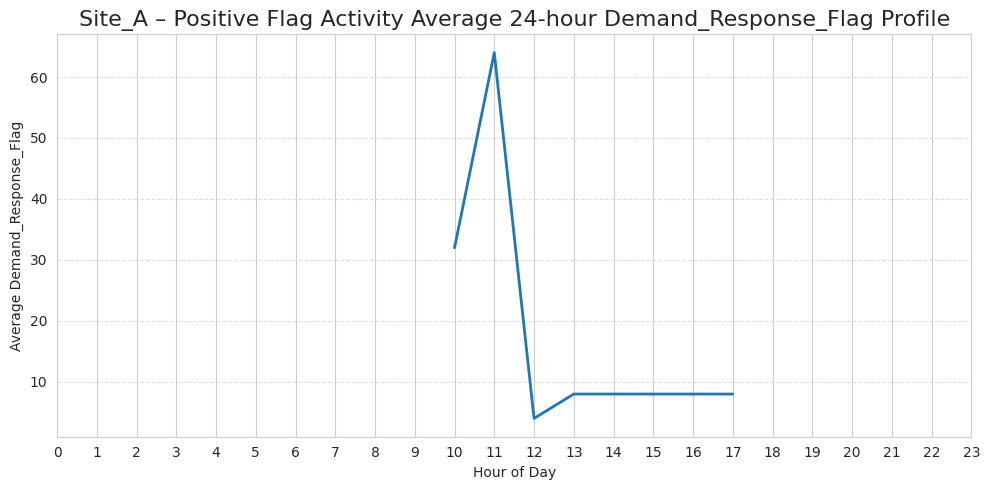

...

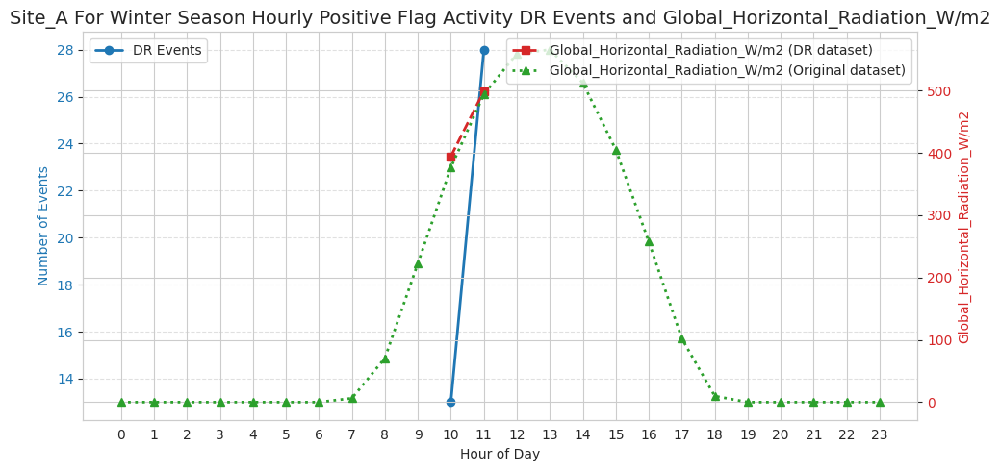

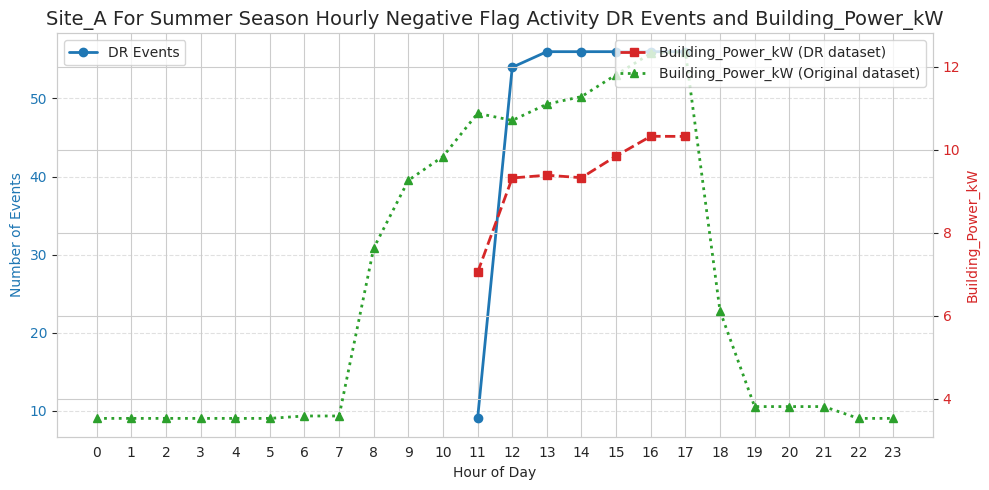

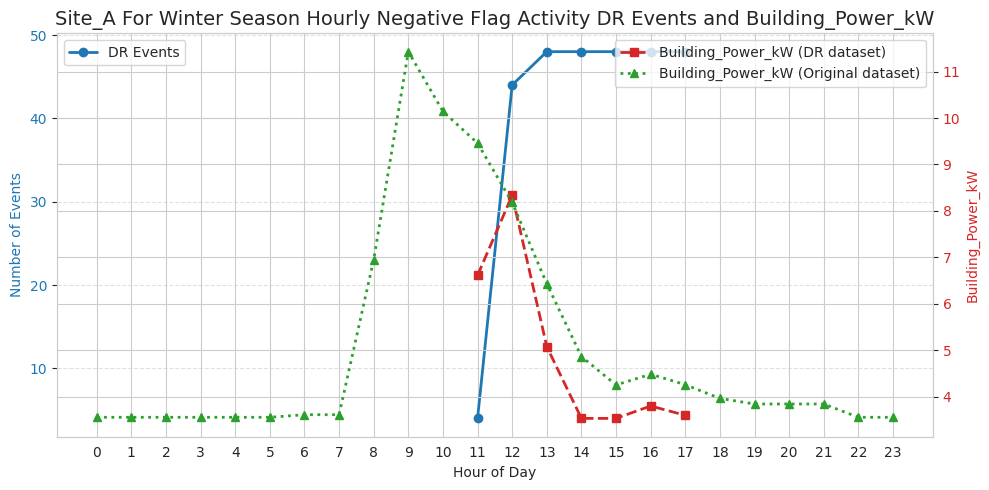

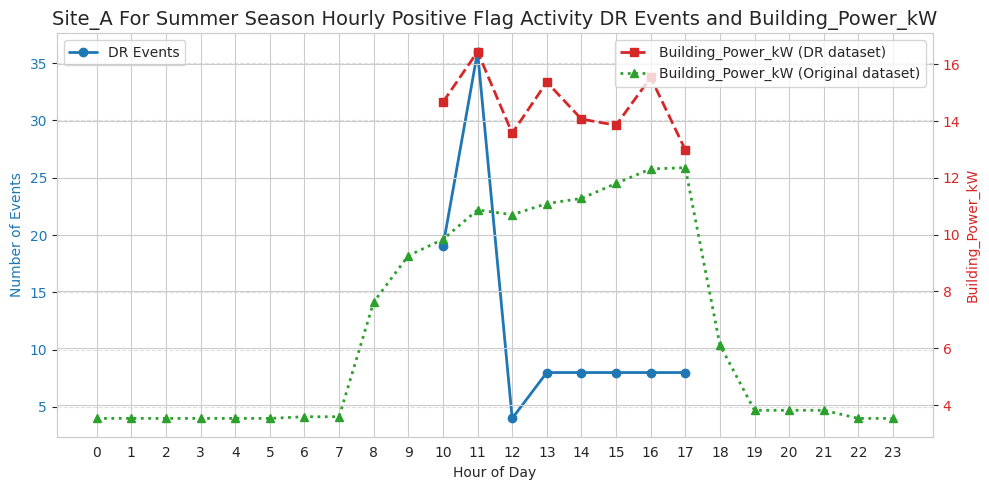

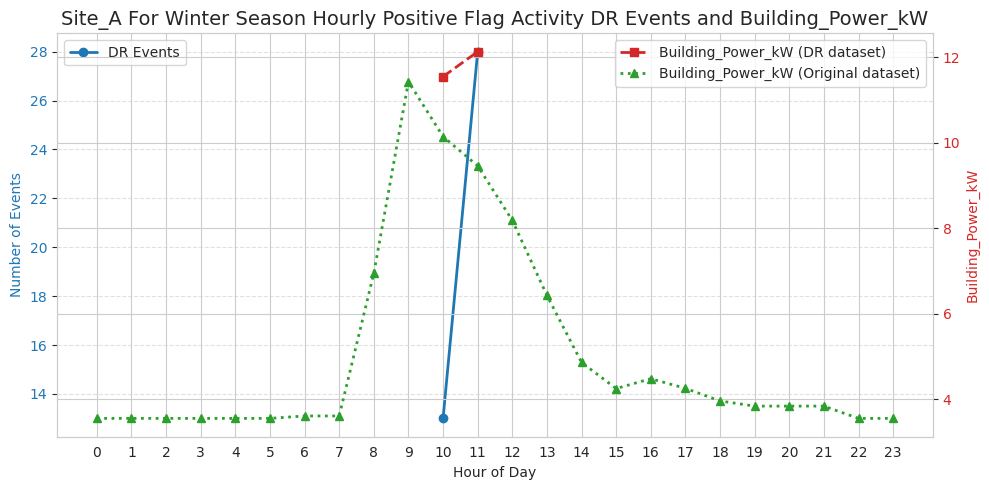

                      Site  Dry_Bulb_Temperature_C  Global_Horizontal_Radiation_W/m2  Building_Power_kW  Demand_Response_Flag  Demand_Response_Capacity_kW  Hour  Weekday  Is_Weekend        Date  Month  Season  is_neg  is_pos  is_neutral  Event_Change Event_ID
Timestamp_Local                                                                                                                                                                                                                                                    
2019-08-16 09:15:00  siteA                   10.45                             266.0              13.29                     0                          0.0     9        4       False  2019-08-16      8  Winter       0       0           1            41     0_41
2019-02-24 23:45:00  siteA                   20.31                               0.0               4.80                     0                          0.0    23        6        True  2019-02-24      2  Summer       0    

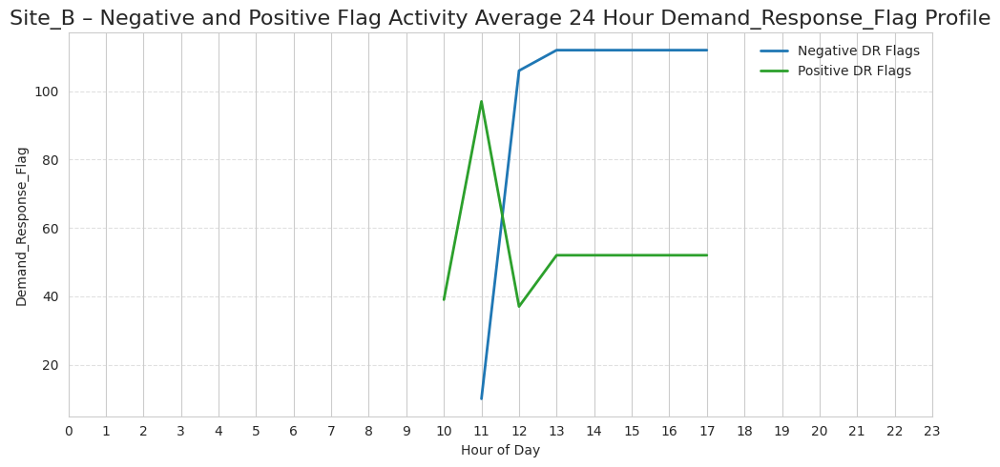

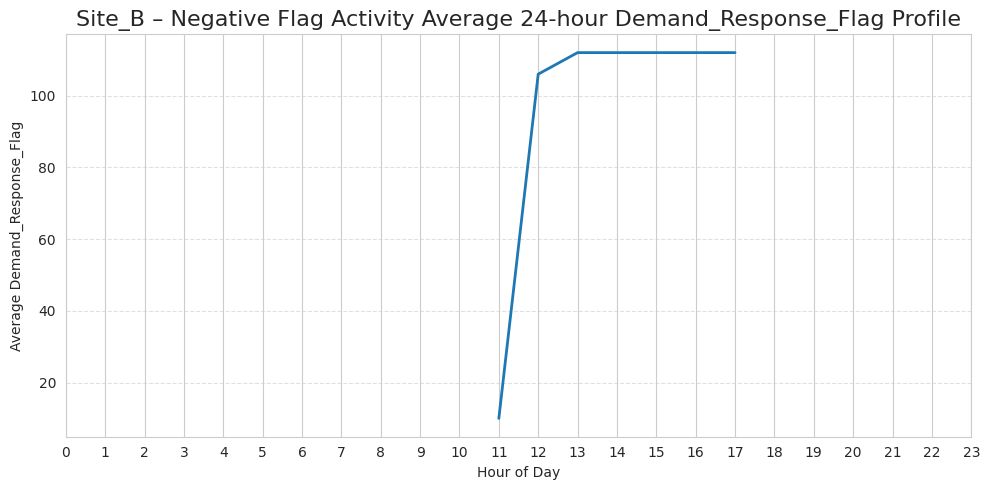

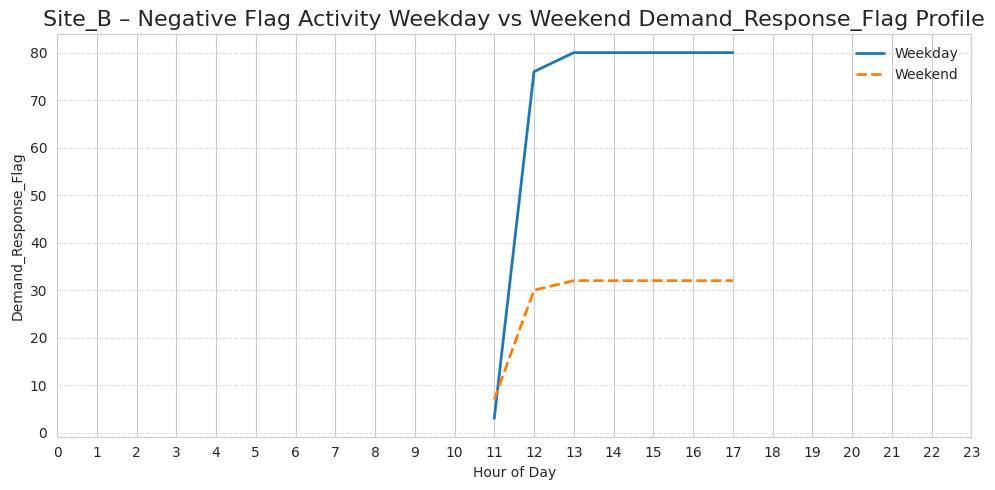

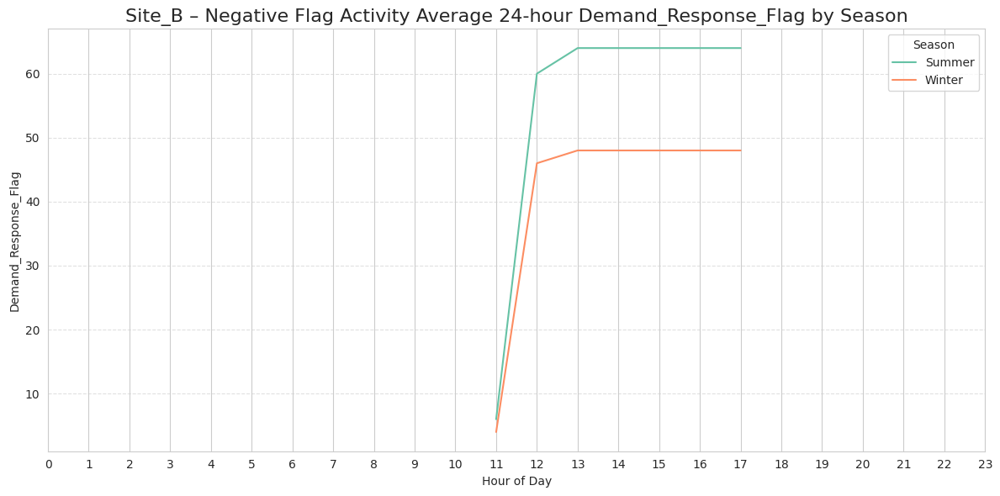

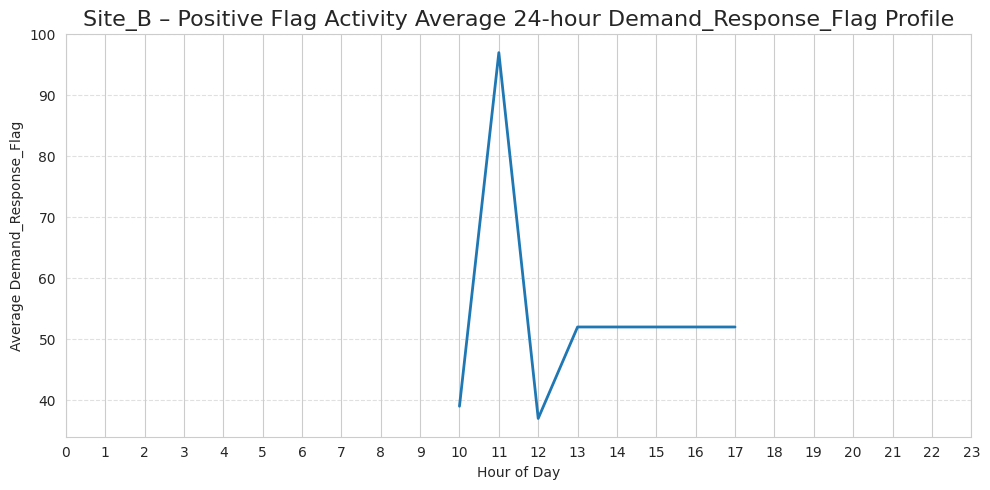

...

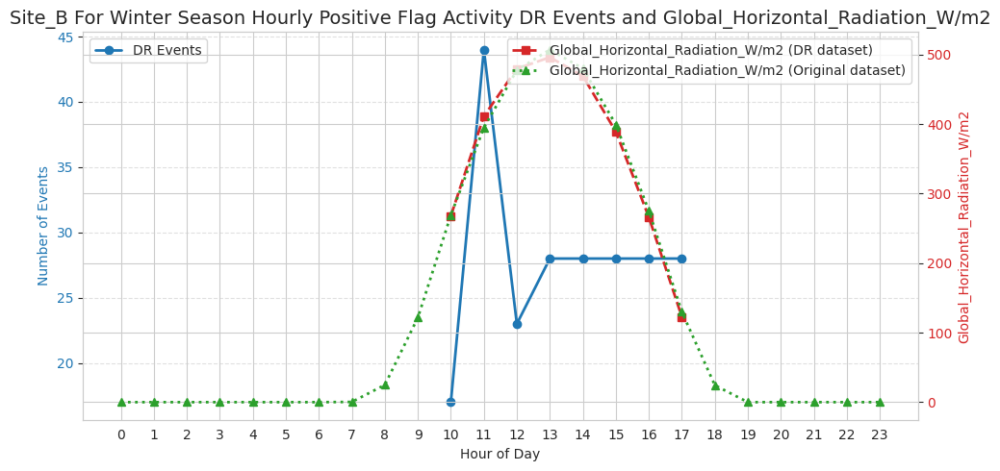

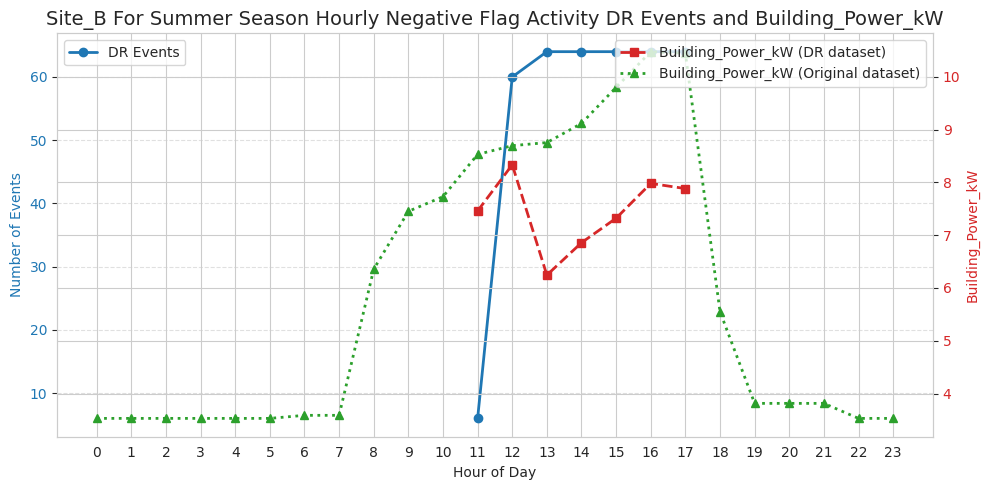

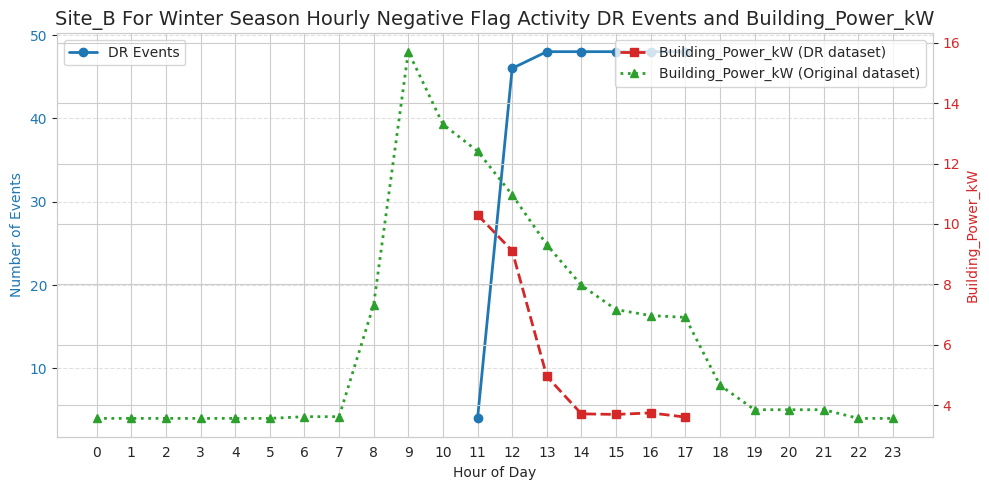

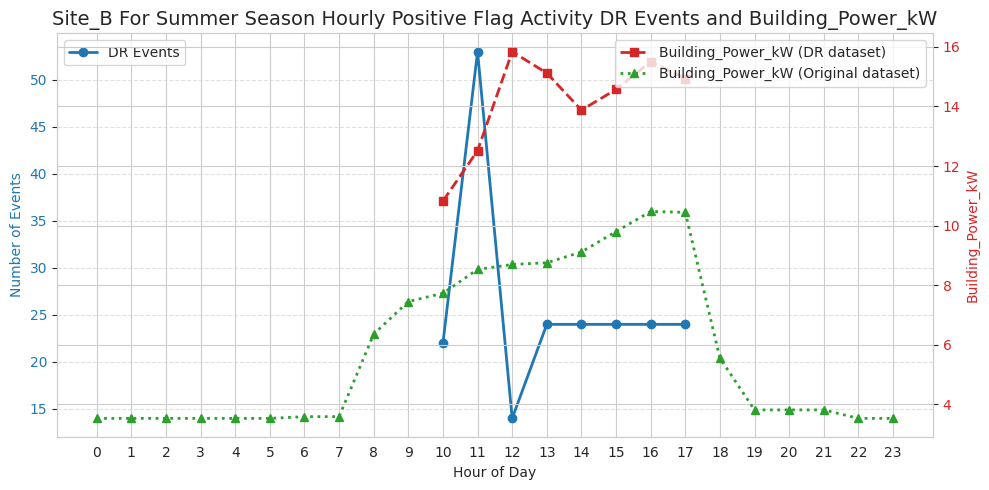

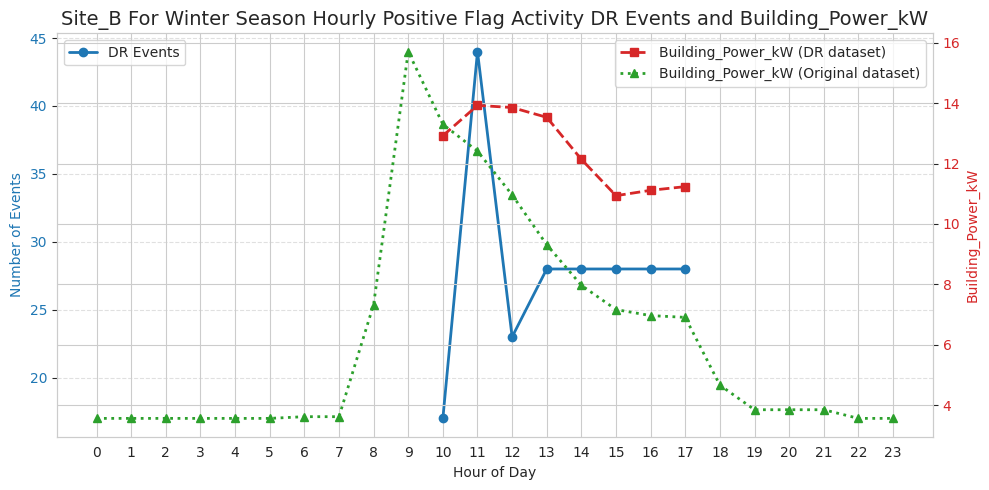

                      Site  Dry_Bulb_Temperature_C  Global_Horizontal_Radiation_W/m2  Building_Power_kW  Demand_Response_Flag  Demand_Response_Capacity_kW  Hour  Weekday  Is_Weekend        Date  Month  Season  is_neg  is_pos  is_neutral  Event_Change Event_ID
Timestamp_Local                                                                                                                                                                                                                                                    
2019-11-26 01:15:00  siteB                   15.32                               0.0                0.4                     0                          0.0     1        1       False  2019-11-26     11  Spring       0       0           1            63     0_63
2019-01-30 00:30:00  siteB                   19.50                               0.0                4.8                     0                          0.0     0        2       False  2019-01-30      1  Summer       0    

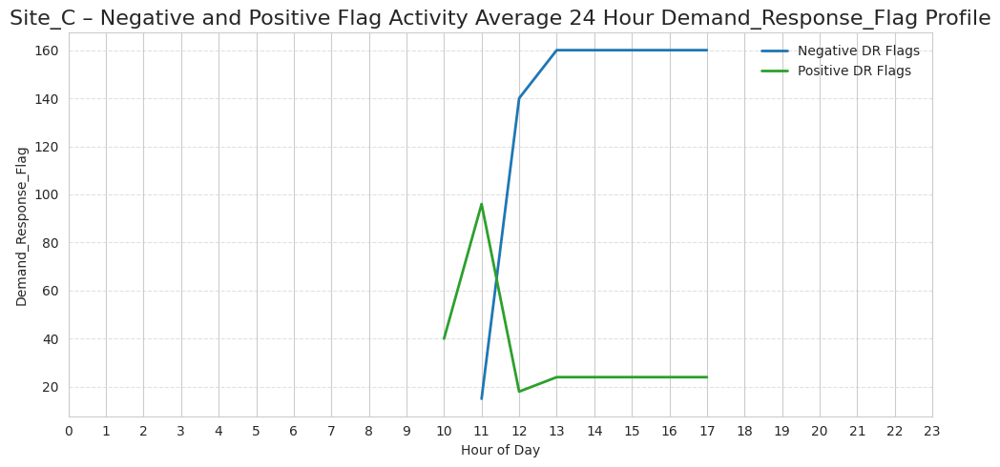

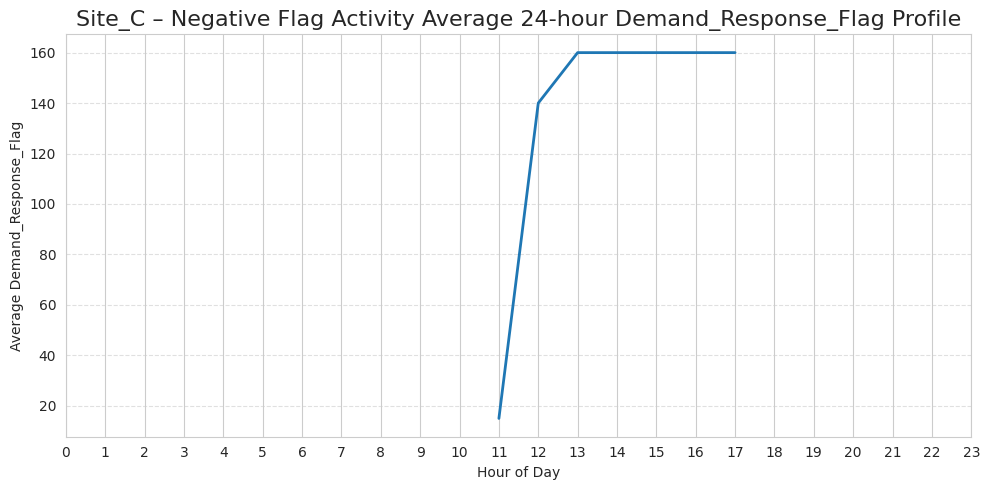

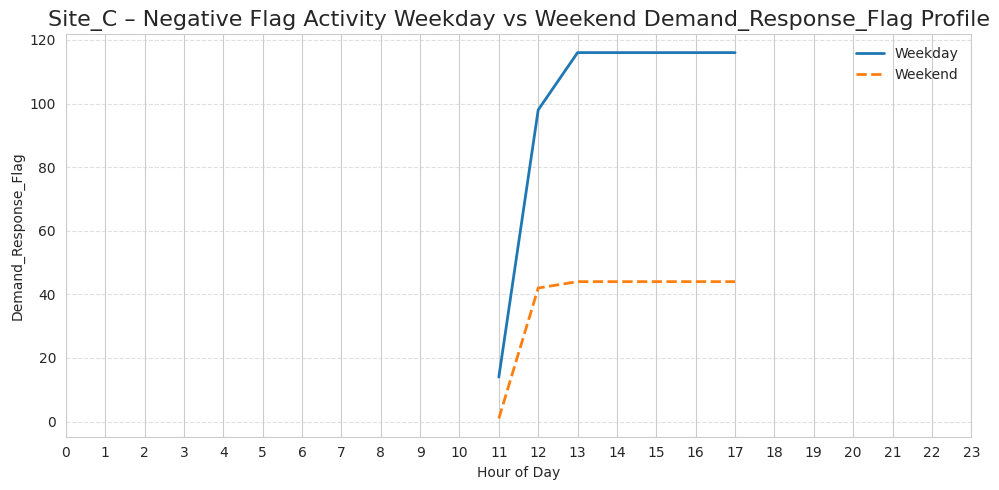

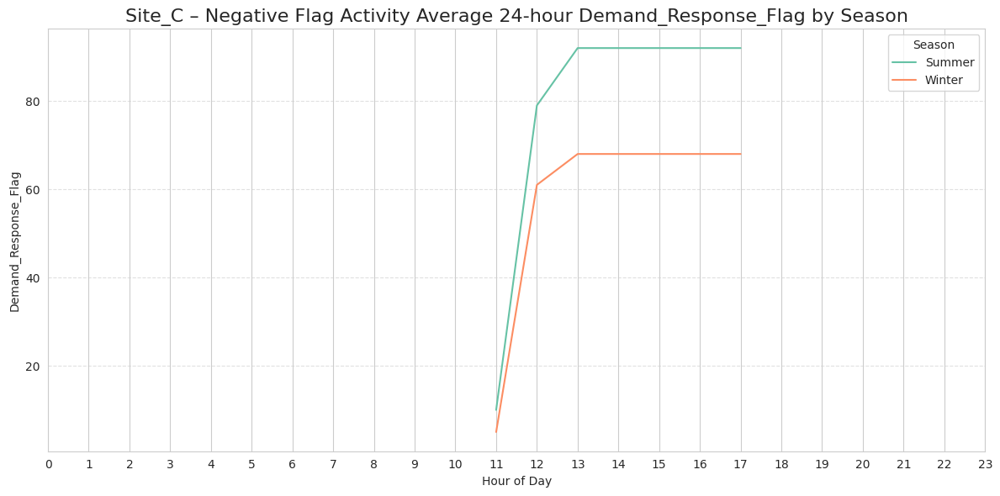

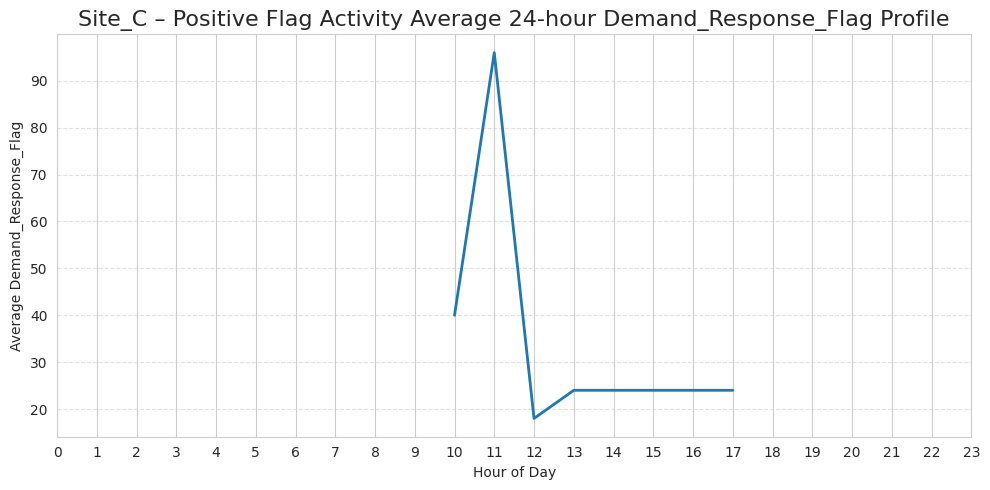

...

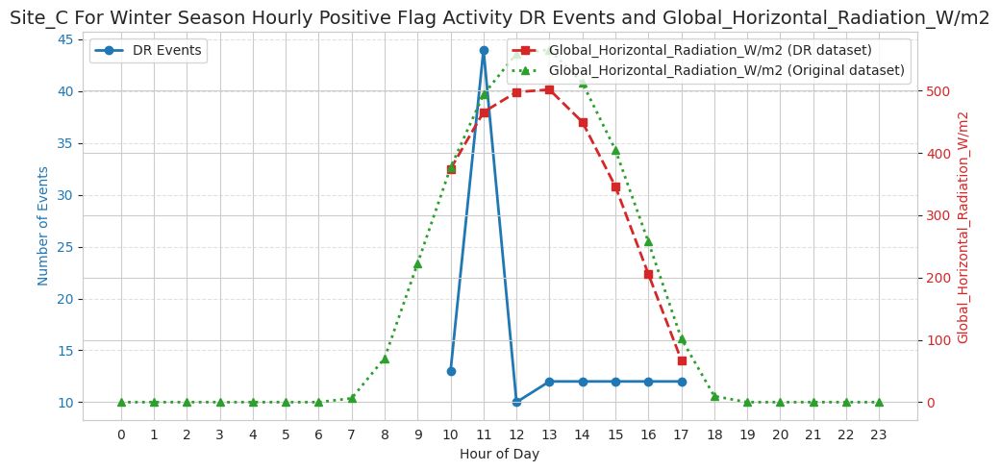

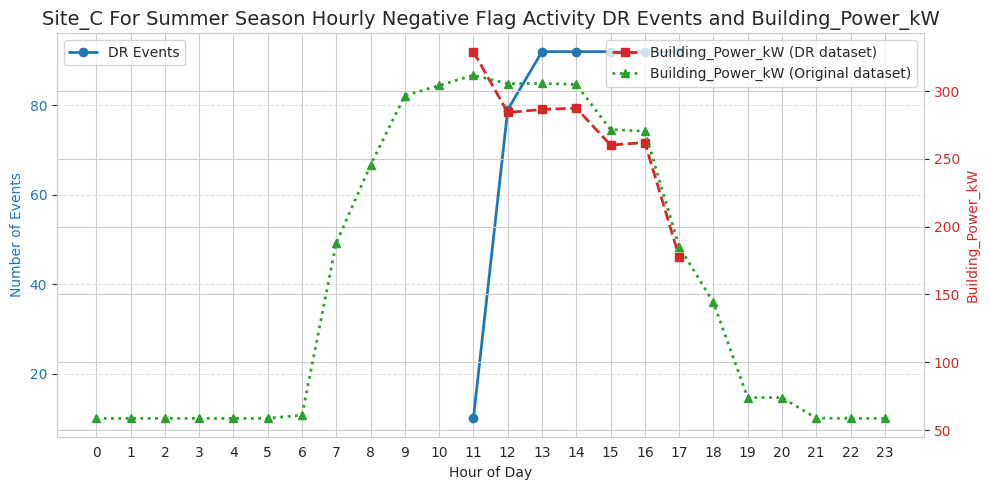

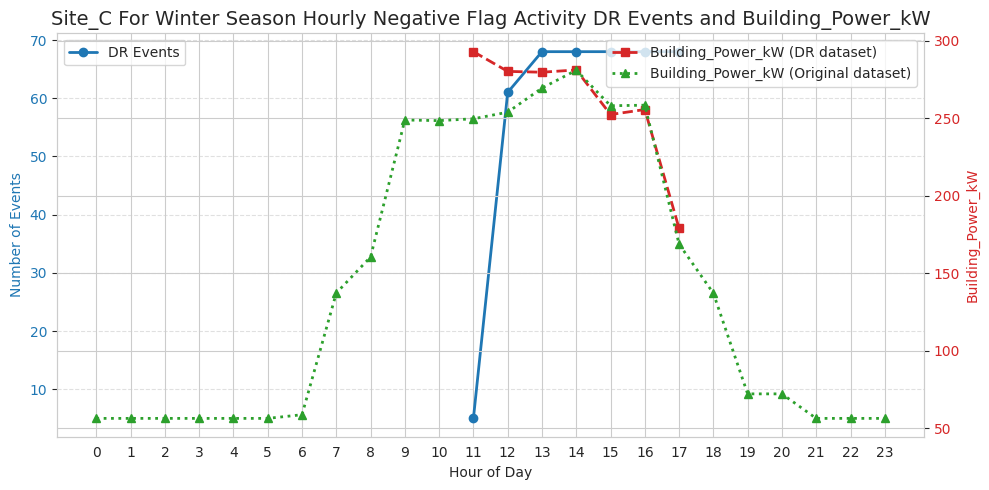

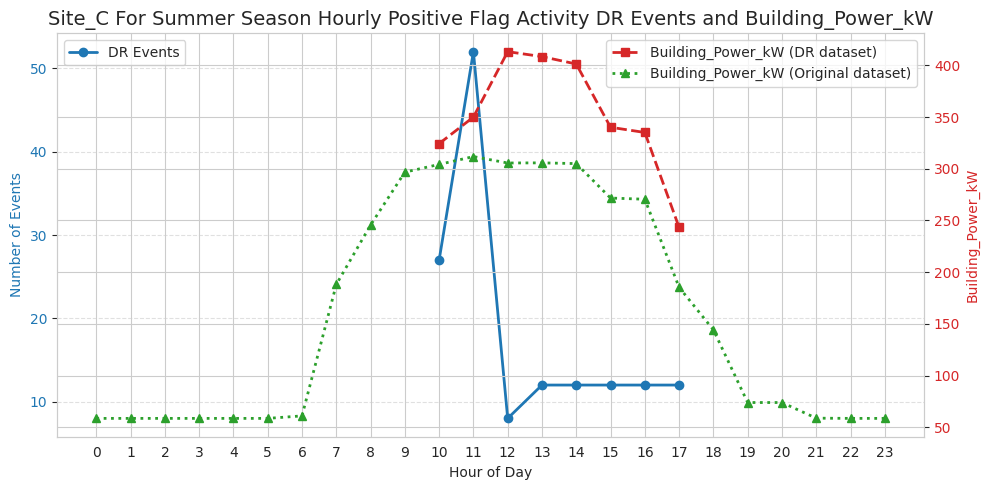

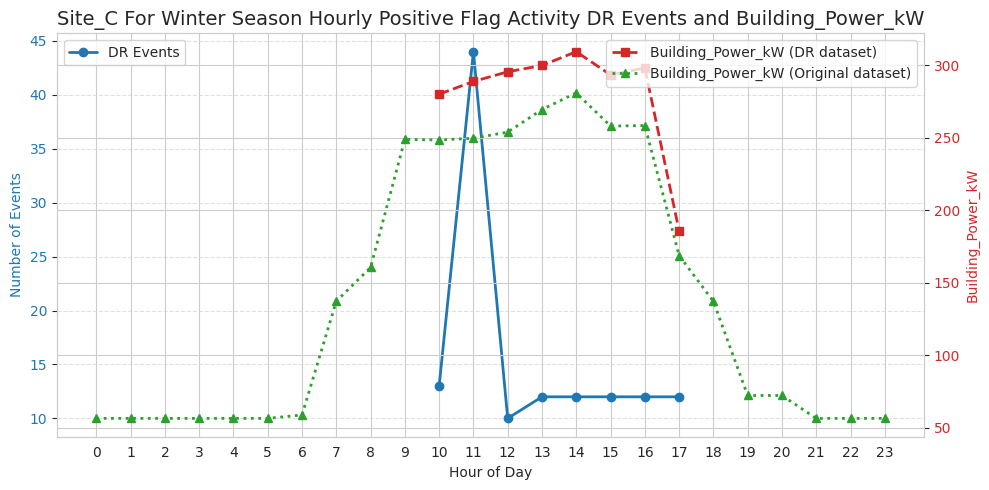

                      Site  Dry_Bulb_Temperature_C  Global_Horizontal_Radiation_W/m2  Building_Power_kW  Demand_Response_Flag  Demand_Response_Capacity_kW  Hour  Weekday  Is_Weekend        Date  Month  Season  is_neg  is_pos  is_neutral  Event_Change Event_ID
Timestamp_Local                                                                                                                                                                                                                                                    
2023-05-13 20:30:00  siteC                   16.95                               0.0              74.74                     0                          0.0    20        5        True  2023-05-13      5  Autumn       0       0           1            29     0_29
2023-05-04 17:45:00  siteC                   17.82                              49.0             182.76                     0                          0.0    17        3       False  2023-05-04      5  Autumn       0    

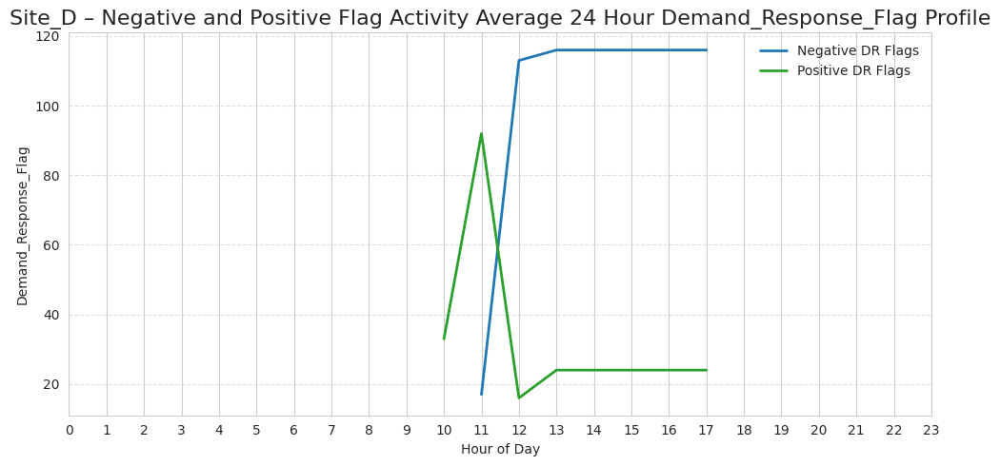

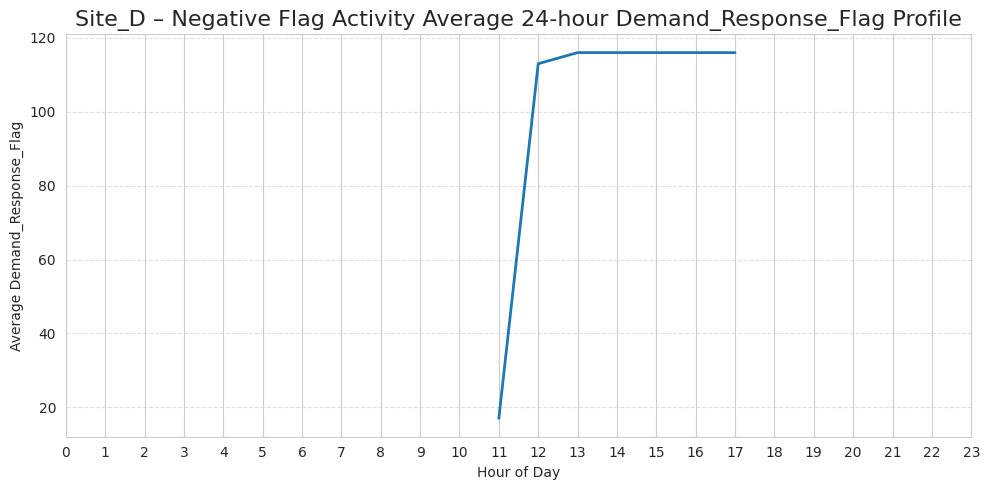

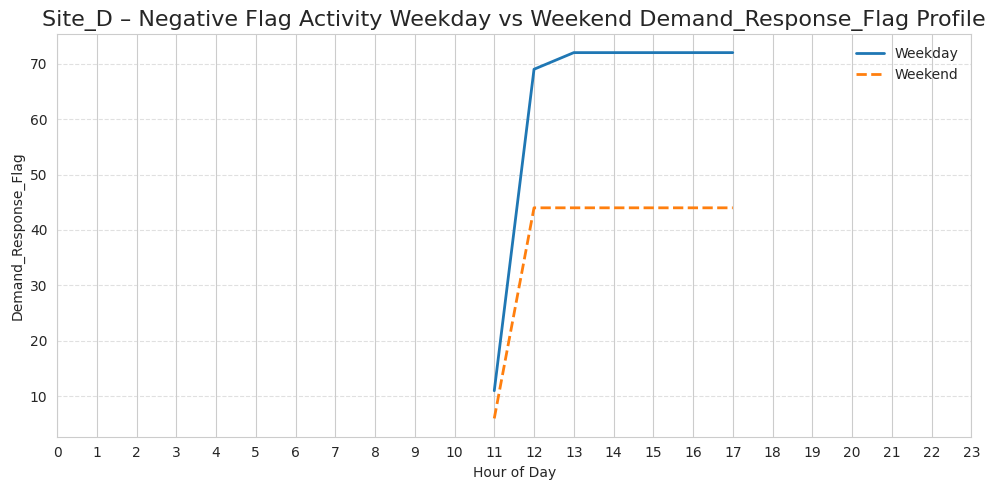

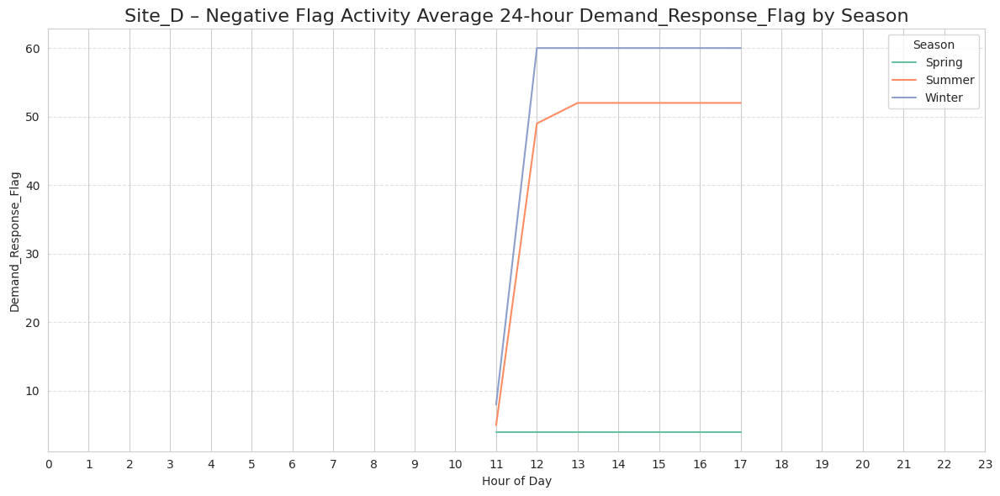

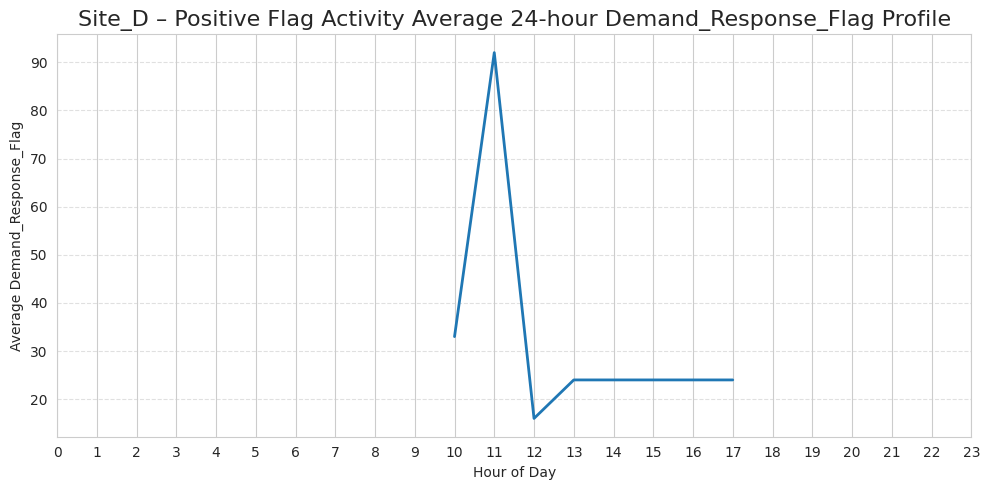

...

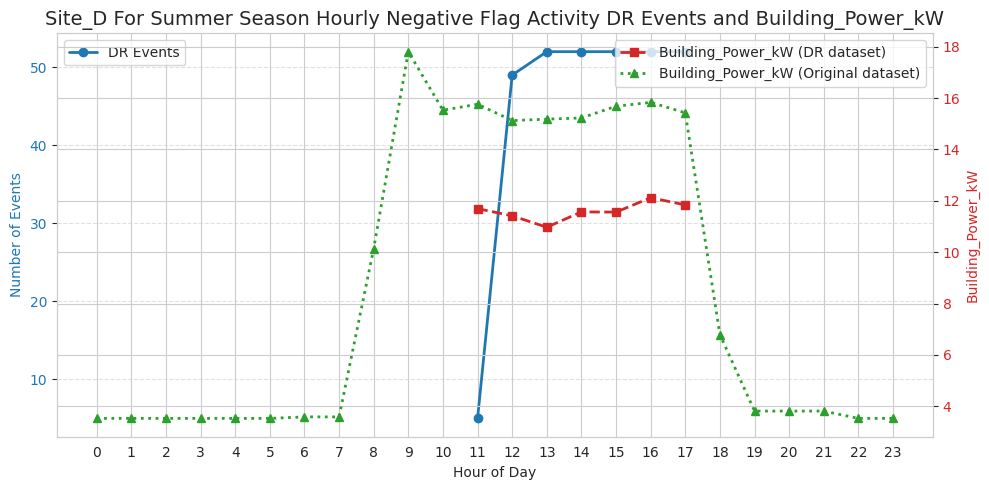

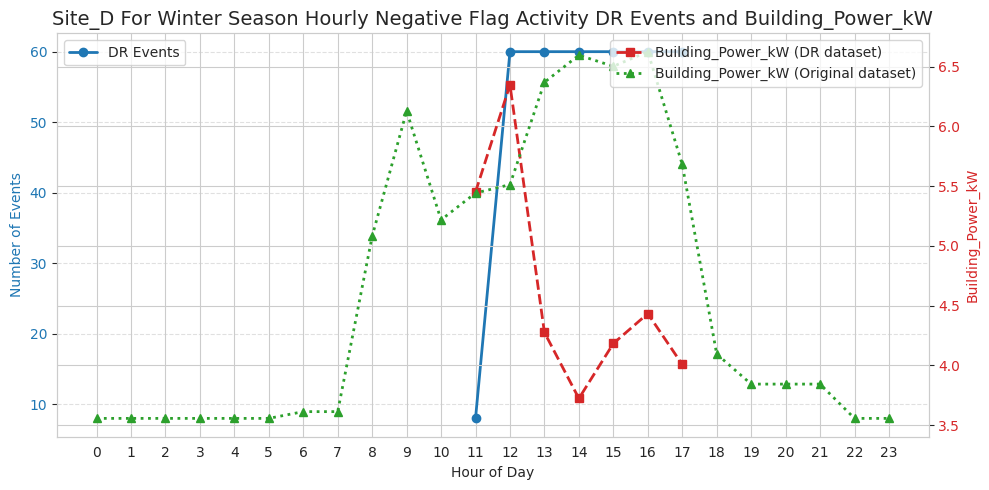

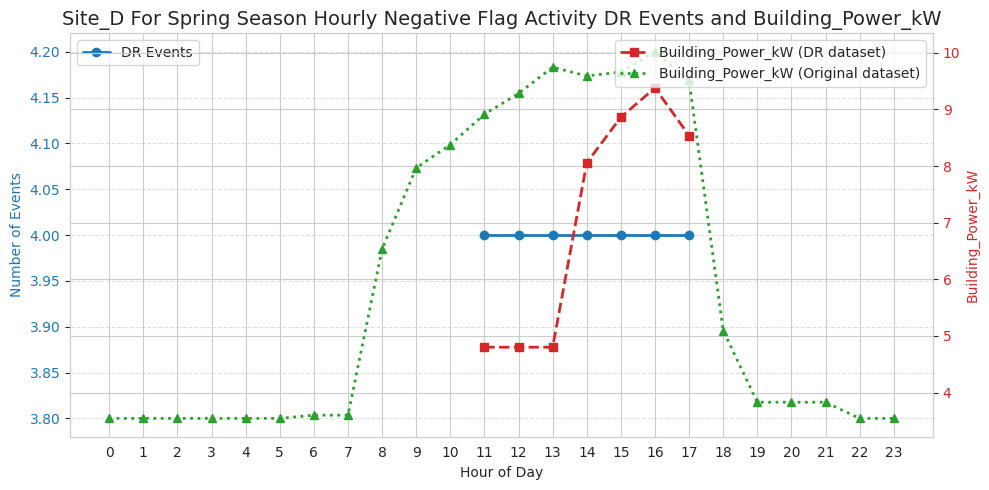

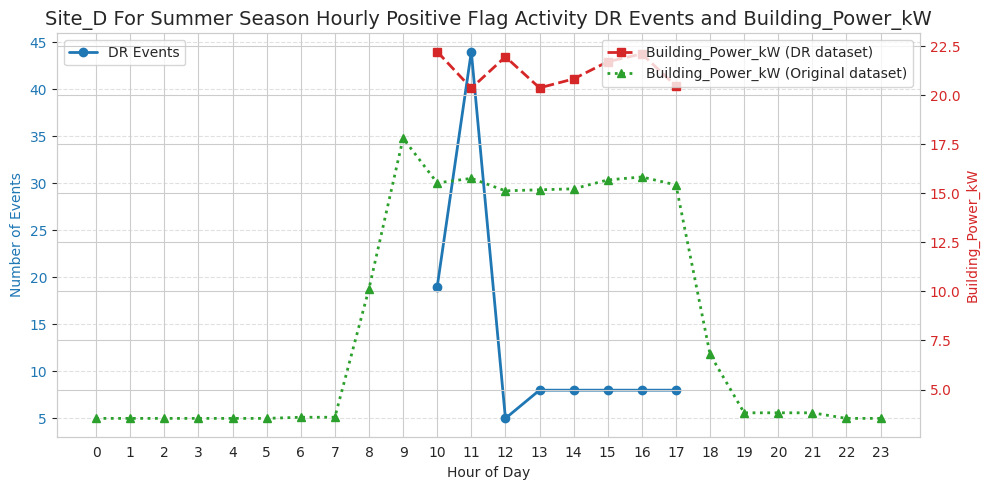

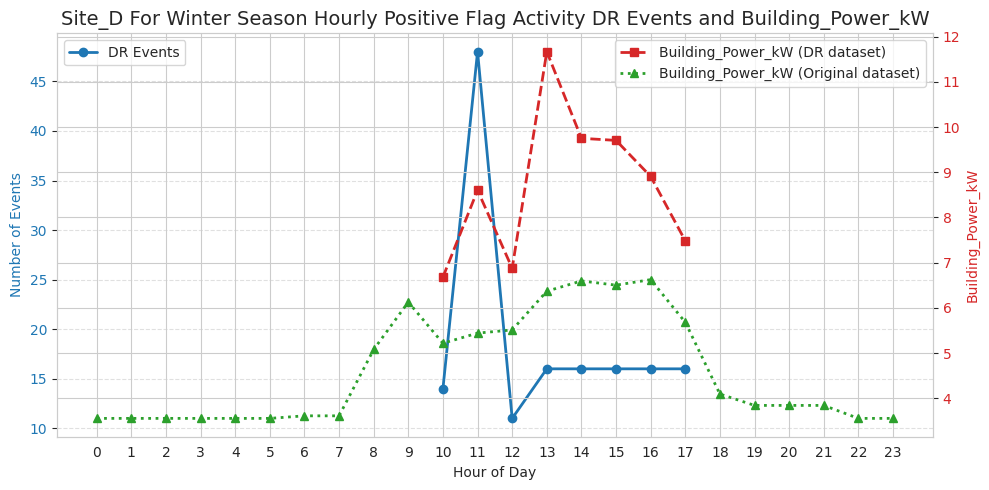

                      Site  Dry_Bulb_Temperature_C  Global_Horizontal_Radiation_W/m2  Building_Power_kW  Demand_Response_Flag  Hour  Weekday  Is_Weekend        Date  Month  Season  is_neg  is_pos  is_neutral  Event_Change Event_ID
Timestamp_Local                                                                                                                                                                                                                       
2020-07-21 04:30:00  siteD                   13.15                                 0               4.80                   0.0     4        1       False  2020-07-21      7  Winter       0       0           1            45   0.0_45
2020-05-18 11:00:00  siteD                   22.13                               657               7.94                   0.0    11        0       False  2020-05-18      5  Autumn       0       0           1            15   0.0_15
2020-07-23 07:15:00  siteD                   13.73                          

In [ ]:
dict={"Site_A":site_A_dataset,
      "Site_B":site_B_dataset,
      "Site_C":site_C_dataset,
      "Site_D":site_D_dataset
      }

for key, value in dict.items():
  analyzing_abcd(value,key)
  print("*"*90)

In [ ]:
def plot_variable_profiles_for_capacity_flag_temp_gh_power(df_activity, df_orig, dr_cap, variable, df_name,sign):


  for season in df_activity['Season'].unique():
    df_season=df_activity[df_activity['Season']==season]
    df_orig_season=df_orig[df_orig['Season']==season]

    # -------------------
    # Average 24-hour profile
    fig, ax1 = plt.subplots(figsize=(10,5))

    hourly_profile_dr = df_season.groupby('Hour')[dr_cap].sum()

    if variable == 'Demand_Response_Flag':
      hourly_profile_var = df_season.groupby('Hour')[variable].sum()
    else:
      hourly_profile_var = df_season.groupby('Hour')[variable].mean()

    hourly_profile_var_orig = df_orig_season.groupby('Hour')[variable].mean()

    # Left y-axis: counts
    ax1.plot(hourly_profile_dr.index, hourly_profile_dr.values, color="tab:blue", linewidth=2, marker="o")
    ax1.set_xlabel("Hour of Day")
    ax1.set_ylabel("Average Capacity", color="tab:blue")
    ax1.tick_params(axis="y", labelcolor="tab:blue")
    ax1.set_xticks(range(24))
    ax1.grid(axis="y", linestyle="--", alpha=0.6)

    # Right y-axis: another metric
    ax2 = ax1.twinx()
    ax2.plot(hourly_profile_var.index, hourly_profile_var.values,
            color="tab:red", linewidth=2, marker="s", linestyle="--", label=f"{variable} (DR dataset)")
    ax2.plot(hourly_profile_var_orig.index, hourly_profile_var_orig.values,
            color="tab:green", linewidth=2, marker="^", linestyle=":", label=f"{variable} (Original dataset)")

    ax2.set_ylabel(f"{variable}", color="tab:red")
    ax2.tick_params(axis="y", labelcolor="tab:red")
    ax2.set_xticks(range(24))

    # Add legends
    ax1.legend(["DR Capacity"], loc="upper left")
    ax2.legend(loc="upper right")



    plt.title(f"{df_name} For {season} Season Hourly {sign} DR Events and {variable}", fontsize=14)
    plt.tight_layout()
    plt.show()


In [ ]:
def compare_profiles(flag_mismatch, flag_normal, var_list, sign, title_prefix="",):
    flag_mismatch = flag_mismatch.copy()
    flag_normal = flag_normal.copy()

    flag_mismatch["Group"] = "Mismatch"
    flag_normal["Group"] = "Normal"

    df_compare = pd.concat([flag_mismatch, flag_normal])

    for var in var_list:
        # compute min, mean, max per group, season & hour
        hourly_stats = (
            df_compare
            .groupby(["Season", "Group", "Hour"])[var]
            .agg(["min","mean","max"])
            .reset_index()
        )

        # loop through seasons
        for season in hourly_stats["Season"].unique():
            season_data = hourly_stats[hourly_stats["Season"] == season]

            plt.figure(figsize=(12,6))

            # plot for mismatch & normal within this season
            for group in season_data["Group"].unique():
                subset = season_data[season_data["Group"] == group]

                # mean line
                plt.plot(subset["Hour"], subset["mean"], marker="o", label=f"{group} – mean")

                # min/max band
                plt.fill_between(
                    subset["Hour"],
                    subset["min"],
                    subset["max"],
                    alpha=0.2,
                    label=f"{group} – min/max"
                )

            plt.title(f"{title_prefix} {season} {sign} Hourly {var} Profile – {season} (Mismatch vs Normal)", fontsize=14)
            plt.xlabel("Hour of Day")
            plt.ylabel(var)
            plt.xticks(range(24))
            plt.grid(axis="y", linestyle="--", alpha=0.6)
            plt.legend()
            plt.tight_layout()
            plt.show()


In [ ]:
def analyzing_abc(df, df_name):
    df = make_time_numeric(df)
    df['Season'] = df['Month'].apply(get_season_au)

    # keep only flag activity
    flag_activity_neg = df[df['Demand_Response_Flag']==-1].copy()
    flag_activity_zero = df[df['Demand_Response_Flag']==0].copy()
    flag_activity_pos = df[df['Demand_Response_Flag']==1].copy()

    capacity_neg = df[df['Demand_Response_Capacity_kW'] < 0].copy()
    capacity_zero = df[df['Demand_Response_Capacity_kW'] == 0].copy()
    capacity_pos = df[df['Demand_Response_Capacity_kW'] > 0].copy()

    flag_activity_neg['time_only_neg'] = flag_activity_neg.index.time
    flag_activity_zero['time_only_zero'] = flag_activity_zero.index.time
    flag_activity_pos['time_only_pos'] = flag_activity_pos.index.time

    capacity_neg['time_only_neg'] = capacity_neg.index.time
    capacity_zero['time_only_zero'] = capacity_zero.index.time
    capacity_pos['time_only_pos'] = capacity_pos.index.time


    flag_capacity_mismatch_for_neg = flag_activity_neg[flag_activity_neg["Demand_Response_Capacity_kW"]>0]
    flag_capacity_both_neg = flag_activity_neg[flag_activity_neg["Demand_Response_Capacity_kW"]<0]

    flag_capacity_mismatch_for_pos = flag_activity_pos[flag_activity_pos["Demand_Response_Capacity_kW"]<0]
    flag_capacity_both_pos = flag_activity_pos[flag_activity_pos["Demand_Response_Capacity_kW"]>0]

    #pretty_print(flag_capacity_mismatch_for_neg, "Negative Flag Activity with Capacity Mismatch")
    #pretty_print(flag_capacity_mismatch_for_pos, "Positive Flag Activity with Capacity Mismatch")

    var_list=['Building_Power_kW']

    compare_profiles(flag_capacity_mismatch_for_neg, flag_capacity_both_neg, var_list,'Negative Flag', title_prefix=f"{df_name}",)
    compare_profiles(flag_capacity_mismatch_for_pos, flag_capacity_both_pos, var_list,'Positive Flag', title_prefix=f"{df_name}")



    """for var in var_list:
      plot_variable_profiles_for_capacity_flag_temp_gh_power(capacity_neg, df, "Demand_Response_Capacity_kW", var, df_name,"Negative Flag Capacity")
      plot_variable_profiles_for_capacity_flag_temp_gh_power(capacity_pos, df, "Demand_Response_Capacity_kW", var, df_name,"Positive Flag Capacity")
"""

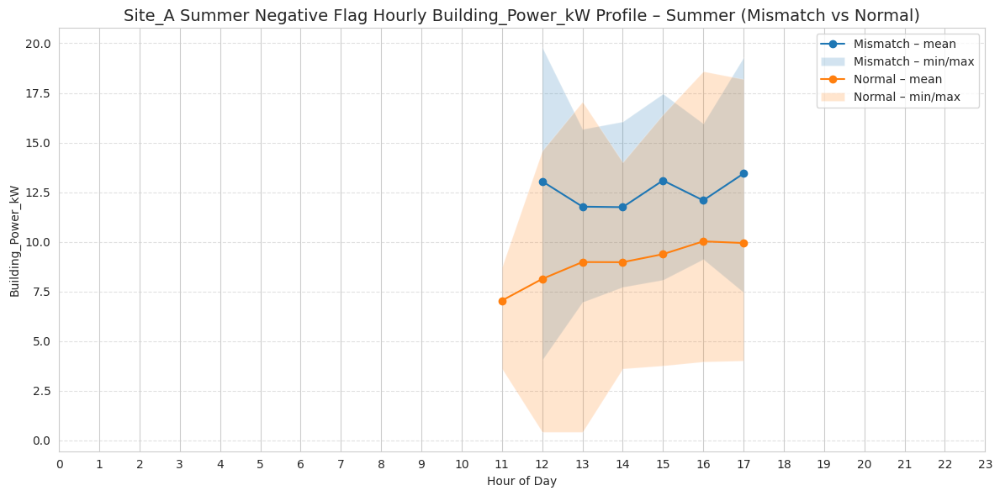

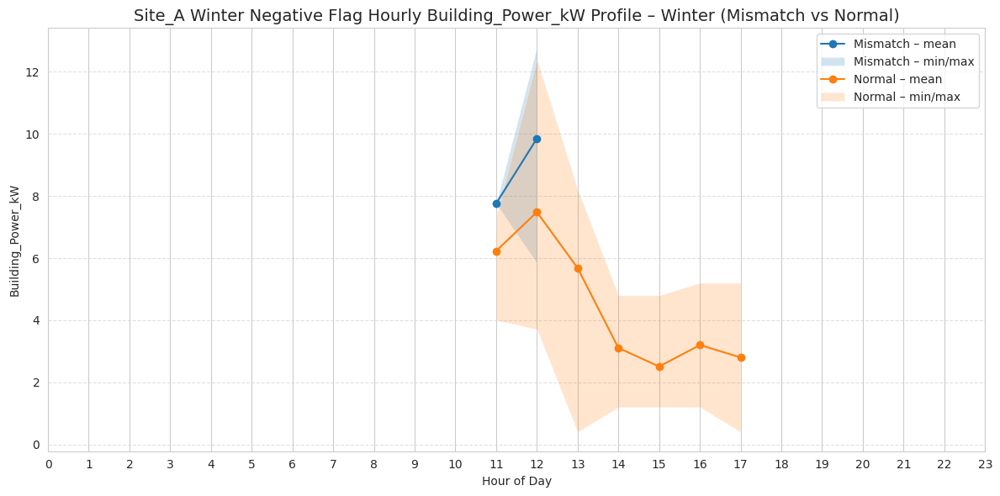

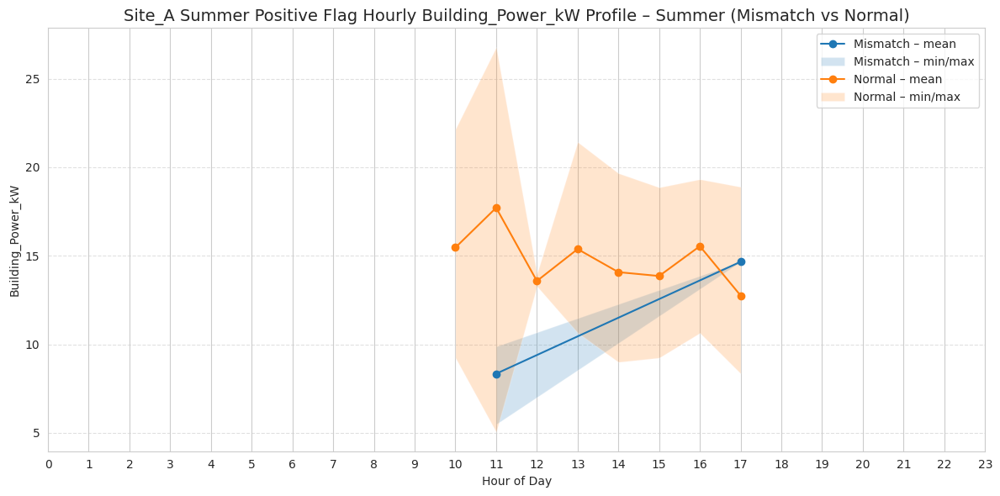

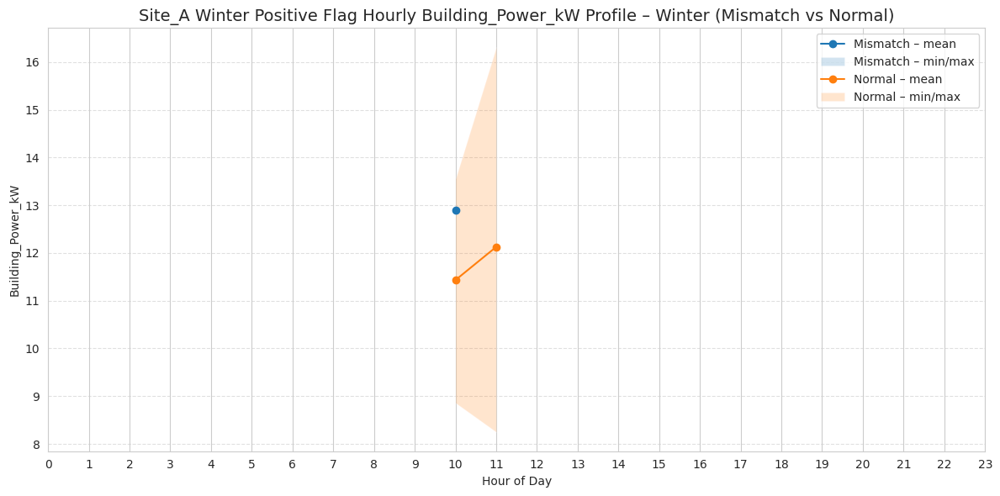

In [ ]:
analyzing_abc(site_A_dataset,"Site_A")

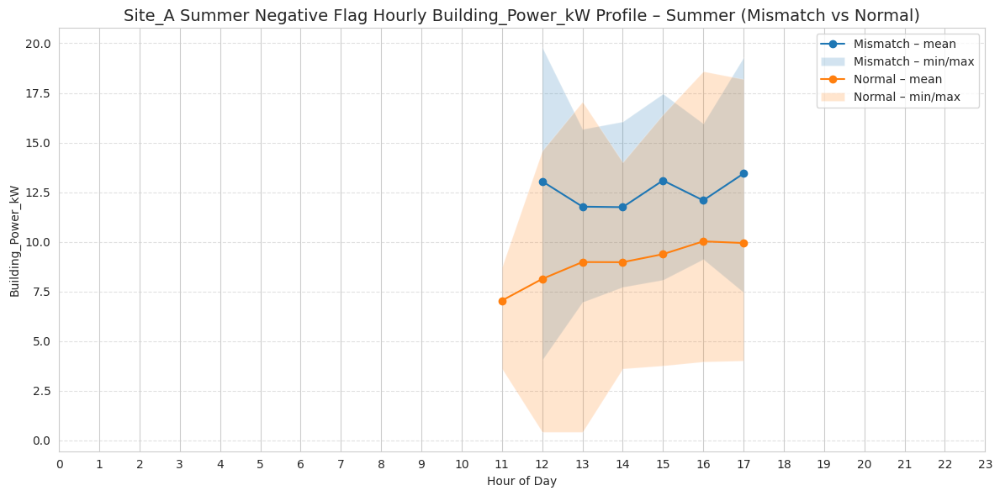

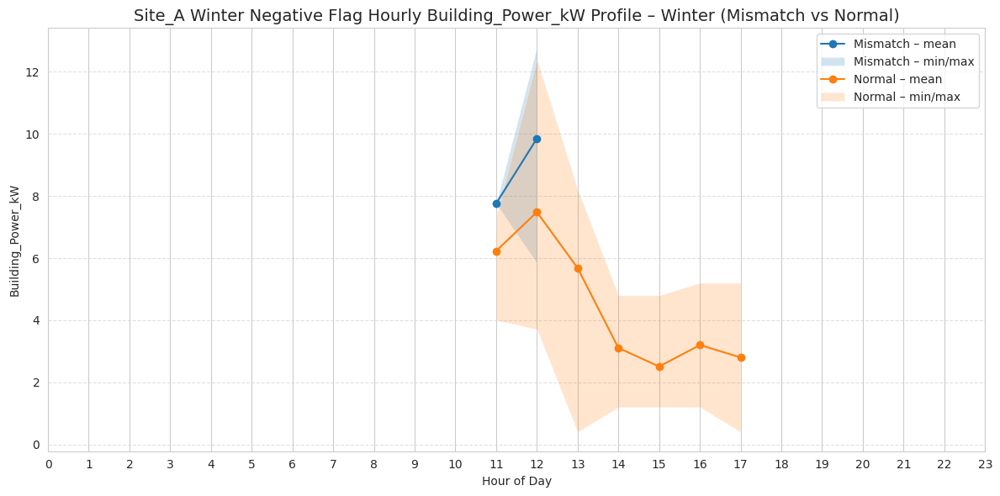

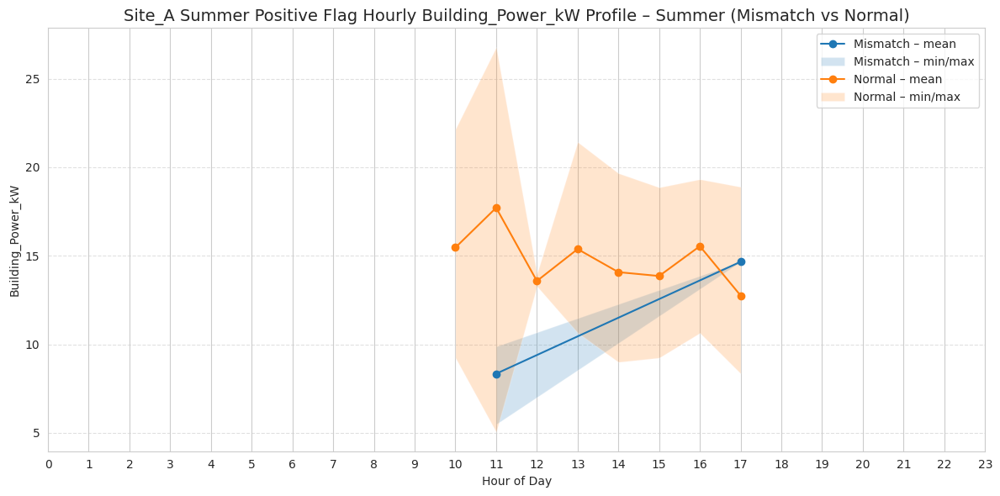

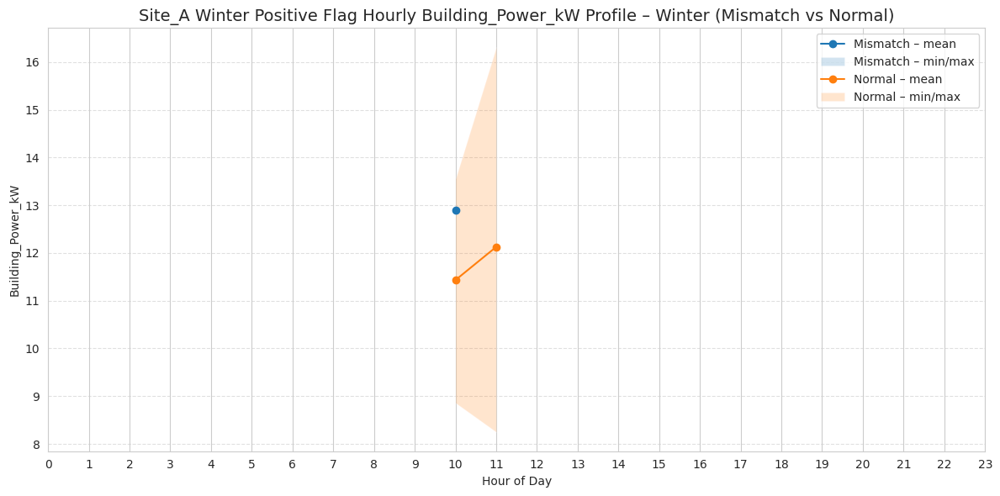

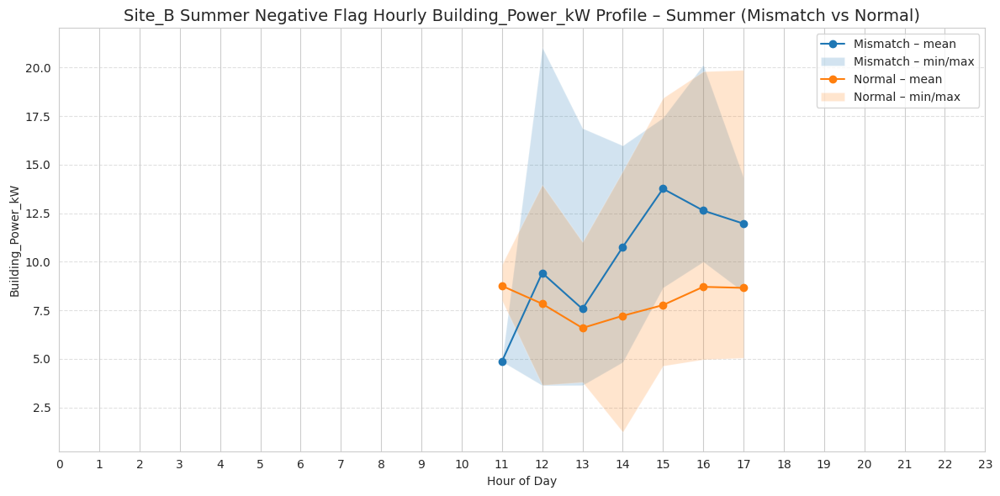

...

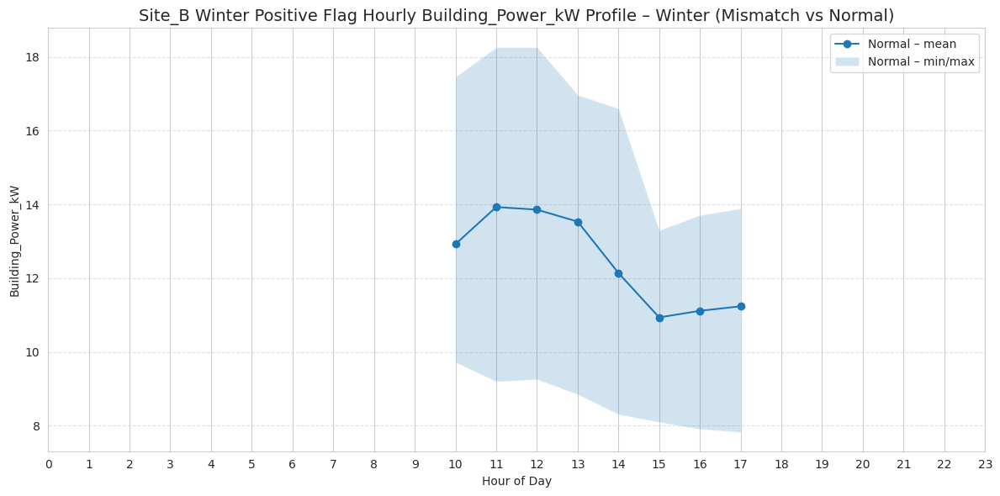

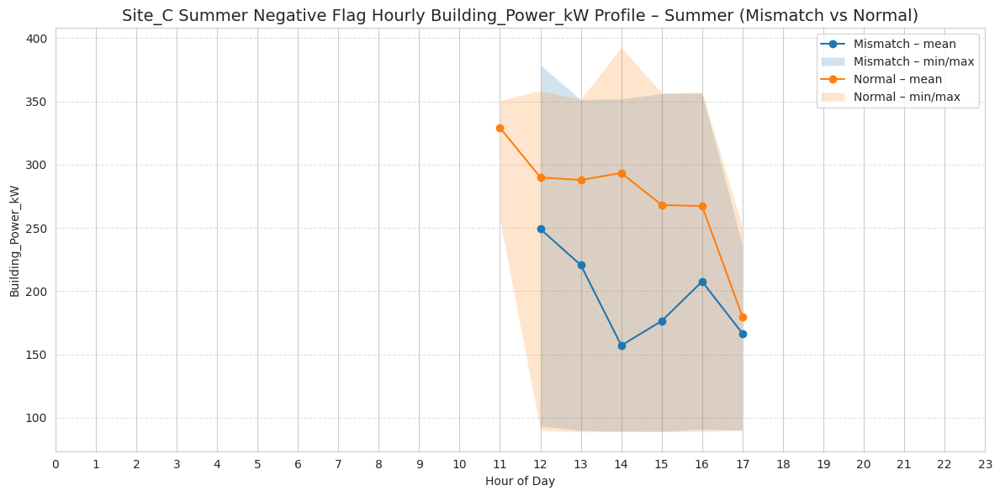

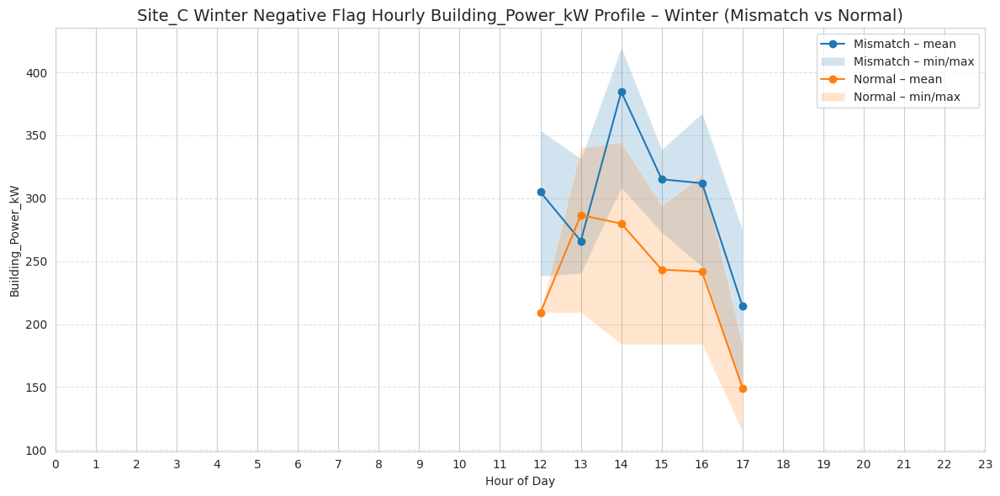

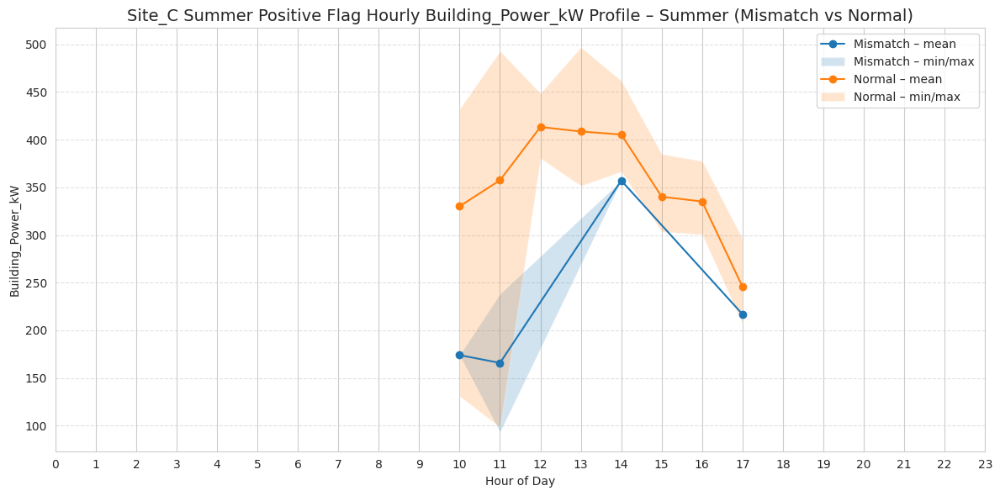

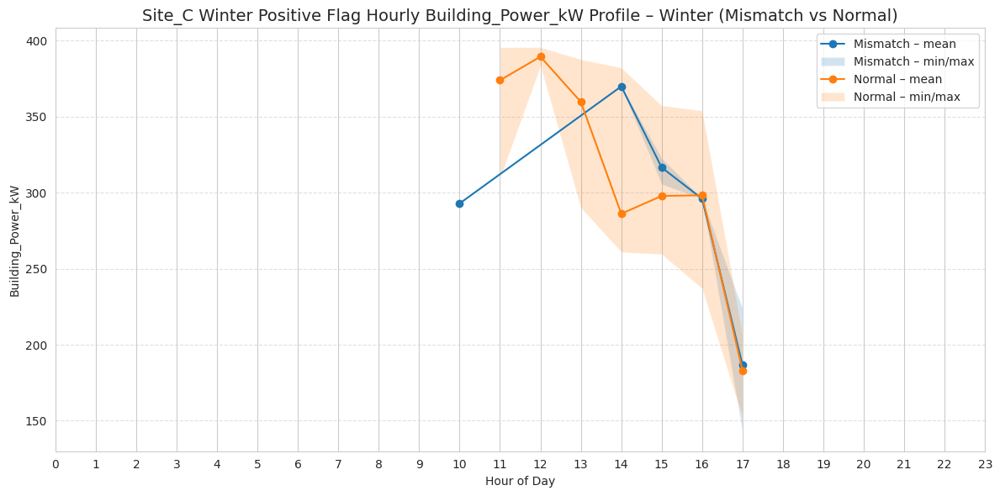

In [ ]:
dict={"Site_A":site_A_dataset,
      "Site_B":site_B_dataset,
      "Site_C":site_C_dataset,
      }

for key, value in dict.items():
  analyzing_abc(value,key)

In [ ]:
def flag_analysis(df,df_name):
  print(f'{df_name} FLAG ANALYSİS')

  df=make_time_numeric(df)
  df['Season'] = df['Month'].apply(get_season_au)
  flag_counts_day = (
        df.groupby(df.index.date)['Demand_Response_Flag']
        .value_counts()
        .unstack(fill_value=0)
    )
    # group by month
  flag_counts_month = (
      df.groupby(pd.Grouper(freq='M'))['Demand_Response_Flag']
        .value_counts()
        .unstack(fill_value=0)
  )
  # group by season
  flag_counts_season = (
      df.groupby('Season')['Demand_Response_Flag']
        .value_counts()
        .unstack(fill_value=0)
  )

  flag_activity = df[df['Demand_Response_Flag'].isin([-1,1])].copy()
  flag_activity_neg = df[df['Demand_Response_Flag'].isin([-1])].copy()
  flag_activity_pos = df[df['Demand_Response_Flag'].isin([1])].copy()
  flag_activity_zero = df[df['Demand_Response_Flag'].isin([0])].copy()

  # extract just the time part (HH:MM)
  flag_activity['time_only']=flag_activity.index.time
  flag_activity_neg['time_only_neg'] = flag_activity_neg.index.time
  flag_activity_pos['time_only_pos'] = flag_activity_pos.index.time
  flag_activity_zero['time_only_zero'] = flag_activity_zero.index.time

  flag_time_counts = (
      flag_activity['time_only']
      .value_counts()
      .sort_values(ascending=False)
  )

  # count occurrences of each time
  flag_time_counts_neg = (
      flag_activity_neg['time_only_neg']
      .value_counts()
      .sort_values(ascending=False)
  )

  # count occurrences of each time
  flag_time_counts_pos = (
      flag_activity_pos['time_only_pos']
      .value_counts()
      .sort_values(ascending=False)
  )

  flag_time_counts_zero = (
      flag_activity_zero['time_only_zero']
      .value_counts()
      .sort_values(ascending=False)
  )

  # Create full day time index at 15-min intervals
  full_day = pd.date_range("00:00", "23:45", freq="15min").time

  # Reindex your counts to include all times (fill missing with 0)
  flag_time_counts = flag_time_counts.reindex(full_day, fill_value=0)

  flag_time_counts_neg = flag_time_counts_neg.reindex(full_day, fill_value=0)
  flag_time_counts_pos = flag_time_counts_pos.reindex(full_day, fill_value=0)
  flag_time_counts_zero = flag_time_counts_zero.reindex(full_day, fill_value=0)

  combined_neg_pos=pd.concat([flag_time_counts_neg,flag_time_counts_pos,flag_time_counts_zero],axis=1)
  combined_neg_pos.columns=["neg_Flag_Count","pos_Flag_Count","zero_Flag_Count"]

  #pretty_print(combined_neg_pos, "Negative And Positive Flag Activity by Time of Day")

  return combined_neg_pos

  """flag_counts_weekend=(
      df.groupby('Is_Weekend')['Demand_Response_Flag']
        .value_counts()
        .unstack(fill_value=0)
  )
  # group by weekday (0=Monday, 6=Sunday) and count
  flag_counts_weekday_total = (
      flag_activity.groupby(flag_activity.index.weekday)['Demand_Response_Flag']
                  .count()
  )
  # optional: rename index to weekday names
  flag_counts_weekday_total.index = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']"""


  """pretty_print(flag_time_counts, "Frequent Times")
  pretty_print(flag_counts_weekend, "Weekend Flag Counts")
  pretty_print(flag_counts_day.sample(10), "Daily Flag Counts")
  pretty_print(flag_counts_month, "Monthly Flag Counts")
  pretty_print(flag_counts_season, "Seasonal Flag Counts")"""


  """# Ploting flag activity by time , for instance site_A on 2.45 had 28 flag activity in total
  plt.figure(figsize=(14,6))
  flag_time_counts.plot(kind='bar', color='steelblue')

  plt.title(f"{df_name} – Flag Activity by Time of Day", fontsize=14)
  plt.xlabel("Time of Day", fontsize=12)
  plt.ylabel("Flag Count", fontsize=12)
  plt.xticks(range(len(full_day)), [t.strftime("%H:%M") for t in full_day],
              rotation=90, fontsize=8)
  plt.grid(axis='y', linestyle='--', alpha=0.6)
  plt.tight_layout()
  plt.show()


  # Ploting flag activity by time , for instance site_A had 130 flag activity on monday for the year
  plt.figure(figsize=(14,6))
  flag_counts_weekday_total.plot(kind='bar', color='steelblue')

  plt.title(f"{df_name} – Flag Activity by Day of Week", fontsize=14)
  plt.xlabel("Day of Week", fontsize=12)
  plt.ylabel("Flag Count", fontsize=12)
  plt.xticks(ticks=range(7), labels=['Mon','Tue','Wed','Thu','Fri','Sat','Sun'],
            rotation=90, fontsize=10)

  plt.grid(axis='y', linestyle='--', alpha=0.6)
  plt.tight_layout()
  plt.show()"""



In [ ]:
dict={"Site_B":site_B_dataset,
      "Site_C":site_C_dataset,
      "Site_D":site_D_dataset,
      }

total_neg_pos_count_df=flag_analysis(site_A_dataset,"Site_A")


for key, value in dict.items():
  total_neg_pos_count_df=flag_analysis(value,key)+total_neg_pos_count_df

total_neg_pos_count_df.to_csv("total_neg_pos_count_df.csv")
files.download("total_neg_pos_count_df.csv")
pretty_print(total_neg_pos_count_df,"Total Flag Analysis")

Site_A FLAG ANALYSİS
Site_B FLAG ANALYSİS


/tmp/ipython-input-1057468733.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df.groupby(pd.Grouper(freq='M'))['Demand_Response_Flag']
/tmp/ipython-input-1057468733.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df.groupby(pd.Grouper(freq='M'))['Demand_Response_Flag']
/tmp/ipython-input-1057468733.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df.groupby(pd.Grouper(freq='M'))['Demand_Response_Flag']


Site_C FLAG ANALYSİS
Site_D FLAG ANALYSİS


/tmp/ipython-input-1057468733.py:13: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df.groupby(pd.Grouper(freq='M'))['Demand_Response_Flag']


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


=== Total Flag Analysis ===
+----------+------------------+------------------+-------------------+
| index    |   neg_Flag_Count |   pos_Flag_Count |   zero_Flag_Count |
|----------+------------------+------------------+-------------------|
| 00:00:00 |                0 |                0 |              1460 |
| 00:15:00 |                0 |                0 |              1460 |
| 00:30:00 |                0 |                0 |              1460 |
| 00:45:00 |                0 |                0 |              1460 |
| 01:00:00 |                0 |                0 |              1460 |
| 01:15:00 |                0 |                0 |              1460 |
| 01:30:00 |                0 |                0 |              1460 |
| 01:45:00 |                0 |                0 |              1460 |
| 02:00:00 |                0 |                0 |              1460 |
| 02:15:00 |                0 |                0 |              1460 |
| 02:30:00 |                0 |                0

In [ ]:
total_neg_pos_count_df['signed_ratio']=(total_neg_pos_count_df['pos_Flag_Count'] - total_neg_pos_count_df['neg_Flag_Count'])/(total_neg_pos_count_df['pos_Flag_Count']+total_neg_pos_count_df['neg_Flag_Count']+total_neg_pos_count_df['zero_Flag_Count'])
total_neg_pos_count_df.fillna(0,inplace=True)
pretty_print(total_neg_pos_count_df,"Total Flag Analysis")

"""total_neg_pos_count_df.to_csv("total_neg_pos_count_df.csv")
files.download("total_neg_pos_count_df.csv")"""



=== Total Flag Analysis ===
+----------+------------------+------------------+-------------------+----------------+
| index    |   neg_Flag_Count |   pos_Flag_Count |   zero_Flag_Count |   signed_ratio |
|----------+------------------+------------------+-------------------+----------------|
| 00:00:00 |                0 |                0 |              1460 |      0         |
| 00:15:00 |                0 |                0 |              1460 |      0         |
| 00:30:00 |                0 |                0 |              1460 |      0         |
| 00:45:00 |                0 |                0 |              1460 |      0         |
| 01:00:00 |                0 |                0 |              1460 |      0         |
| 01:15:00 |                0 |                0 |              1460 |      0         |
| 01:30:00 |                0 |                0 |              1460 |      0         |
| 01:45:00 |                0 |                0 |              1460 |      0         |
| 0

'total_neg_pos_count_df.to_csv("total_neg_pos_count_df.csv")\nfiles.download("total_neg_pos_count_df.csv")'

In [ ]:
def flag_analysis_by_Dry_Bulb_Temperature_C_GHI_Power(df,df_name):
  print(f'{df_name} FLAG ANALYSİS BY TEMPERATURE')

  df=make_time_numeric(df)
  df['Season'] = df['Month'].apply(get_season_au)


  month_list=["Summer","Autumn","Winter","Spring"]

  total_pos_before_12=0
  total_neg_before_12=0
  total_neg_after_12=0
  total_pos_after_12=0

  for month in month_list:

    df_season=df[df['Season']==month]

    # group by month

    print(f'{month} flag analysis')

    # keep only flag activity
    season_flag_activity_neg = df_season[df_season['Demand_Response_Flag'].isin([-1])].copy()
    season_flag_activity_pos = df_season[df_season['Demand_Response_Flag'].isin([1])].copy()

    # extract just the time part (HH:MM)
    season_flag_activity_neg['time_only_neg'] = season_flag_activity_neg.index.time
    season_flag_activity_pos['time_only_pos'] = season_flag_activity_pos.index.time
    df_season['time_only'] = df_season.index.time

    # count occurrences of each time
    season_flag_time_counts_neg = (
        season_flag_activity_neg['time_only_neg']
        .value_counts()
        .sort_values(ascending=False)
    )

    # count occurrences of each time
    season_flag_time_counts_pos = (
        season_flag_activity_pos['time_only_pos']
        .value_counts()
        .sort_values(ascending=False)
    )

    # --- FIX: index doesn't have .hour, extract hours from each element ---
    # handles datetime.time objects (or strings that parse to time if needed)
    try:
        neg_hours = np.array([t.hour for t in season_flag_time_counts_neg.index])
        pos_hours = np.array([t.hour for t in season_flag_time_counts_pos.index])
    except Exception:
        # fallback: try to parse strings to time
        def _hour_from_str(x):
            if isinstance(x, str):
                # assume format "HH:MM[:SS]"
                return int(x.split(":")[0])
            raise
        neg_hours = np.array([_hour_from_str(t) for t in season_flag_time_counts_neg.index])
        pos_hours = np.array([_hour_from_str(t) for t in season_flag_time_counts_pos.index])

    # negative flags
    total_neg_before_12 = season_flag_time_counts_neg[neg_hours < 12].sum() + total_neg_before_12
    total_neg_after_12 = season_flag_time_counts_neg[neg_hours >= 12].sum() + total_neg_after_12

    # positive flags
    total_pos_before_12 = season_flag_time_counts_pos[pos_hours < 12].sum() + total_pos_before_12
    total_pos_after_12 = season_flag_time_counts_pos[pos_hours >= 12].sum() + total_pos_after_12

    print(f"Total Neg Before 12: {total_neg_before_12}")
    print(f"Total Pos Before 12: {total_pos_before_12}")
    print(f"Total Neg After 12: {total_neg_after_12}")
    print(f"Total Pos After 12: {total_pos_after_12}")

    # Create full day time index at 15-min intervals
    full_day = pd.date_range("00:00", "23:45", freq="15min").time

    season_flag_time_counts_neg = season_flag_time_counts_neg.reindex(full_day, fill_value=0)
    season_flag_time_counts_pos = season_flag_time_counts_pos.reindex(full_day, fill_value=0)

    seasonal_pos_neg_combined = pd.DataFrame({
      "neg_Flag_Count": season_flag_time_counts_neg,
      "pos_Flag_Count": season_flag_time_counts_pos
    })

    #pretty_print(seasonal_pos_neg_combined, "Seasonal Flag Counts")


    rename_map = {
      "Dry_Bulb_Temperature_C": "Temp",
      "Global_Horizontal_Radiation_W/m2": "GHI",
      "Building_Power_kW": "Power"
      }

    season_avg_by_time_flgbased_neg=season_flag_activity_neg.groupby('time_only_neg').agg({
        'Dry_Bulb_Temperature_C': ['min','median','mean','max','std'],
        'Global_Horizontal_Radiation_W/m2': ['min','median','mean','max','std'],
        'Building_Power_kW': ['min','median','mean','max','std']
        }).reindex(full_day, fill_value=np.nan)

    # Flatten MultiIndex columns using rename_map
    season_avg_by_time_flgbased_neg.columns = [
        f"{rename_map[col[0]]}_{col[1]}" for col in season_avg_by_time_flgbased_neg.columns
        ]

    season_avg_by_time_flgbased_pos=season_flag_activity_pos.groupby('time_only_pos').agg({
        'Dry_Bulb_Temperature_C': ['min','median','mean','max','std'],
        'Global_Horizontal_Radiation_W/m2': ['min','median','mean','max','std'],
        'Building_Power_kW': ['min','median','mean','max','std']
        }).reindex(full_day, fill_value=np.nan)

    season_avg_by_time_flgbased_pos.columns = [
      f"{rename_map[col[0]]}_{col[1]}" for col in season_avg_by_time_flgbased_pos.columns
      ]


    # Average temperature, GHI, and Power per 15min slot
    avg_by_time_neg = df_season.groupby('time_only').agg({
        'Dry_Bulb_Temperature_C': ['min','median','mean','max','std'],
        'Global_Horizontal_Radiation_W/m2': ['min','median','mean','max','std'],
        'Building_Power_kW': ['min','median','mean','max','std']
    }).reindex(full_day, fill_value=np.nan)

    # Flatten MultiIndex (min, mean, max)
    avg_by_time_neg.columns = [
        f"{col[0]}_{col[1]}" for col in avg_by_time_neg.columns
    ]

    neg_combined_analysis = pd.concat(
    [
        season_flag_time_counts_neg.rename("neg_Flag_Count"),
        avg_by_time_neg.add_prefix("neg_metrics_"),
        season_avg_by_time_flgbased_neg.add_prefix("neg_avgflg_")
    ],
    axis=1
    )

    """print("\n=== -1 Combined by Time (15min) ===")
    pretty_print(neg_combined_analysis,"neg_combined_analysis")"""


    # Average temperature, GHI, and Power per 15min slot
    avg_by_time_pos = df_season.groupby('time_only').agg({
        'Dry_Bulb_Temperature_C': ['min','median','mean','max','std'],
        'Global_Horizontal_Radiation_W/m2': ['min','median','mean','max','std'],
        'Building_Power_kW': ['min','median','mean','max','std']
    }).reindex(full_day, fill_value=np.nan)

    # Flatten MultiIndex (min, mean, max)
    avg_by_time_pos.columns = [
        f"{col[0]}_{col[1]}" for col in avg_by_time_pos.columns
    ]


    pos_combined_analysis = pd.concat(
    [
        season_flag_time_counts_pos.rename("pos_Flag_Count"),
        avg_by_time_pos.add_prefix("pos_metrics_"),
        season_avg_by_time_flgbased_pos.add_prefix("pos_avgflg_")
    ],
    axis=1
    )

    """print("\n=== +1 Combined by Time (15min) ===")
    pretty_print(pos_combined_analysis,"pos_combined_analysis")"""

    """# --- NEGATIVE FLAGS ---
    plt.figure(figsize=(14,6))
    season_flag_time_counts_neg.plot(kind='bar', color='red', alpha=0.7)
    plt.title(f"{df_name} – {month}: Negative Flag Activity by Time of Day", fontsize=14)
    plt.xlabel("Time of Day", fontsize=12)
    plt.ylabel("-1 Flag Count", fontsize=12)
    plt.xticks(range(len(full_day)), [t.strftime("%H:%M") for t in full_day],
                rotation=90, fontsize=7)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

    # --- POSITIVE FLAGS ---
    plt.figure(figsize=(14,6))
    season_flag_time_counts_pos.plot(kind='bar', color='green', alpha=0.7)
    plt.title(f"{df_name} – {month}: Positive Flag Activity by Time of Day", fontsize=14)
    plt.xlabel("Time of Day", fontsize=12)
    plt.ylabel("+1 Flag Count", fontsize=12)
    plt.xticks(range(len(full_day)), [t.strftime("%H:%M") for t in full_day],
                rotation=90, fontsize=7)
    plt.grid(axis='y', linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
###########################################################################


    # Now just loop through variables and flag types
    variables = [
        ("Dry_Bulb_Temperature_C", "Temperature (°C)"),
        ("Global_Horizontal_Radiation_W/m2", "GHI (W/m²)"),
        ("Building_Power_kW", "Power (kW)")
    ]

    for var, ylabel in variables:
        plot_flag_comparison(df_name, month, neg_combined_analysis, var, ylabel, "NEG")
        plot_flag_comparison(df_name, month, pos_combined_analysis, var, ylabel, "POS")

"""

In [ ]:
dict={"Site_A":site_A_dataset,
      "Site_B":site_B_dataset,
      "Site_C":site_C_dataset,
      "Site_D":site_D_dataset,
      }

for key, value in dict.items():
  #agg_your_data(value,key)
  #flag_analysis(value,key)
  flag_analysis_by_Dry_Bulb_Temperature_C_GHI_Power(value,key)



/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time


Site_A FLAG ANALYSİS BY TEMPERATURE
Summer flag analysis
Total Neg Before 12: 9
Total Pos Before 12: 55
Total Neg After 12: 334
Total Pos After 12: 44
Autumn flag analysis
Total Neg Before 12: 9
Total Pos Before 12: 55
Total Neg After 12: 334
Total Pos After 12: 44
Winter flag analysis
Total Neg Before 12: 13
Total Pos Before 12: 96
Total Neg After 12: 618
Total Pos After 12: 44
Spring flag analysis
Total Neg Before 12: 13
Total Pos Before 12: 96
Total Neg After 12: 618
Total Pos After 12: 44


/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time
/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time
/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

Site_B FLAG ANALYSİS BY TEMPERATURE
Summer flag analysis
Total Neg Before 12: 6
Total Pos Before 12: 75
Total Neg After 12: 380
Total Pos After 12: 134
Autumn flag analysis
Total Neg Before 12: 6
Total Pos Before 12: 75
Total Neg After 12: 380
Total Pos After 12: 134
Winter flag analysis
Total Neg Before 12: 10
Total Pos Before 12: 136
Total Neg After 12: 666
Total Pos After 12: 297
Spring flag analysis
Total Neg Before 12: 10
Total Pos Before 12: 136
Total Neg After 12: 666
Total Pos After 12: 297


/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time
/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time
/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

Site_C FLAG ANALYSİS BY TEMPERATURE
Summer flag analysis
Total Neg Before 12: 10
Total Pos Before 12: 79
Total Neg After 12: 539
Total Pos After 12: 68
Autumn flag analysis
Total Neg Before 12: 10
Total Pos Before 12: 79
Total Neg After 12: 539
Total Pos After 12: 68
Winter flag analysis
Total Neg Before 12: 15
Total Pos Before 12: 136
Total Neg After 12: 940
Total Pos After 12: 138
Spring flag analysis
Total Neg Before 12: 15
Total Pos Before 12: 136
Total Neg After 12: 940
Total Pos After 12: 138
Site_D FLAG ANALYSİS BY TEMPERATURE


/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time
/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time
/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

Summer flag analysis
Total Neg Before 12: 5
Total Pos Before 12: 63
Total Neg After 12: 309
Total Pos After 12: 45
Autumn flag analysis
Total Neg Before 12: 5
Total Pos Before 12: 63
Total Neg After 12: 309
Total Pos After 12: 45
Winter flag analysis
Total Neg Before 12: 13
Total Pos Before 12: 125
Total Neg After 12: 669
Total Pos After 12: 136
Spring flag analysis
Total Neg Before 12: 17
Total Pos Before 12: 125
Total Neg After 12: 693
Total Pos After 12: 136


/tmp/ipython-input-301256609.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_season['time_only'] = df_season.index.time


In [ ]:
def capacity_analysis(df, df_name):
    print(f'{df_name} CAPACITY ANALYSIS')
    df = make_time_numeric(df)
    df['Season'] = df['Month'].apply(get_season_au)

    capacity_neg = df[df['Demand_Response_Capacity_kW'] < 0].copy()
    capacity_pos = df[df['Demand_Response_Capacity_kW'] > 0].copy()

    # extract just the time part (HH:MM)
    capacity_neg['time_only_neg'] = capacity_neg.index.time
    capacity_pos['time_only_pos'] = capacity_pos.index.time

    # sum capacities grouped by time
    flag_time_capacity_neg = (
        capacity_neg.groupby('time_only_neg')['Demand_Response_Capacity_kW']
        .sum()
    )

    flag_time_capacity_pos = (
        capacity_pos.groupby('time_only_pos')['Demand_Response_Capacity_kW']
        .sum()
    )

    # Create full day time index at 15-min intervals
    full_day = pd.date_range("00:00", "23:45", freq="15min").time

    flag_time_capacity_neg = flag_time_capacity_neg.reindex(full_day, fill_value=0)
    flag_time_capacity_pos = flag_time_capacity_pos.reindex(full_day, fill_value=0)

    flag_time_capacity_neg_pos = flag_time_capacity_neg.to_frame(name="neg_Capacity").join(
        flag_time_capacity_pos.to_frame(name="pos_Capacity")
    )

    print(flag_time_capacity_neg_pos)


In [ ]:
dict={"Site_A":site_A_dataset,
      "Site_B":site_B_dataset,
      "Site_C":site_C_dataset,
      "Site_D":site_D_dataset,
      }

for key, value in dict.items():
  capacity_analysis(site_A_dataset,"Site_A")

Site_A CAPACITY ANALYSIS
               neg_Capacity  pos_Capacity
time_only_neg                            
00:00:00               0.00          0.00
00:15:00               0.00          0.00
00:30:00               0.00          0.00
00:45:00               0.00          0.00
01:00:00               0.00          0.00
01:15:00               0.00          0.00
01:30:00               0.00          0.00
01:45:00               0.00          0.00
02:00:00               0.00          0.00
02:15:00               0.00          0.00
02:30:00               0.00          0.00
02:45:00               0.00          0.00
03:00:00               0.00          0.00
03:15:00               0.00          0.00
03:30:00               0.00          0.00
03:45:00               0.00          0.00
04:00:00               0.00          0.00
04:15:00               0.00          0.00
04:30:00               0.00          0.00
04:45:00               0.00          0.00
05:00:00               0.00          0.00
05:15:00 

In [ ]:
def capacity_flag_mismatch_prob(df, df_name):
    print(f'{df_name} CAPACITY ANALYSIS')
    df = make_time_numeric(df)
    df['Season'] = df['Month'].apply(get_season_au)

    capacity_neg = df[df['Demand_Response_Capacity_kW'] < 0].copy()
    capacity_pos = df[df['Demand_Response_Capacity_kW'] > 0].copy()

    # keep only flag activity
    flag_activity_neg = df[df['Demand_Response_Flag']==-1].copy()
    flag_activity_pos = df[df['Demand_Response_Flag']==1].copy()

    capacity_neg['time_only_neg'] = capacity_neg.index.time
    capacity_pos['time_only_pos'] = capacity_pos.index.time

    # extract just the time part (HH:MM)
    flag_activity_neg['time_only_neg'] = flag_activity_neg.index.time
    flag_activity_pos['time_only_pos'] = flag_activity_pos.index.time


    # sum capacities grouped by time
    flag_time_capacity_neg = (
        capacity_neg.groupby('time_only_neg')['Demand_Response_Capacity_kW']
        .sum()
    )

    flag_time_capacity_pos = (
        capacity_pos.groupby('time_only_pos')['Demand_Response_Capacity_kW']
        .sum()
    )

    # count occurrences of each time
    flag_time_counts_neg = (
        flag_activity_neg['time_only_neg']
        .value_counts()
        .sort_values(ascending=False)
    )

    flag_time_counts_pos = (
        flag_activity_pos['time_only_pos']
        .value_counts()
        .sort_values(ascending=False)
    )

    # Create full day time index at 15-min intervals
    full_day = pd.date_range("00:00", "23:45", freq="15min").time

    flag_time_capacity_count_neg = capacity_neg.reindex(full_day, fill_value=0)
    flag_time_capacity_count_pos = capacity_pos.reindex(full_day, fill_value=0)


    flag_time_capacity_neg = flag_time_capacity_neg.reindex(full_day, fill_value=0)
    flag_time_capacity_pos = flag_time_capacity_pos.reindex(full_day, fill_value=0)

    flag_time_counts_neg = flag_time_counts_neg.reindex(full_day, fill_value=0)
    flag_time_counts_pos = flag_time_counts_pos.reindex(full_day, fill_value=0)

    combined = pd.DataFrame({
            "flag_count_neg": flag_time_counts_neg,
            "capacity_count_neg": flag_time_capacity_count_neg,
            "capacity_neg": flag_time_capacity_neg,

            "flag_count_pos": flag_time_counts_pos,
            "capacity_count_pos": flag_time_capacity_count_pos,
            "capacity_pos": flag_time_capacity_pos
        })
    #print(combined)


In [ ]:
capacity_flag_mismatch_prob(site_A_dataset,"Site_A")

Site_A CAPACITY ANALYSIS


ValueError: 2

In [ ]:
def capacity_and_flag_analysis(df, df_name):
    print(f'{df_name} CAPACITY ANALYSIS')
    df = make_time_numeric(df)
    df['Season'] = df['Month'].apply(get_season_au)

    # Loop through seasons
    for season in ["Summer", "Autumn", "Winter", "Spring"]:
        #print(f"\n=== {season} Analysis ===")

        df_season = df[df['Season'] == season]

        capacity_neg = df_season[df_season['Demand_Response_Capacity_kW'] < 0].copy()
        capacity_pos = df_season[df_season['Demand_Response_Capacity_kW'] > 0].copy()

        #print(capacity_neg["Demand_Response_Capacity_kW"])

        capacity_neg_min_max_by_time =capacity_neg["Demand_Response_Capacity_kW"].groupby(capacity_neg.index.time).agg(["min", "max"])
        capacity_pos_min_max_by_time =capacity_pos["Demand_Response_Capacity_kW"].groupby(capacity_pos.index.time).agg(["min", "max"])


        # keep only flag activity
        flag_activity_neg = df_season[df_season['Demand_Response_Flag'].isin([-1])].copy()
        flag_activity_pos = df_season[df_season['Demand_Response_Flag'].isin([1])].copy()

        capacity_neg['time_only_neg'] = capacity_neg.index.time
        capacity_pos['time_only_pos'] = capacity_pos.index.time

        # extract just the time part (HH:MM)
        flag_activity_neg['time_only_neg'] = flag_activity_neg.index.time
        flag_activity_pos['time_only_pos'] = flag_activity_pos.index.time

        # count occurrences of each time
        flag_time_capacity_count_neg = (
            capacity_neg['time_only_neg']
            .value_counts()
            .sort_values(ascending=False)
        )

        flag_time_capacity_count_pos = (
            capacity_pos['time_only_pos']
            .value_counts()
            .sort_values(ascending=False)
        )

        # sum capacities grouped by time
        flag_time_capacity_neg = (
            capacity_neg.groupby('time_only_neg')['Demand_Response_Capacity_kW']
            .sum()
        )

        flag_time_capacity_pos = (
            capacity_pos.groupby('time_only_pos')['Demand_Response_Capacity_kW']
            .sum()
        )

        # count occurrences of each time
        flag_time_counts_neg = (
            flag_activity_neg['time_only_neg']
            .value_counts()
            .sort_values(ascending=False)
        )

        flag_time_counts_pos = (
            flag_activity_pos['time_only_pos']
            .value_counts()
            .sort_values(ascending=False)
        )

        # Create full day time index at 15-min intervals
        full_day = pd.date_range("00:00", "23:45", freq="15min").time

        flag_time_capacity_count_neg = flag_time_capacity_count_neg.reindex(full_day, fill_value=0)
        flag_time_capacity_count_pos = flag_time_capacity_count_pos.reindex(full_day, fill_value=0)

        flag_time_capacity_neg = flag_time_capacity_neg.reindex(full_day, fill_value=0)
        flag_time_capacity_pos = flag_time_capacity_pos.reindex(full_day, fill_value=0)

        flag_time_counts_neg = flag_time_counts_neg.reindex(full_day, fill_value=0)
        flag_time_counts_pos = flag_time_counts_pos.reindex(full_day, fill_value=0)

        combined = pd.DataFrame({
            "flag_count_neg": flag_time_counts_neg,
            "capacity_count_neg": flag_time_capacity_count_neg,
            "capacity_neg": flag_time_capacity_neg,
            "capacity_neg_min": capacity_neg_min_max_by_time["min"],
            "capacity_neg_max": capacity_neg_min_max_by_time["max"],

            "false_neg": flag_time_counts_neg - flag_time_capacity_count_neg,
            "flag_count_pos": flag_time_counts_pos,
            "capacity_count_pos": flag_time_capacity_count_pos,
            "capacity_pos": flag_time_capacity_pos,
            "capacity_pos_min": capacity_pos_min_max_by_time["min"],
            "capacity_pos_max": capacity_pos_min_max_by_time["max"]

        })

        print(combined)


In [ ]:
capacity_and_flag_analysis(site_A_dataset,"abc")

In [ ]:
dict={"Site_B":site_B_dataset,
      "Site_C":site_C_dataset,
      }

false_capacity_df=capacity_and_flag_analysis(site_A_dataset,"Site_A")
for key, value in dict.items():
  false_capacity_df=false_capacity_df + capacity_and_flag_analysis(value,key)

abs(false_capacity_df['false_neg']).sum()
false_capacity_df['flag_capacity_mismatch_prob']=abs(false_capacity_df['false_neg'])/abs(false_capacity_df['flag_count_neg']).sum()
#pretty_print(false_capacity_df,"False Capacity Analysis")

print(false_capacity_df)

false_capacity_df.to_csv("false_capacity_df.csv")
files.download("false_capacity_df.csv")